# <u>Image classification: SVM, KNN, ANN, Random Forest</u>  <br /> <sub> <span style="font-size:smaller;"> Jullian C.B. Williams </span> </sub> <br /> <sub> <span style="font-size:smaller;"> *Polish Academy of Sciences, Institute of Geophysics, Warsaw, Poland* </span> </sub>


In [ ]:
# !pip install shapely
# !pip install geopandas
# !pip install fiona
# !pip install rasterstats
# !pip install spectral
# !pip install pyarrow

In [1]:
import qgis

In [1]:
import emoji #<---- Death and taxes are for certain. Try to have fun before you're 6 feet too far under to.
from rich.console import Console #<---- Ditto.

import fiona
import random
import warnings
import argparse, os
import pyarrow as pa
from shapely.geometry import box
from shapely.geometry import shape
from shapely.geometry import Polygon
from shapely.affinity import translate

import numpy as np
import pandas as pd
from osgeo import ogr
from osgeo import gdal #<---- to geospatial env.
import geopandas as gpd

from PIL import Image

import rasterio.mask
import rasterio as rio
from rasterio.plot import show
from rasterio.plot import show_hist 
from rasterstats import zonal_stats
from rasterio.features import shapes
from rasterio.plot import adjust_band
from rasterio.features import rasterize

import seaborn as sns
import matplotlib.image
from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib import patches as mpatches
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

from spectral import *
from sklearn import svm
from scipy import stats
from scipy import ndimage
from sklearn.svm import SVC
from scipy.ndimage import zoom
from scipy.ndimage import sobel
from scipy.stats import entropy
import spectral.io.envi as envi #run PCA
from sklearn.svm import LinearSVC
from skimage import io, transform # from scipy.misc import imresize  <---- here...we...go..
from skimage.morphology import disk #manage disk while running.
from skimage.segmentation import slic
from skimage.util import img_as_ubyte #Avoid precision loss converting image of type float32 to uint8 as required by rank filters.
from skimage.filters.rank import entropy #for GLCM entropy.
from sklearn.pipeline import make_pipeline
from skimage.segmentation import chan_vese
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from skimage.feature import graycomatrix, graycoprops # from skimage.feature import greycomatrix, greycoprops <--- depreciated or..? lang.
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

%matplotlib inline

## Data exploration

#### Many ways to skin a cat <---- Look at the ways to get class accuracy from methods

In [12]:
# read data from csv file <---- Removing location info for now to run data smoothly
data = pd.read_csv('C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/merge_W_I_NOLOC.csv')
# print(data)

# splitting data into training and test set
training_set,test_set = train_test_split(data,test_size=0.2,random_state=1)
# print("train:",training_set)
# print("test:",test_set)

In [22]:
# prepare data for applying it to svm
x_train = training_set.iloc[:,0:3].values  # data
y_train = training_set.iloc[:,3].values  # target
x_test = test_set.iloc[:,0:3].values  # data
y_test = test_set.iloc[:,3].values  # target
#print(x_train,y_train)
print(x_test,y_test)

[[-2.59451962e+01 -2.91396084e+01  3.05808868e+01]
 [-2.56060982e+01 -2.99802723e+01  2.97953033e+01]
 [ 5.08488443e+05  8.53714363e+06 -1.11917496e+01]
 [-2.35769997e+01 -2.66587219e+01  2.85540028e+01]
 [-2.39926910e+01 -2.98778553e+01  2.84174232e+01]
 [-2.58651447e+01 -2.86625080e+01  3.04171104e+01]
 [-2.45789833e+01 -2.74654064e+01  2.97955418e+01]
 [-2.76269684e+01 -3.04926586e+01  3.01892643e+01]
 [ 5.03406940e+05  8.53290904e+06 -1.00105972e+01]
 [-2.87978058e+01 -3.00907822e+01  3.03948059e+01]
 [-2.51708717e+01 -2.85938568e+01  3.00240688e+01]
 [ 5.22020708e+05  8.54702126e+06 -1.50727720e+01]
 [ 5.24303702e+05  8.54372565e+06 -1.59655418e+01]
 [-2.80270443e+01 -2.74508057e+01  2.84594173e+01]
 [-2.66429730e+01 -2.81357174e+01  2.98274803e+01]
 [ 5.11839290e+05  8.53644400e+06 -1.05951681e+01]
 [ 5.18154347e+05  8.54197658e+06 -1.15017013e+01]
 [-2.63830357e+01 -2.84733257e+01  2.98345890e+01]
 [ 5.00198780e+05  8.54037020e+06 -1.35469732e+01]
 [ 4.99439317e+05  8.54931346e+

In [23]:
# fitting the data (train a model)
classifier = SVC(kernel='rbf',random_state=1,C=1,gamma='auto')
classifier.fit(x_train,y_train)

# perform prediction on x_test data
y_pred = classifier.predict(x_test)
test_set['prediction']=y_pred
print(y_pred)

# creating confusion matrix and accuracy calculation
cm = confusion_matrix(y_test,y_pred)
print(cm)
accuracy = float(cm.diagonal().sum())/len(y_test)
print('model accuracy is:',accuracy*100,'%')

['water' 'water' 'ice' 'water' 'water' 'water' 'water' 'water' 'ice'
 'water' 'water' 'ice' 'ice' 'water' 'water' 'ice' 'ice' 'water' 'ice'
 'ice' 'ice' 'water' 'water' 'ice' 'ice' 'water' 'water' 'ice' 'ice'
 'water' 'ice' 'water' 'water' 'ice' 'ice' 'ice' 'water' 'water' 'ice'
 'ice' 'ice']
[[19  0]
 [ 1 21]]
model accuracy is: 97.5609756097561 %


Confusion Matrix:
 [[19  0]
 [ 1 21]]


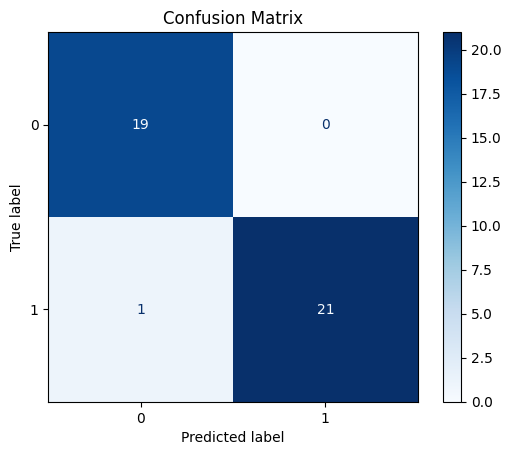

In [64]:
# Compute confusion matrix using test data
cnf_matrix_sklearn = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cnf_matrix_sklearn)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_sklearn, display_labels=[0, 1])
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [10]:
# read data from csv file
data = pd.read_csv('C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/merge_W_I_BINNOLOC.csv')
print(data)

        SAMPLE_1_2    SAMPLE_2_2  SAMPLE_3_2  id
0       -26.204203 -2.596121e+01   30.119364   0
1       -24.356628 -2.988782e+01   30.078508   0
2       -27.097809 -2.784318e+01   30.113373   0
3       -25.155590 -2.828107e+01   30.115402   0
4       -25.170872 -2.859386e+01   30.024069   0
..             ...           ...         ...  ..
200  510550.502700  8.545613e+06  -13.522374   1
201  510145.455300  8.545143e+06  -11.678425   1
202  507807.227300  8.544932e+06  -11.342185   1
203  509178.865000  8.545677e+06  -15.110819   1
204  507890.077900  8.543256e+06  -13.570217   1

[205 rows x 4 columns]


In [3]:
# splitting data into training and test set
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:3], data.iloc[:, -1], test_size=0.2, random_state=42)

In [8]:
# --- SVM Classifier ---
# Define the SVM classifier with a linear kernel
svm_classifier = svm.SVC(kernel='linear', C=1.0)

# Fit the model on the training data
svm_classifier.fit(X_train, y_train)

# Make predictions on the test data
ypred_svm = svm_classifier.predict(X_test)

# Calculate and print accuracy on the test set for SVM
accuracy_svm = accuracy_score(y_test, ypred_svm)
print(f"SVM Test set accuracy: {accuracy_svm:.4f}")

SVM Test set accuracy: 1.0000


In [12]:
knn_classifier = KNeighborsClassifier(n_neighbors=2)

# Fit the KNN model
knn_classifier.fit(X_train, y_train)

# Make predictions using KNN
ypred_knn = knn_classifier.predict(X_test)

# Calculate and print accuracy for KNN
accuracy_knn = accuracy_score(y_test, ypred_knn)
print(f"KNN Test set accuracy: {accuracy_knn:.4f}")


KNN Test set accuracy: 1.0000


In [13]:
cm = confusion_matrix(y_test,ypred_knn)
print(cm)
accuracy = float(cm.diagonal().sum())/len(y_test)
print('model accuracy is:',accuracy*100,'%')

[[23  0]
 [ 0 18]]
model accuracy is: 100.0 %


In [6]:
# Define the Decision Tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Fit the model on the training data
dt_classifier.fit(X_train, y_train)

# Make predictions using Decision Tree
ypred_dt = dt_classifier.predict(X_test)

# Calculate and print accuracy for Decision Tree
accuracy_dt = accuracy_score(y_test, ypred_dt)
print(f"Decision Tree Test set accuracy: {accuracy_dt:.4f}")

Decision Tree Test set accuracy: 1.0000


In [14]:
cm = confusion_matrix(y_test,ypred_dt)
print(cm)
accuracy = float(cm.diagonal().sum())/len(y_test)
print('model accuracy is:',accuracy*100,'%')

[[23  0]
 [ 0 18]]
model accuracy is: 100.0 %


#### SVM, KNN & Decision Tree confusion matrix

SVM Confusion Matrix:
 [[23  0]
 [ 0 18]]


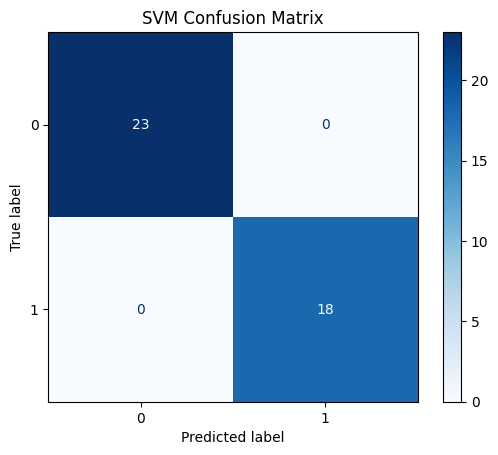

KNN Confusion Matrix:
 [[23  0]
 [ 0 18]]


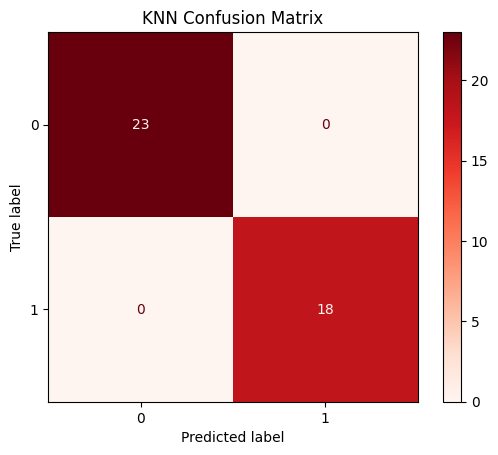

Decision Tree Confusion Matrix:
 [[23  0]
 [ 0 18]]


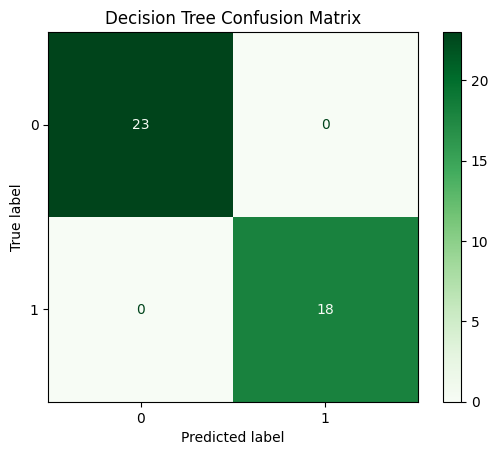

In [7]:
# --- Confusion Matrices ---
# Compute and plot confusion matrix for SVM
cnf_matrix_svm = confusion_matrix(y_test, ypred_svm)
print("SVM Confusion Matrix:\n", cnf_matrix_svm)

disp_svm = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_svm, display_labels=[0, 1])
disp_svm.plot(cmap=plt.cm.Blues)
plt.title('SVM Confusion Matrix')
plt.show()

# Compute and plot confusion matrix for KNN
cnf_matrix_knn = confusion_matrix(y_test, ypred_knn)
print("KNN Confusion Matrix:\n", cnf_matrix_knn)

disp_knn = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_knn, display_labels=[0, 1])
disp_knn.plot(cmap=plt.cm.Reds)
plt.title('KNN Confusion Matrix')
plt.show()

# Compute and plot confusion matrix for Decision Tree
cnf_matrix_dt = confusion_matrix(y_test, ypred_dt)
print("Decision Tree Confusion Matrix:\n", cnf_matrix_dt)

disp_dt = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_dt, display_labels=[0, 1])
disp_dt.plot(cmap=plt.cm.Greens)
plt.title('Decision Tree Confusion Matrix')
plt.show()

In [54]:
# Look at classifier params
classifier = SVC(kernel='rbf',random_state=1,C=1,gamma='auto')
classifier.fit(x_train,y_train)

SVC(C=1, gamma='auto', random_state=1)

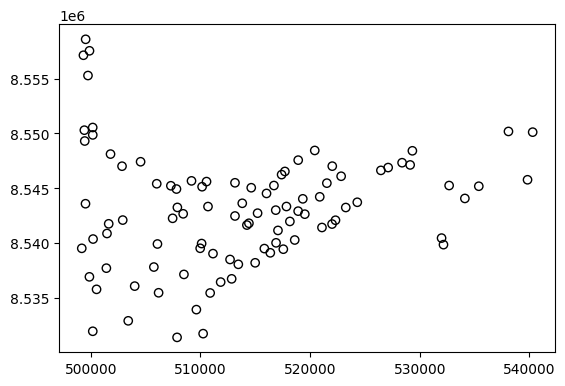

In [12]:
# Just remember to look at data.
tsl_fp = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_only.shp'
tsl_shp = gpd.read_file(tsl_fp)

# Plot the shape
tsl_shp.plot(edgecolor ='black', facecolor = 'None');

In [13]:
# And to explore it.
source = ogr.Open('C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_only.shp')
layer = source.GetLayer()
schema = []
ldefn = layer.GetLayerDefn()
for n in range(ldefn.GetFieldCount()):
    fdefn = ldefn.GetFieldDefn(n)
    schema.append(fdefn.name)
print(schema)

['X', 'Y', 'SAMPLE_1_2', 'SAMPLE_2_2', 'SAMPLE_3_2']


In [2]:
# If it's a CSV.
data = pd.read_csv('C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/merge_W_I_BINNOLOC.csv')
print(data)

        SAMPLE_1_2    SAMPLE_2_2  SAMPLE_3_2  id
0       -26.204203 -2.596121e+01   30.119364   0
1       -24.356628 -2.988782e+01   30.078508   0
2       -27.097809 -2.784318e+01   30.113373   0
3       -25.155590 -2.828107e+01   30.115402   0
4       -25.170872 -2.859386e+01   30.024069   0
..             ...           ...         ...  ..
200  510550.502700  8.545613e+06  -13.522374   1
201  510145.455300  8.545143e+06  -11.678425   1
202  507807.227300  8.544932e+06  -11.342185   1
203  509178.865000  8.545677e+06  -15.110819   1
204  507890.077900  8.543256e+06  -13.570217   1

[205 rows x 4 columns]


In [4]:
# splitting data into training and test set
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,0:3], data.iloc[:, -1], test_size=0.2, random_state=42)

In [109]:
filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20120203_155203_ASC_001.tif'
src = rio.open(filename)
bands = src.read()
img = src.read(1)
profile = src.profile

In [110]:
dimensions = img.shape
height = img.shape[0]
width = img.shape[1]
channels = bands.shape[0]

print('Image Dimension    : ',dimensions)
print('Image Height       : ',height)
print('Image Width        : ',width)
print('Number of Channels : ',channels)

Image Dimension    :  (561, 901)
Image Height       :  561
Image Width        :  901
Number of Channels :  3


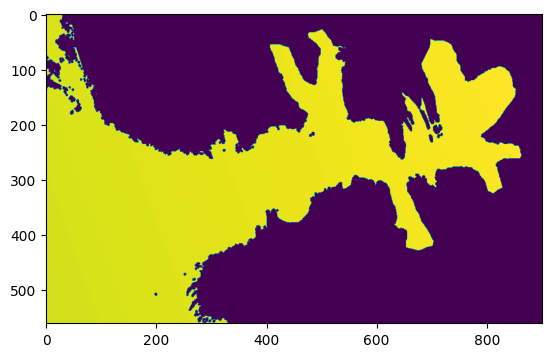

In [111]:
b1 = src.read(1)
b2 = src.read(2)
b3 = src.read(3)
plt.imshow(b1)

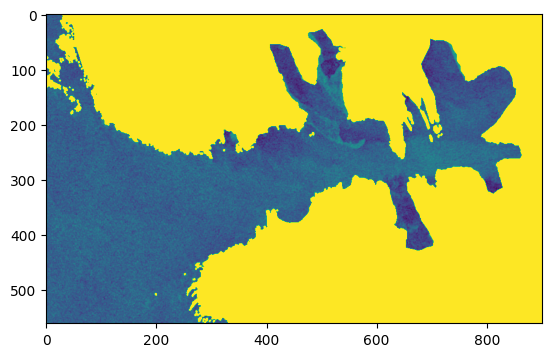

In [7]:
plt.imshow(b2)

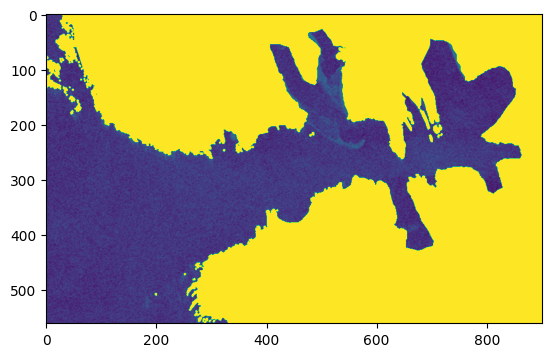

In [8]:
plt.imshow(b3)

In [116]:
bands = np.dstack((b1,b2,b3))  # <-- Why must b1 be alpha? Odd.
bands = bands.reshape(int(np.prod(bands.shape)/3),3)

In [107]:
print(bands)

[[ 35.99509  -15.112477 -27.76305 ]
 [ 35.997776 -14.51249  -25.899967]
 [ 36.000458 -14.601342 -24.910952]
 ...
 [  0.         9.         9.      ]
 [  0.         9.         9.      ]
 [  0.         9.         9.      ]]


In [35]:
# raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20120203_155203_ASC_001.tif"
# with rio.open(raster_path) as src:
#     image = src.read()  # Read all bands
#     profile = src.profile  # Save metadata
#     image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

# # Step 2: Load the shapefile
# shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
# shapefile = gpd.read_file(shapefile_path)

# # Step 3: Extract training data
# # Assuming the shapefile has a 'class' column for labels
# training_data = []
# labels = []

# for _, row in shapefile.iterrows():
#     geom = row.geometry
#     label = row['Class']
#     mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
#     pixels = image[mask]
#     training_data.append(pixels)
#     labels.extend([label] * len(pixels))

# training_data = np.vstack(training_data)
# labels = np.array(labels)

# # Step 4: Train the SVM model
# X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
# svm = SVC(kernel='rbf', C=1, gamma='scale')  <---------------------- Might be depreciated. Not effective.
# svm.fit(X_train, y_train)

In [36]:
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearsvc', LinearSVC(random_state=0, tol=0.001))])

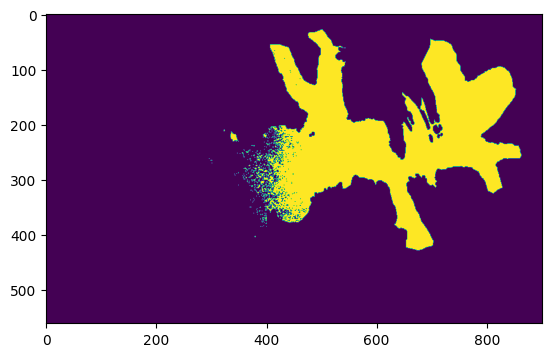

In [40]:
r = clf.predict(bands) #Predict using the model
r = r.reshape(b2.shape)
print(r)
plt.imshow(r)

In [162]:
# filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20120203_155203_ASC_001.tif'
# filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20130304_153107_ASC_158_einc_8d864e69_9433_4fd0_98a4_82ffee83c05f.tif'
# filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20121011_153111_ASC_158_einc_7dde0fbf_4047_4d77_8111_0bf294efd337.tif'
# filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20121018_152700_ASC_258_einc_c590f319_159a_4581_83ec_a701d012b996.tif'
# filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20120402_153110_ASC_158_einc_175c941a_2b8f_4066_a542_ea8e563d90b0.tif'
# filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20120419_153521_ASC_058_einc_a60f13a6_c8f6_4415_8564_8543ff9fcd3c.tif'
filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif'
src = rio.open(filename)
meta = src.profile
bands = src.read()
b1 = src.read(1)
b2 = src.read(2)
b3 = src.read(3)

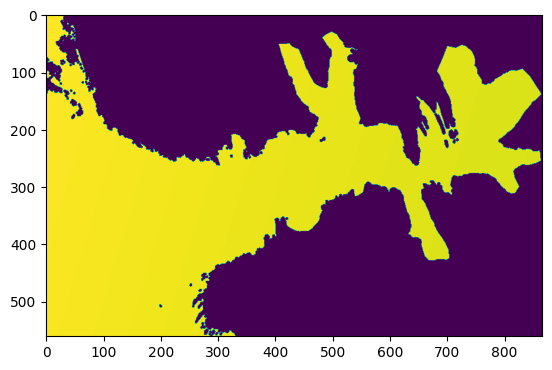

<Axes: >

In [164]:
show(b1)

In [145]:
# Created this line because for some reason, this one decided to composite against the ongoing convention. Why? Good question. Since it was allowed to do it itself.
filename = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCWA_20090215_153813_ASC_301_einc_ff64641b_8041_4d30_a95a_9d175162f3c3.tif' #b3 is theta, rearranging bands
src = rio.open(filename)
meta = src.profile
bands = src.read()
b1 = src.read(3)
b2 = src.read(1)
b3 = src.read(2)


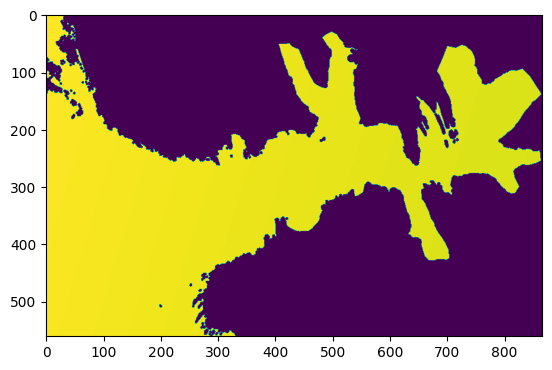

<Axes: >

In [146]:
show(b2)

## Gray level Co-occurence matrices and AI inputs

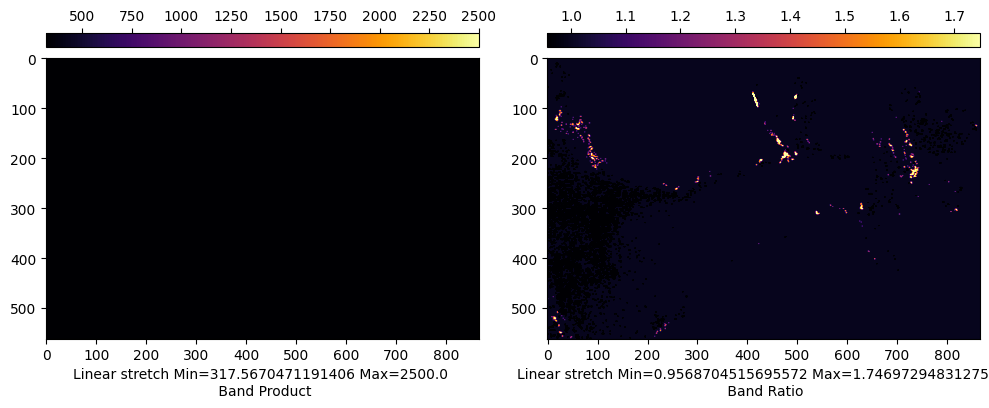

In [191]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

prod = b2*b3
rat = b3/b2

vmin1 = np.nanpercentile(prod, 1)
vmax1 = np.nanpercentile(prod, 99)
vmin2 = np.nanpercentile(rat, 1)
vmax2 = np.nanpercentile(rat, 99)

ika = ax1.imshow(Image.fromarray(prod.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') #fixes NaN problem
ikb = ax2.imshow(Image.fromarray(rat.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(Image.fromarray(prod.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear')
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ika, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(Image.fromarray(rat.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ikb, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n Band Product'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n Band Ratio'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/prod_ratio.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

In [166]:
b1_ = b1.astype('uint8')
b2_ = b2.astype('uint8')
b3_ = b3.astype('uint8')

In [167]:
b1_ent = entropy(b1_, disk (10))
b2_ent = entropy(b2_, disk (10))
b3_ent = entropy(b3_, disk (10))

In [168]:
imgHH = b2_
imgHV = b3_

In [169]:
# HH
rows, cols = 1000,1000
win_rows, win_cols = 5, 5

win_meanHH = ndimage.uniform_filter(imgHH, (win_rows, win_cols))
win_sqr_meanHH = ndimage.uniform_filter(imgHH**2, (win_rows, win_cols))
win_varHH = win_sqr_meanHH - win_meanHH**2
win_sdHH = np.sqrt(win_varHH)

In [170]:
# HV
win_meanHV = ndimage.uniform_filter(imgHV, (win_rows, win_cols))
win_sqr_meanHV = ndimage.uniform_filter(imgHV**2, (win_rows, win_cols))
win_varHV = win_sqr_meanHV - win_meanHV**2
win_sdHV = np.sqrt(win_varHV)

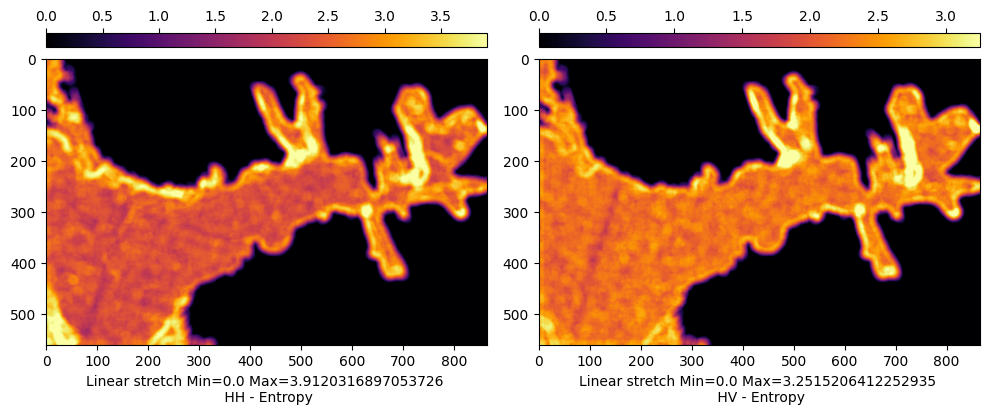

In [171]:
# fig, ax = plt.subplots(figsize=(8,8))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(b2_ent, 1)
vmax1 = np.nanpercentile(b2_ent, 99)
vmin2 = np.nanpercentile(b3_ent, 1)
vmax2 = np.nanpercentile(b3_ent, 99)

ik1 = ax1.imshow(b2_ent, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik2 = ax2.imshow(b3_ent, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(b2_ent, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear')
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik1, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(b3_ent, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik2, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Entropy'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Entropy'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/entropy.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()


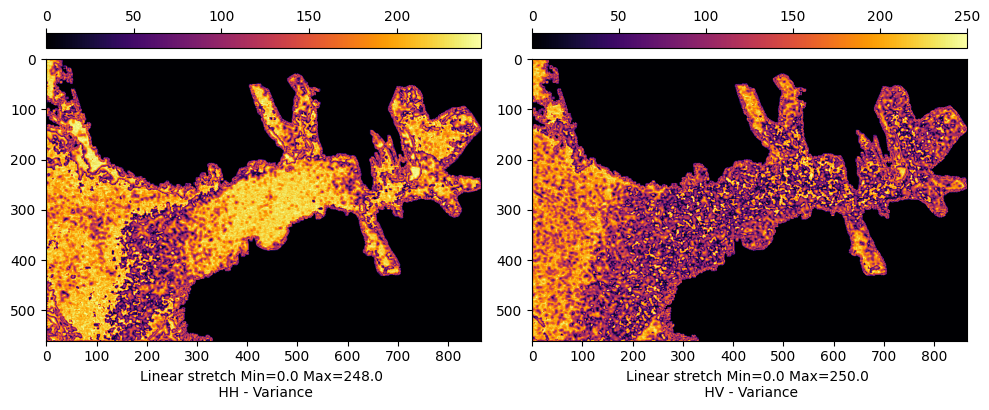

In [172]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(win_varHH, 1)
vmax1 = np.nanpercentile(win_varHH, 99)
vmin2 = np.nanpercentile(win_varHV, 1)
vmax2 = np.nanpercentile(win_varHV, 99)

ik3 = ax1.imshow(Image.fromarray(win_varHH.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik4 = ax2.imshow(Image.fromarray(win_varHV.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(win_varHH, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik3, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(win_varHV, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik4, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Variance'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Variance'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/variance.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

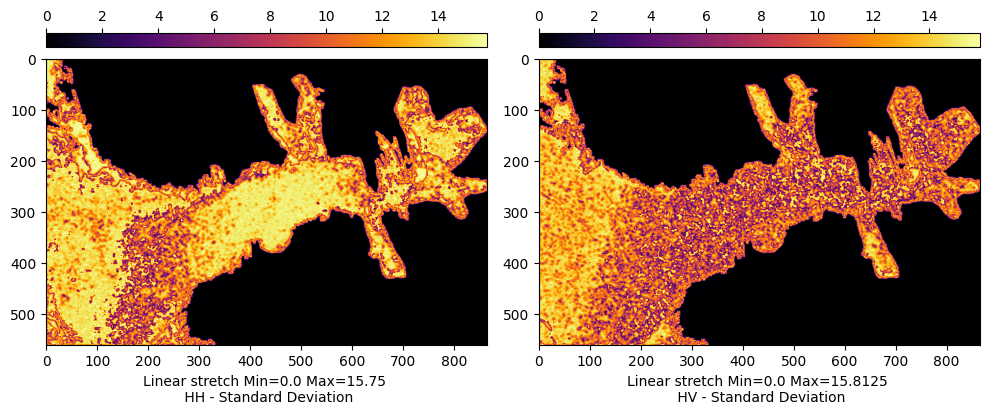

In [173]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(win_sdHH, 1)
vmax1 = np.nanpercentile(win_sdHH, 99)
vmin2 = np.nanpercentile(win_sdHV, 1)
vmax2 = np.nanpercentile(win_sdHV, 99)

ik5 = ax1.imshow(Image.fromarray(win_sdHH.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik6 = ax2.imshow(Image.fromarray(win_sdHV.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(win_sdHH, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik5, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(win_sdHV, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik6, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Standard Deviation'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Standard Deviation'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/sd.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

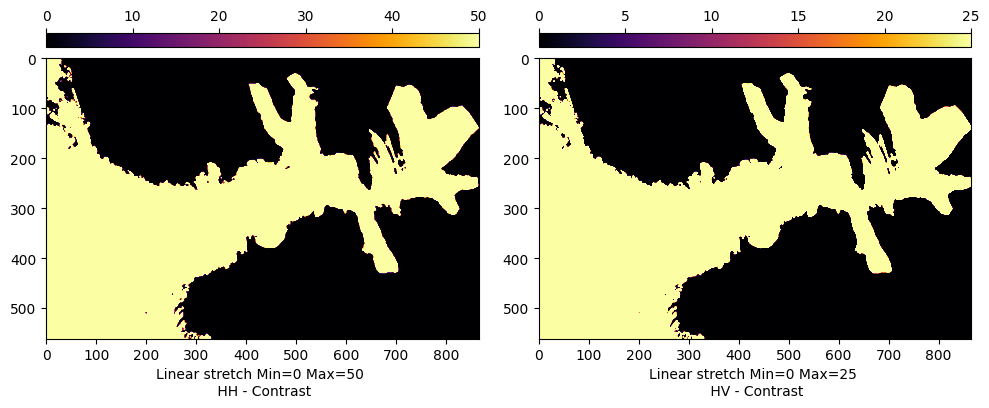

In [174]:
minvalHH = np.percentile(b2, 2)
maxvalHH = np.percentile(b2, 98)
b2_HH = np.clip(b2, minvalHH, maxvalHH)
b2_HH = (((b2 - minvalHH) / (maxvalHH - minvalHH)) **2)*256

minvalHV = np.percentile(b3, 2)
maxvalHV = np.percentile(b3, 98)
b3_HV = np.clip(b3, minvalHV, maxvalHV)
b3_HV = (((b3 - minvalHV) / (maxvalHV  - minvalHV)) **2)*256

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

# vmin1 = np.nanpercentile(b2_HH, 1)
# vmax1 = np.nanpercentile(b2_HH, 99)
# vmin2 = np.nanpercentile(b3_HV, 1)  
# vmax2 = np.nanpercentile(b3_HV, 99)

vmin1 = 0
vmax1 = 50
vmin2 = 0
vmax2 = 25

ik7 = ax1.imshow(Image.fromarray(b2_HH.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear')  
ik8 = ax2.imshow(Image.fromarray(b3_HV.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear') 

ax1.imshow(b2_HH, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik7, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(b3_HV, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik8, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Contrast'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Contrast'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/contrast.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

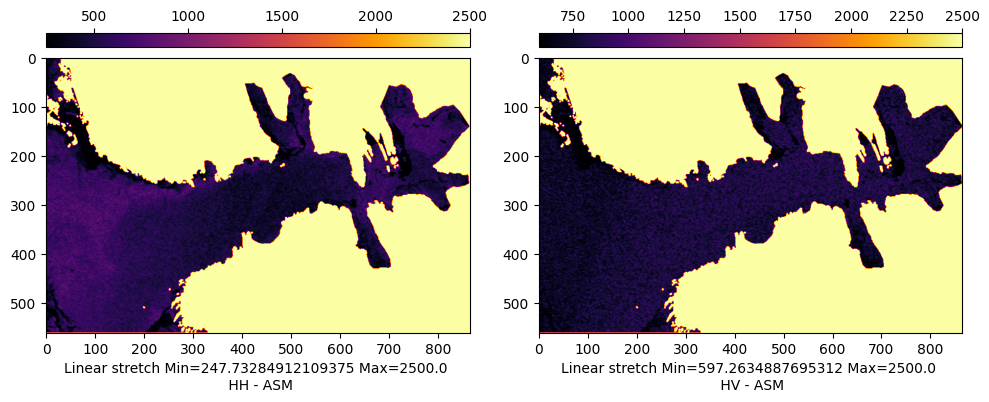

In [175]:
minvalHH = np.percentile(b2, 2)
maxvalHH = np.percentile(b2, 98)
b2_HH = np.clip(b2, minvalHH, maxvalHH)
b2_HHA = b2_HH**2

minvalHV = np.percentile(b3, 2)
maxvalHV = np.percentile(b3, 98)
b3_HV = np.clip(b3, minvalHV, maxvalHV)
b3_HVA = b3_HV**2 

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(b2_HHA, 1)
vmax1 = np.nanpercentile(b2_HHA, 99)
vmin2 = np.nanpercentile(b3_HVA, 1)
vmax2 = np.nanpercentile(b3_HVA, 99)

ik9 = ax1.imshow(Image.fromarray(b2_HHA.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik10 = ax2.imshow(Image.fromarray(b3_HVA.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(b2_HHA, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik9, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(b3_HVA, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik10, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - ASM'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - ASM'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/asm.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

In [122]:
console = Console()
console.print("[bold magenta]Energy is root of ASM, basically the same and would be redundant to include but.. going to add anyway[/bold magenta]", style="bold", justify="center")
console.print(emoji.emojize('\U0001F92A'), style="bold", justify="center")

       Energy is root of ASM, basically the same and would be redundant to include but.. going to add anyway       

                                                        🤪                                                         

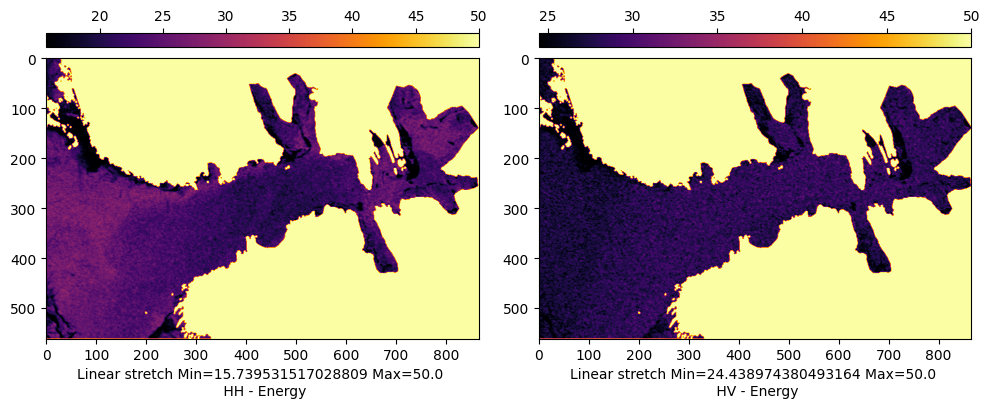

In [176]:
minvalHH = np.percentile(b2, 2)
maxvalHH = np.percentile(b2, 98)
b2_HH = np.clip(b2, minvalHH, maxvalHH)
b2_HHA = b2_HH**2

minvalHV = np.percentile(b3, 2)
maxvalHV = np.percentile(b3, 98)
b3_HV = np.clip(b3, minvalHV, maxvalHV)
b3_HVA = b3_HV**2 

b2_HHE = b2_HHA**0.5
b3_HVE = b3_HVA**0.5

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(b2_HHE, 1)
vmax1 = np.nanpercentile(b2_HHE, 99)
vmin2 = np.nanpercentile(b3_HVE, 1)
vmax2 = np.nanpercentile(b3_HVE, 99)

ik11 = ax1.imshow(Image.fromarray(b2_HHE.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik12 = ax2.imshow(Image.fromarray(b3_HVE.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(b2_HHE, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik11, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(b3_HVE, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik12, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Energy'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Energy'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/energy.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

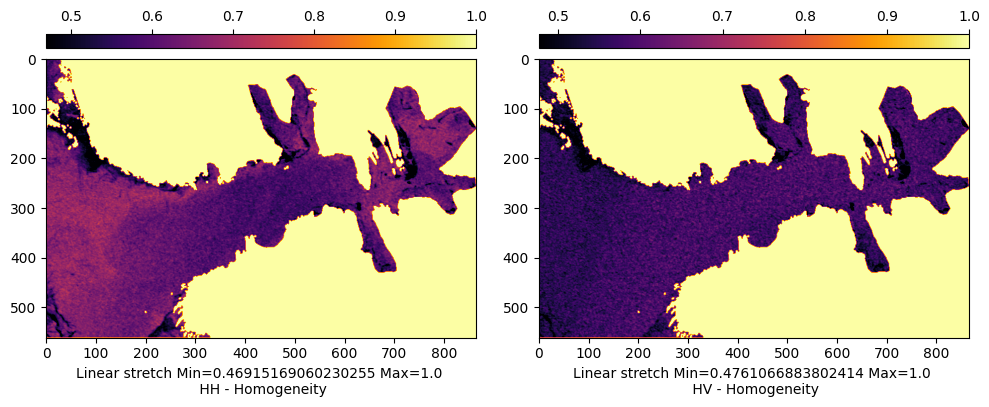

In [177]:
minvalHH = np.percentile(b2, 2)
maxvalHH = np.percentile(b2, 98)
b2_HH = np.clip(b2, minvalHH, maxvalHH)
b2_HH = ((b2 - minvalHH) / (maxvalHH - minvalHH)) *256
b2_HHOM = (1/(1+(abs(((b2 - minvalHH) / (maxvalHH - minvalHH)))**2))) #(1/(1+(b2 - minvalHH) / (maxvalHH - minvalHH)))*255 

minvalHV = np.percentile(b3, 2)
maxvalHV = np.percentile(b3, 98)
b3_HV = np.clip(b3, minvalHV, maxvalHV)
b3_HV = ((b3 - minvalHV) / (maxvalHV  - minvalHV)) *256
b3_VHOM =  (1/(1+(abs(((b3 - minvalHV) / (maxvalHV - minvalHV)))**2))) #(1/(1+(b3 - minvalHV) / (maxvalHV - minvalHV)))*255


fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(b2_HHOM, 1)
vmax1 = np.round(np.nanpercentile(b2_HHOM, 99))
vmin2 = np.nanpercentile(b3_VHOM, 1)
vmax2 = np.round(np.nanpercentile(b3_VHOM, 99))

ik13 = ax1.imshow(Image.fromarray(b2_HHOM.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik14 = ax2.imshow(Image.fromarray(b3_VHOM.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(b2_HHOM, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik13, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(b3_VHOM, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik14, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Homogeneity'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Homogeneity'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/homogen.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()


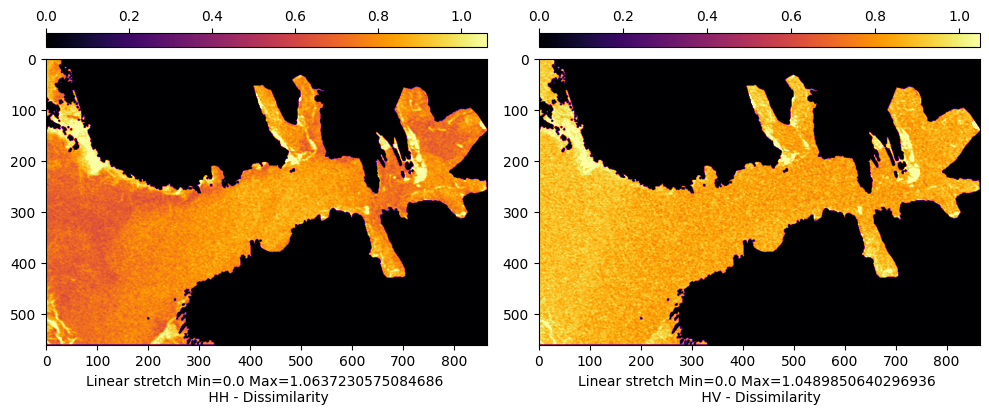

In [178]:
minvalHH = np.percentile(b2, 2)
maxvalHH = np.percentile(b2, 98)
b2_HH = np.clip(b2, minvalHH, maxvalHH)
b2_HHD = abs(((b2 - minvalHH) / (maxvalHH - minvalHH)))

minvalHV = np.percentile(b3, 2)
maxvalHV = np.percentile(b3, 98)
b3_HV = np.clip(b3, minvalHV, maxvalHV)
b3_HVD = abs(((b3 - minvalHV) / (maxvalHV  - minvalHV)))


fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(b2_HHD, 1)
vmax1 = np.nanpercentile(b2_HHD, 99)
vmin2 = np.nanpercentile(b3_HVD, 1)
vmax2 = np.nanpercentile(b3_HVD, 99)

ik14 = ax1.imshow(Image.fromarray(b2_HHD.astype(np.uint8)), cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
ik15 = ax2.imshow(Image.fromarray(b3_HVD.astype(np.uint8)), cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')

ax1.imshow(b2_HHD, cmap='inferno', vmin=vmin1, vmax=vmax1, interpolation = 'bilinear') 
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik14, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(b3_HVD, cmap='inferno', vmin=vmin2, vmax=vmax2, interpolation = 'bilinear')
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik15, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Dissimilarity'.format(vmin1, vmax1))
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Dissimilarity'.format(vmin2, vmax2))
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/dissim.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()


In [126]:
# np.max(corrH), np.min(corrH)

In [127]:
# np.max(corrV), np.min(corrV)

In [128]:
# np.max(pixH), np.min(pixH)

In [129]:
# np.max(pixV), np.min(pixV)

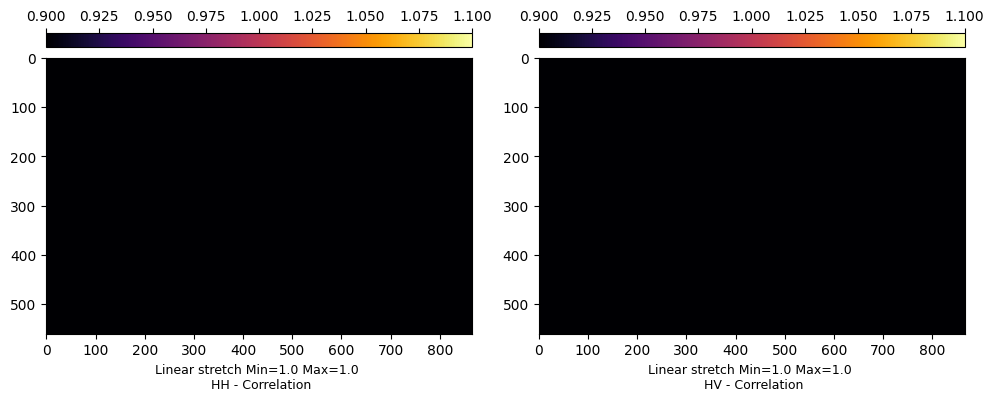

In [179]:
# corrH = ((b2*b3)-(win_meanHH*win_meanHV))/(win_sdHH*win_sdHV)                                                        #Honeycutt & Plotnick(2008) and Kurniati et al. (2023)
# corrH = ((b2-win_meanHH)*(b3-win_meanHV))/((win_sdHH*win_sdHV)**0.5)                                                 #Iqbal et al. (2021)

meanh, stdh = b2.mean(), b2.std()
# global standardization of pixels
pixH = (b2 - meanh) / stdh
# clip pixel values to [-1,1] changed to [0,1]?
pixH = np.clip(pixH, -1.0, 1.0)
# shift from [-1,1] to [0,1]
pixH = (pixH + 1.0) / 2
# pixH = (pixH *256)

meanv, stdv = b3.mean(), b3.std()
pixV = (b3 - meanv) / stdv
pixV = np.clip(pixV, -1.0, 1.0)
pixV = (pixV + 1.0) / 2
# pixV = (pixV *256)

corrH = ((pixH-meanh)*(pixV-meanh))/((stdh*stdv))
corrH = np.clip(corrH, -1.0, 1.0)
corrV = ((pixH-meanv)*(pixV-meanv))/((stdv*stdh))
corrV = np.clip(corrV, -1.0, 1.0)

                                            
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1_divider = make_axes_locatable(ax1)
ax2_divider = make_axes_locatable(ax2)

vmin1 = np.nanpercentile(corrH, 1)
vmax1 = np.nanpercentile(corrH, 99)
vmin2 = np.nanpercentile(corrV, 1)
vmax2 = np.nanpercentile(corrV, 99)


ik16 = ax1.imshow(Image.fromarray(corrH.astype(np.uint8)), cmap='inferno', interpolation = 'bilinear') #vmin=vmin1, vmax=vmax1,
ik17 = ax2.imshow(Image.fromarray(corrV.astype(np.uint8)), cmap='inferno', interpolation = 'bilinear') #vmin=vmin2, vmax=vmax2,

ax1.imshow(corrH, cmap='inferno', interpolation = 'bilinear') #vmin=vmin1, vmax=vmax1,
cax1 = ax1_divider.append_axes("top", size="5%", pad="4%")
cb1 = fig.colorbar(ik16, cax=cax1, orientation='horizontal')
cax1.xaxis.set_ticks_position("top")

ax2.imshow(corrV, cmap='inferno', interpolation = 'bilinear') #vmin=vmin2, vmax=vmax2, 
cax2 = ax2_divider.append_axes("top", size="5%", pad="4%")
cb2 = fig.colorbar(ik17, cax=cax2, orientation='horizontal')
cax2.xaxis.set_ticks_position("top")

ax1.xaxis.set_label_text('Linear stretch Min={} Max={} \n HH - Correlation'.format(vmin1, vmax1),fontsize =9) 
ax1.xaxis.set_label_position('bottom')
ax2.xaxis.set_label_text('Linear stretch Min={} Max={} \n HV - Correlation'.format(vmin2, vmax2),fontsize =9)
ax2.xaxis.set_label_position('bottom')

plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/corr.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

In [201]:
# Apply Sobel filters
sobel_x = sobel(b2_, axis=0)  # Vertical edges
sobel_y = sobel(b2_, axis=1)  # Horizontal edges

# Combine the two directions to get the edge magnitude
sobel_magnitude_ = np.hypot(sobel_x, sobel_y)

# Normalize the result for visualization
sobel_magnitude_ = (sobel_magnitude_ / sobel_magnitude_.max()) * 255
padding = ((0, 0), (0, 35))
sobel_magnitude = np.pad(sobel_magnitude_, padding, mode='constant', constant_values=0)

In [209]:
np.shape(sobel_magnitude_)

(561, 866)

In [188]:
b2ent8 = b2_ent.astype('uint8')
b3ent8 = b3_ent.astype('uint8')

In [192]:
prod = Image.fromarray(prod.astype(np.uint8))
rat = Image.fromarray(rat.astype(np.uint8))
varHH8 = Image.fromarray(win_varHH.astype(np.uint8))
varHV8 = Image.fromarray(win_varHV.astype(np.uint8))
sdHH8 = Image.fromarray(win_sdHH.astype(np.uint8))
sdHV8 = Image.fromarray(win_sdHV.astype(np.uint8))
contHH8 = Image.fromarray(b2_HH.astype(np.uint8))
contHV8 = Image.fromarray(b3_HV.astype(np.uint8))
ASMH8 = Image.fromarray(b2_HHA.astype(np.uint8))
ASMV8 = Image.fromarray(b3_HVA.astype(np.uint8))
enHH8 = Image.fromarray(b2_HHE.astype(np.uint8))
enHV8 = Image.fromarray(b3_HVE.astype(np.uint8))
HHOM8 = Image.fromarray(b2_HHOM.astype(np.uint8))
VHOM8 = Image.fromarray(b3_VHOM.astype(np.uint8))
HHD8 = Image.fromarray(b2_HHD.astype(np.uint8))
VHD8 = Image.fromarray(b3_HVD.astype(np.uint8))
corH8 = Image.fromarray(corrH.astype(np.uint8))
corV8 = Image.fromarray(corrV.astype(np.uint8))

In [210]:
sb = Image.fromarray(sobel_magnitude_.astype(np.uint8))

In [34]:
bandz = np.dstack((b1_,b2_,b3_,prod,rat,b2ent8,b3ent8,varHH8,varHV8,sdHH8,sdHV8,contHH8,contHV8))
origin = np.dstack((b3_,b2_,b1_))
calcbandsH = np.dstack((varHH8,sdHH8,contHH8))
calcbandsV = np.dstack((varHV8,sdHV8,contHV8))

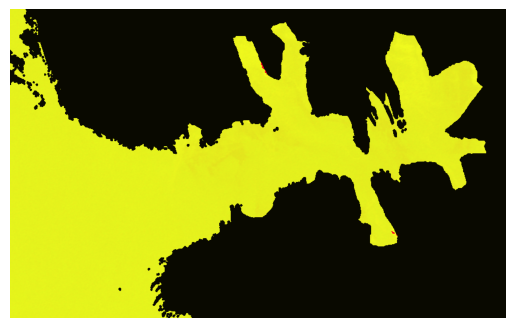

In [26]:
plt.imshow(origin)
plt.axis('off')
plt.show()

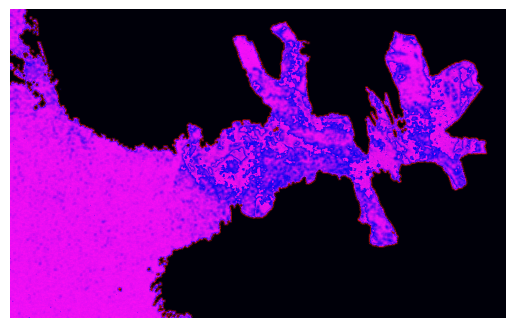

In [27]:
plt.imshow(calcbandsH)
plt.axis('off')
plt.show()

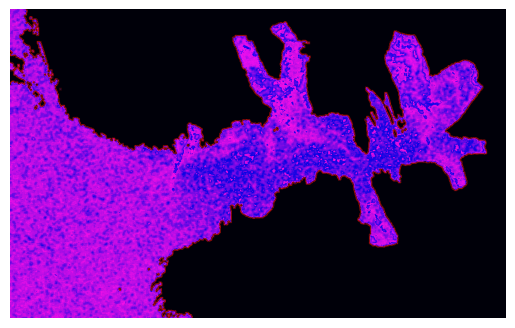

In [28]:
plt.imshow(calcbandsV)
plt.axis('off')
plt.show()

In [34]:
console = Console()
console.print("[bold red]ALL of a sudden, adding the backscatter values does NOT throw an error. Edit outputs to include them, marked 'x'[/bold red]", style="bold", justify="center")
console.print(emoji.emojize('\N{FACE WITH ONE EYEBROW RAISED}'), style="bold", justify="center")

 ALL of a sudden, adding the backscatter values does NOT throw an error. Edit outputs to include them, marked 'x'  

                                                        🤨                                                         

In [165]:
kwargs = src.meta
kwargs.update({
    "dtype":rio.float32,
    "count":23})

In [22]:
fbands = np.dstack((b1_,b2_,b3_,prod,rat,b2ent8,b3ent8,varHH8,varHV8,sdHH8,sdHV8,contHH8,contHV8,ASMH8,ASMV8,enHH8,enHV8,HHOM8,VHOM8,HHD8,VHD8,corH8,corV8))
fbands = fbands.reshape(561, 901, 23)

In [167]:
# with rio.open('C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands23.tif', 'w', **kwargs) as dst:
#     dst.write(fbands.astype(rio.float32))
#     dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10','BNo11', 'BNo12',
# 'BNo13', 'BN14','BNo15', 'BNo16', 'BNo17','BNo18','BNo19','BNo20','BNo21','BNo22','BNo23'])

In [ ]:
KNNbands = np.dstack((b2_,b3_,prod,rat,enHH8,enHV8,HHOM8,VHOM8,corH8,corV8))
KNNbands = KNNbands.reshape(561, 901, 10)

In [ ]:
SVMbands = np.dstack((b2,b3,b2_,b3_,prod,rat,b2ent8,b3ent8,varHH8,varHV8,contHH8,contHV8,ASMH8,ASMV8,sb))
SVMbands = SVMbands.reshape(561, 901, 15)
# SVMbands = np.moveaxis(SVMbands, 0, -1)

In [211]:
SVMbands = np.dstack((b2,b3,b2_,b3_,prod,rat,b2ent8,b3ent8,varHH8,varHV8,contHH8,contHV8,ASMH8,ASMV8,sb))
SVMbands = SVMbands.reshape(561, 866, 15)   #<<<<------ yeah.. anyways...

In [ ]:
RFbands = np.dstack((b2_,b3_,prod,rat,b2ent8,b3ent8,contHH8,contHV8,ASMH8,ASMV8,HHOM8,VHOM8,HHD8,VHD8,corH8,corV8))
RFbands = RFbands.reshape(561, 901, 16)

In [ ]:
ANNbands = np.dstack((b2_,b3_,prod,rat,b2ent8,b3ent8,contHH8,contHV8,enHH8,enHV8,HHOM8,VHOM8,HHD8,VHD8))
ANNbands = ANNbands.reshape(561, 901, 14)

In [212]:
meta.update({
    "dtype":rio.float32,
    "count":15})

In [144]:
# Issued?
# Do it to shove all bands into image
# bands2 = np.moveaxis(SVMbands.squeeze(),0,-1) #-1,0 put it back for regular images
# print(bands2.shape) # check new shape, should be (num. bands, X,Y)
# print(meta)
# with rio.open("C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair_2.tif", "w", **meta) as dst:
#         dst.write(bands2)
#         dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10','BNo11', 'BNo12','BNo13', 'BN14','BNo15'])
# , 'BNo16', 'BNo17','BNo18','BNo19','BNo20','BNo21','BNo22','BNo23'])

(15, 561, 901)
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 0.0, 'width': 901, 'height': 561, 'count': 15, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(50.0, 0.0, 498975.0,
       0.0, -50.0, 8559025.0), 'blockxsize': 901, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


In [213]:
# bands2 = np.moveaxis(SVMbands.squeeze(),0,-1) #-1,0 put it back for regular images
# print(bands2.shape) # check new shape, should be (num. bands, X,Y)
# print(meta)
# with rio.open("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_2test.tif", "w", **meta) as dst:
#         dst.write(bands2)
#         dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10','BNo11', 'BNo12','BNo13', 'BN14','BNo15'])

(15, 561, 866)
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 0.0, 'width': 866, 'height': 561, 'count': 15, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(50.0, 0.0, 498975.0,
       0.0, -50.0, 8559025.0), 'blockxsize': 866, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


In [ ]:
# # Retrieve dataset information in JSON format
# info_json = gdal.Info(bands2, format='json')

# # Print the JSON information
# print(info_json)

## Image Classification blocks

### Support Vector Machine (3 bands)

              precision    recall  f1-score   support

           0       0.78      0.62      0.69        29
           1       0.72      0.85      0.78        33

    accuracy                           0.74        62
   macro avg       0.75      0.73      0.74        62
weighted avg       0.75      0.74      0.74        62



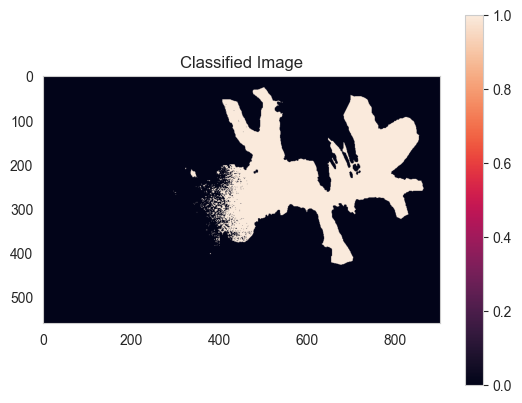

In [21]:
# Step 1: Load the raster image
# C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands.tif

raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/RS2_SCNA_20120203_155203_ASC_001.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)
    
    bands = np.dstack((b1,b2,b3))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/3),3)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands) #Predict using the model
class_image = predicted.reshape(b1.shape)

y_pred = clf.predict(X_test)

# Generate classification report
report = classification_report(y_test, y_pred)
print(report)

# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(class_image, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/class3b_image.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

### Support Vector Machine (13 bands)

In [ ]:
# C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands.tif

raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands23.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/13),13)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands) #Predict using the model
class_image = predicted.reshape(b1.shape)

y_pred = clf.predict(X_test)

# Generate classification report
report = classification_report(y_test, y_pred)
print(report)

# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(class_image, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")


# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/SVM13.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

In [ ]:
# Compute confusion matrix using test data
cnf_matrix_sklearn = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cnf_matrix_sklearn)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_sklearn, display_labels=[0, 1])
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# creating confusion matrix and accuracy calculation
cm = confusion_matrix(y_test,y_pred)
print(cm)
accuracy = float(cm.diagonal().sum())/len(y_test)
print('model accuracy is:',accuracy*100,'%')

### Random Forest (13 bands)

In [13]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands2.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/13),13)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_classifier.fit(X_train, Y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.81


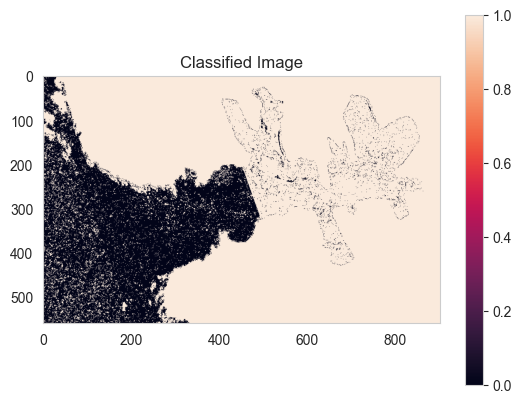

In [19]:
RF_pred = rf_classifier.predict(bands) #Predict using the model
climage = RF_pred.reshape(b1.shape)

plt.imshow(climage)
plt.colorbar()
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/climage.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

### KNN (13 bands)

In [2]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands2.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/13),13)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=2)

# Train the model
knn.fit(X_train, Y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.56


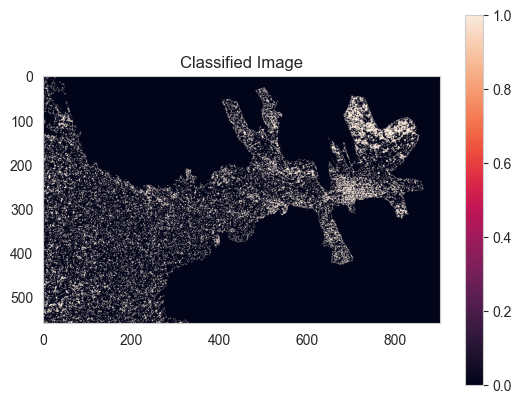

In [4]:
KNN_pred = knn.predict(bands) #Predict using the model
cimage = KNN_pred.reshape(b1.shape)

plt.imshow(cimage)
plt.colorbar()
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/cimage.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

### Support Vector Machine (12 bands)

In [38]:
# SVMbands = np.dstack((b2_,b3_,prod,rat,b2ent8,b3ent8,varHH8,varHV8,contHH8,contHV8,ASMH8,ASMV8)) #<- without theta? b1_
# SVMbands = SVMbands.reshape(561, 901, 12)

In [39]:
# meta.update({
#     "dtype":rio.float32,
#     "count":12})

In [40]:
# Issued?
# Do it to shove all bands into image
# bands2 = np.moveaxis(SVMbands.squeeze(),-1,0)
# print(bands2.shape) # check new shape, should be (num. bands, X,Y)
# print(meta)
# with rio.open("C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVM.tif", "w", **meta) as dst:
#         dst.write(bands2)
#         dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10','BNo11', 'BNo12'])

(12, 561, 901)
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 0.0, 'width': 901, 'height': 561, 'count': 12, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(50.0, 0.0, 498975.0,
       0.0, -50.0, 8559025.0), 'blockxsize': 901, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


Accuracy: 0.66
              precision    recall  f1-score   support

           0       0.63      0.66      0.64        29
           1       0.69      0.67      0.68        33

    accuracy                           0.66        62
   macro avg       0.66      0.66      0.66        62
weighted avg       0.66      0.66      0.66        62



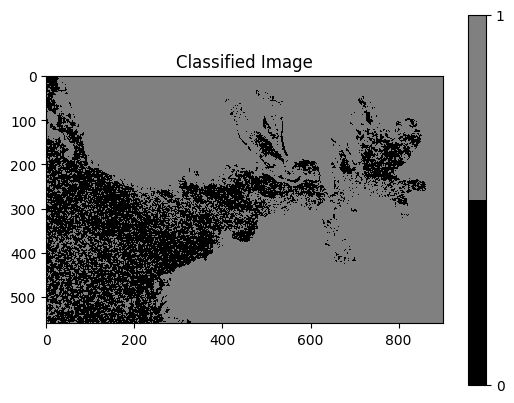

In [8]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVM.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/12),12)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands) #Predict using the model
class_image = predicted.reshape(b1.shape)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate classification report
report = classification_report(y_test, y_pred)
print(report)

# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(class_image, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")


# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/SVM12.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

### Random Forest (16 bands)

In [59]:
# RFbands = np.dstack((b2_,b3_,prod,rat,b2ent8,b3ent8,contHH8,contHV8,ASMH8,ASMV8,HHOM8,VHOM8,HHD8,VHD8,corH8,corV8)) #<- without theta? b1_
# RFbands = RFbands.reshape(561, 901, 16)

In [60]:
# meta.update({
#     "dtype":rio.float32,
#     "count":16})

In [61]:
# Do it to shove all bands into image
# bands2 = np.moveaxis(RFbands.squeeze(),-1,0)
# print(bands2.shape) # check new shape, should be (num. bands, X,Y)
# print(meta)
# with rio.open("C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsRF.tif", "w", **meta) as dst:
#         dst.write(bands2)
#         dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10','BNo11', 'BNo12','BNo13','BNo14','BNo15','BNo16'])

(16, 561, 901)
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 0.0, 'width': 901, 'height': 561, 'count': 16, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(50.0, 0.0, 498975.0,
       0.0, -50.0, 8559025.0), 'blockxsize': 901, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


Accuracy: 0.65


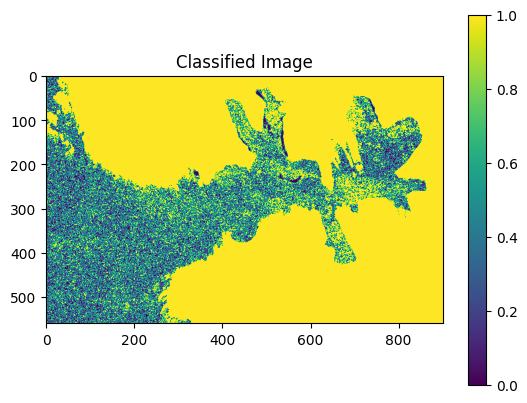

In [3]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsRF.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)
    b15 = src.read(15)
    b16 = src.read(16)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14,b15,b16)) 
    bands = bands.reshape(int(np.prod(bands.shape)/16),16)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_classifier.fit(X_train, Y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

RF_pred = rf_classifier.predict(bands) #Predict using the model
climage = RF_pred.reshape(b1.shape)

cmap = ListedColormap(['black', 'gray'])
plt.imshow(climage, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/RF16.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

### KNN (10 bands)

In [56]:
# KNNbands = np.dstack((b2_,b3_,prod,rat,enHH8,enHV8,HHOM8,VHOM8,corH8,corV8)) #<- without theta? b1_
# KNNbands = KNNbands.reshape(561, 901, 10)

In [57]:
# meta.update({
#     "dtype":rio.float32,
#     "count":10})

In [58]:
# Do it to shove all bands into image
# bands2 = np.moveaxis(KNNbands.squeeze(),-1,0)
# print(bands2.shape) # check new shape, should be (num. bands, X,Y)
# print(meta)
# with rio.open("C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsKNN.tif", "w", **meta) as dst:
#         dst.write(bands2)
#         dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10'])

(10, 561, 901)
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 0.0, 'width': 901, 'height': 561, 'count': 10, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(50.0, 0.0, 498975.0,
       0.0, -50.0, 8559025.0), 'blockxsize': 901, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


In [ ]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsKNN.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/10),10)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=2)

# Train the model
knn.fit(X_train, Y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

KNN_pred = knn.predict(bands) #Predict using the model
cimage = KNN_pred.reshape(b1.shape)

cmap = ListedColormap(['black', 'gray'])
plt.imshow(cimage, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/KNN10.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

Accuracy: 0.61


#### Testing

C:\Users\jullian.williams\AppData\Local\Temp\ipykernel_1256\984393560.py:161: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 800x800 with 2 Axes> which fig.colorbar is called on.
  cbar = fig2.colorbar(image1, ax=axes2, extend='both')


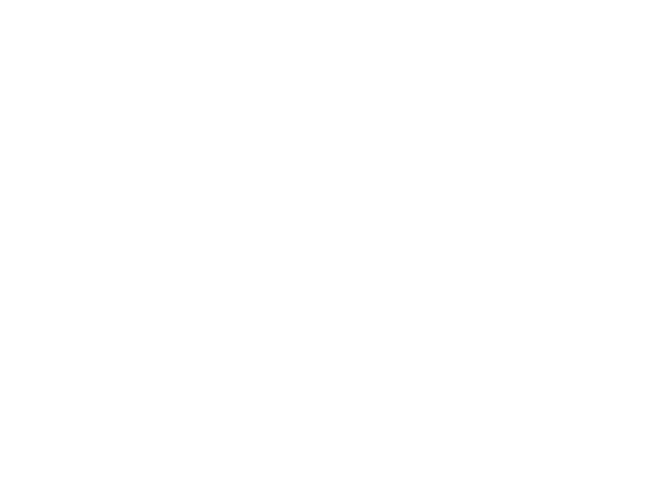

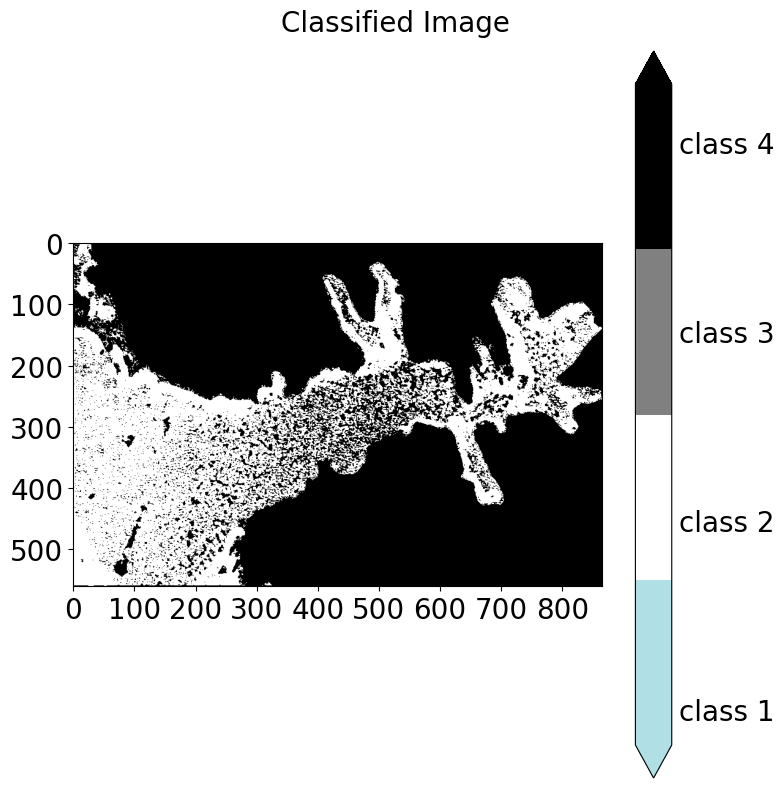

In [26]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130628_154748_ASC_101_einc_9f05602b_4f4d_408d_bd24_4a090af4f0d0.tif"
raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif"
with rio.open(raster_path_) as src_:
    # image_, transformed = rio.mask.mask(src_, shapes, crop=True, filled=True)
    # image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    b1_ = np.where(np.isinf(b1_), np.nan, b1_)
    b2_ = np.where(np.isinf(b2_), np.nan, b2_)          
    b3_ = np.where(np.isinf(b3_), np.nan, b3_)
    b4_ = np.where(np.isinf(b4_), np.nan, b4_)
    b5_ = np.where(np.isinf(b5_), np.nan, b5_)
    b6_ = np.where(np.isinf(b6_), np.nan, b6_)
    b7_ = np.where(np.isinf(b7_), np.nan, b7_)
    b8_ = np.where(np.isinf(b8_), np.nan, b8_)
    b9_ = np.where(np.isinf(b9_), np.nan, b9_)
    b10_ = np.where(np.isinf(b10_), np.nan, b10_)
    b11_ = np.where(np.isinf(b11_), np.nan, b11_)
    b12_ = np.where(np.isinf(b12_), np.nan, b12_)
    b13_ = np.where(np.isinf(b13_), np.nan, b13_)
    b14_ = np.where(np.isinf(b14_), np.nan, b14_)
                
    nan1 = 9
    nan2 = 81
    
    b1_ = np.nan_to_num(b1_, nan=nan1)
    b2_ = np.nan_to_num(b2_, nan=nan1)
    b3_ = np.nan_to_num(b3_, nan=nan1)
    b4_ = np.nan_to_num(b4_, nan=nan1)
    b5_ = np.nan_to_num(b5_, nan=nan2)
    b6_ = np.nan_to_num(b6_, nan=nan2)
    b7_ = np.nan_to_num(b7_, nan=nan1)
    b8_ = np.nan_to_num(b8_, nan=nan1)
    b9_ = np.nan_to_num(b9_, nan=nan1)
    b10_ = np.nan_to_num(b10_, nan=nan1)
    b11_ = np.nan_to_num(b11_, nan=nan1)
    b12_ = np.nan_to_num(b12_, nan=nan1)
    b13_ = np.nan_to_num(b13_, nan=nan2)
    b14_ = np.nan_to_num(b14_, nan=nan2)


    mask1 = (b1_ ==9) & (b1_== 81)
    mask2 = (b2_ ==9) & (b2_== 81)
    mask3 = (b3_ ==9) & (b3_== 81)
    mask4 = (b4_ ==9) & (b4_== 81)
    mask5 = (b5_ ==9) & (b5_== 81)
    mask6 = (b6_ ==9) & (b6_== 81)
    mask7 = (b7_ ==9) & (b7_== 81)
    mask8 = (b8_ ==9) & (b8_== 81)
    mask9 = (b9_ ==9) & (b9_== 81)
    mask10 = (b10_ ==9) & (b10_== 81)
    mask11 = (b11_ ==9) & (b11_== 81)
    mask12 = (b12_ ==9) & (b12_== 81)
    mask13 = (b13_ ==9) & (b13_== 81)
    mask14 = (b14_ ==9) & (b14_== 81)
    
    b1_ = np.ma.masked_array(b1_, mask1)
    b2_ = np.ma.masked_array(b2_, mask2)
    b3_ = np.ma.masked_array(b3_, mask3)
    b4_ = np.ma.masked_array(b4_, mask4)
    b5_ = np.ma.masked_array(b5_, mask5)
    b6_ = np.ma.masked_array(b6_, mask6)
    b7_ = np.ma.masked_array(b7_, mask7)
    b8_ = np.ma.masked_array(b8_, mask8)
    b9_ = np.ma.masked_array(b9_, mask9)
    b10_ = np.ma.masked_array(b10_, mask10)
    b11_ = np.ma.masked_array(b11_, mask11)
    b12_ = np.ma.masked_array(b12_, mask12)
    b13_ = np.ma.masked_array(b13_, mask13)
    b14_ = np.ma.masked_array(b14_, mask14)

    # image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)


# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands_) #Predict using the model
class_image = predicted.reshape(b1_.shape)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")

# Generate classification report
report = classification_report(y_test, y_pred)
# print(report)

cmap_ = ListedColormap(['white','powderblue','gray','black'])
cmap_1 = ListedColormap(['powderblue','white','gray','black'])
fig1, axes1 = plt.subplots()
fig2, axes2 = plt.subplots(figsize=(8,8))
image1 = axes1.imshow(class_image, cmap=cmap_1)
fig1.gca().set_visible(False)
image2 = axes2.imshow(class_image,cmap=cmap_)
cbar = fig2.colorbar(image1, ax=axes2, extend='both')
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(['class 1','class 2','class 3','class 4']):
    cbar.ax.text(1.2, (4 * j + 1) / 14.0, lab, ha='left', va='top',fontsize=20)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
fig2.suptitle("Classified Image",fontsize=20)
fig2.subplots_adjust(top=1.0)
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/amend_classification_SVM/img.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.tight_layout()
plt.show()

#### Test amend - SCWA

C:\Users\jullian.williams\AppData\Local\Temp\ipykernel_15584\1512861360.py:166: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1500x1000 with 2 Axes> which fig.colorbar is called on.
  cbar = fig2.colorbar(image1, ax=axes2, extend='both')


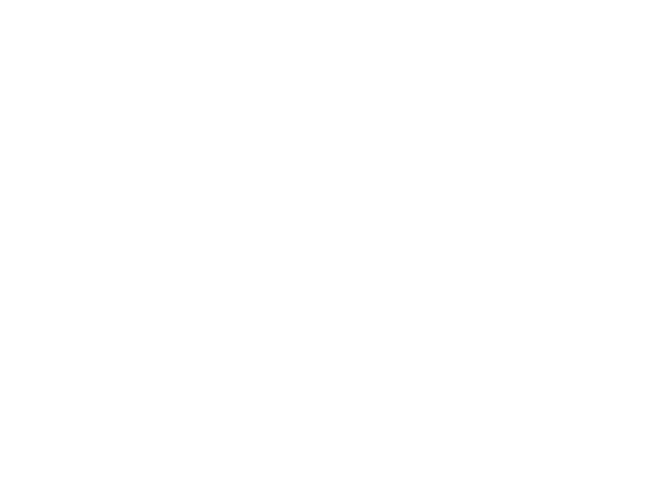

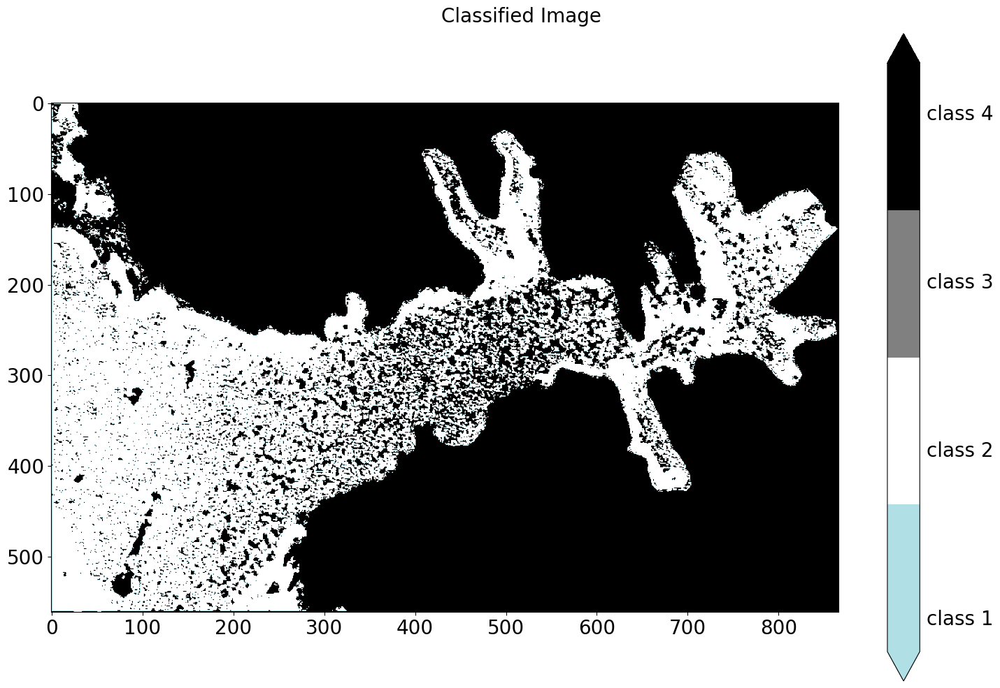

In [128]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130628_154748_ASC_101_einc_9f05602b_4f4d_408d_bd24_4a090af4f0d0.tif"
raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif"
with rio.open(raster_path_) as src_:
    image_, transformed = rio.mask.mask(src_, shapes, crop=True, filled=True)
    # image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    b1_ = np.where(np.isinf(b1_), np.nan, b1_)
    b2_ = np.where(np.isinf(b2_), np.nan, b2_)          
    b3_ = np.where(np.isinf(b3_), np.nan, b3_)
    b4_ = np.where(np.isinf(b4_), np.nan, b4_)
    b5_ = np.where(np.isinf(b5_), np.nan, b5_)
    b6_ = np.where(np.isinf(b6_), np.nan, b6_)
    b7_ = np.where(np.isinf(b7_), np.nan, b7_)
    b8_ = np.where(np.isinf(b8_), np.nan, b8_)
    b9_ = np.where(np.isinf(b9_), np.nan, b9_)
    b10_ = np.where(np.isinf(b10_), np.nan, b10_)
    b11_ = np.where(np.isinf(b11_), np.nan, b11_)
    b12_ = np.where(np.isinf(b12_), np.nan, b12_)
    b13_ = np.where(np.isinf(b13_), np.nan, b13_)
    b14_ = np.where(np.isinf(b14_), np.nan, b14_)
                
    nan1 = -50
    nan2 = 206
    nan3 = 196
    
    b1_ = np.nan_to_num(b1_, nan=nan1)
    b2_ = np.nan_to_num(b2_, nan=nan1)
    b3_ = np.nan_to_num(b3_, nan=nan2)
    b4_ = np.nan_to_num(b4_, nan=nan2)
    b5_ = np.nan_to_num(b5_, nan=nan3)
    b6_ = np.nan_to_num(b6_, nan=nan1)
    b7_ = np.nan_to_num(b7_, nan=nan1)
    b8_ = np.nan_to_num(b8_, nan=nan1)
    b9_ = np.nan_to_num(b9_, nan=nan1)
    b10_ = np.nan_to_num(b10_, nan=nan1)
    b11_ = np.nan_to_num(b11_, nan=nan2)
    b12_ = np.nan_to_num(b12_, nan=nan2)
    b13_ = np.nan_to_num(b13_, nan=nan3)
    b14_ = np.nan_to_num(b14_, nan=nan3)


    mask1 = (b1_ ==-50)
    mask2 = (b2_ ==-50)
    mask3 = (b3_ ==206)
    mask4 = (b4_ ==206)
    mask5 = (b5_ ==196)
    mask6 = (b6_ ==196)
    mask7 = (b7_ ==196)
    mask8 = (b8_ ==196)
    mask9 = (b9_ ==196)
    mask10 = (b10_ ==196)
    mask11 = (b11_ ==206)
    mask12 = (b12_ ==206)
    mask13 = (b13_ ==196)
    mask14 = (b14_ ==196)
    
    b1_ = np.ma.masked_array(b1_, mask1)
    b2_ = np.ma.masked_array(b2_, mask2)
    b3_ = np.ma.masked_array(b3_, mask3)
    b4_ = np.ma.masked_array(b4_, mask4)
    b5_ = np.ma.masked_array(b5_, mask5)
    b6_ = np.ma.masked_array(b6_, mask6)
    b7_ = np.ma.masked_array(b7_, mask7)
    b8_ = np.ma.masked_array(b8_, mask8)
    b9_ = np.ma.masked_array(b9_, mask9)
    b10_ = np.ma.masked_array(b10_, mask10)
    b11_ = np.ma.masked_array(b11_, mask11)
    b12_ = np.ma.masked_array(b12_, mask12)
    b13_ = np.ma.masked_array(b13_, mask13)
    b14_ = np.ma.masked_array(b14_, mask14)

    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)


# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands_) #Predict using the model
class_image = predicted.reshape(b1_.shape)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")

# Generate classification report
report = classification_report(y_test, y_pred)
# print(report)

cmap_ = ListedColormap(['white','powderblue','gray','black'])
cmap_1 = ListedColormap(['powderblue','white','gray','black'])
fig1, axes1 = plt.subplots()
fig2, axes2 = plt.subplots(figsize=(15, 10))
image1 = axes1.imshow(class_image, cmap=cmap_1)
fig1.gca().set_visible(False)
image2 = axes2.imshow(class_image,cmap=cmap_)
cbar = fig2.colorbar(image1, ax=axes2, extend='both')
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(['class 1','class 2','class 3','class 4']):
    cbar.ax.text(1.2, (4 * j + 1) / 14.0, lab, ha='left', va='top',fontsize=20)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
fig2.suptitle("Classified Image",fontsize=20)
fig2.subplots_adjust(top=1.0)
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/amend_classification_SVM/img.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.tight_layout()
plt.show()

Accuracy: 0.64
              precision    recall  f1-score   support

           0       0.71      0.45      0.55      4988
           1       0.61      0.82      0.70      5106

    accuracy                           0.64     10094
   macro avg       0.66      0.64      0.63     10094
weighted avg       0.66      0.64      0.63     10094



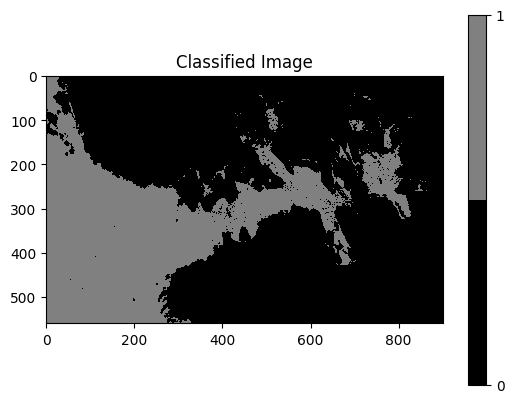

In [28]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)


    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain2x.tif"
with rio.open(raster_path_) as src_:
    image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands_) #Predict using the model
class_image = predicted.reshape(b1_.shape)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate classification report
report = classification_report(y_test, y_pred)
print(report)

# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(class_image, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")


# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/SVM12.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

Accuracy: 0.57


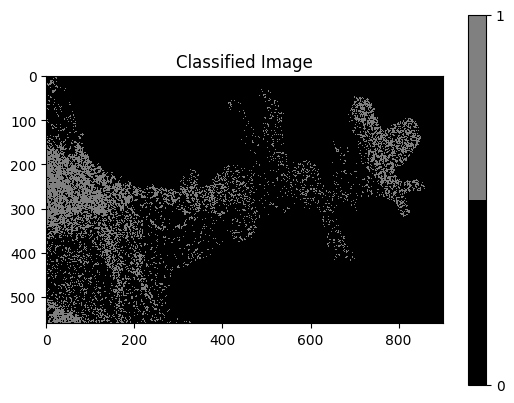

In [13]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain4x.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)


    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20120326_153521_ASC_058_einc_2e39de35_3be6_44c2_a3e1_35cd88a395bc.tif"
with rio.open(raster_path_) as src_:
    image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)



X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=2)

# Train the model
knn.fit(X_train, Y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

KNN_pred = knn.predict(bands_) #Predict using the model
cimage = KNN_pred.reshape(b1_.shape)


# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(cimage, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")


# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/SVM12.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

Accuracy: 0.57


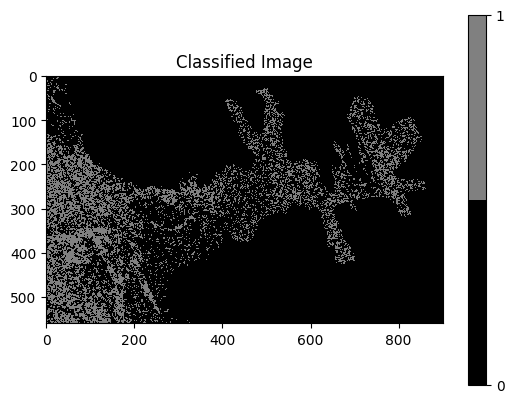

In [14]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain5x.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)


    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20120326_153521_ASC_058_einc_2e39de35_3be6_44c2_a3e1_35cd88a395bc.tif"
with rio.open(raster_path_) as src_:
    image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)



X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=2)

# Train the model
knn.fit(X_train, Y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

KNN_pred = knn.predict(bands_) #Predict using the model
cimage = KNN_pred.reshape(b1_.shape)


# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(cimage, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")


# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/SVM12.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

Accuracy: 0.59


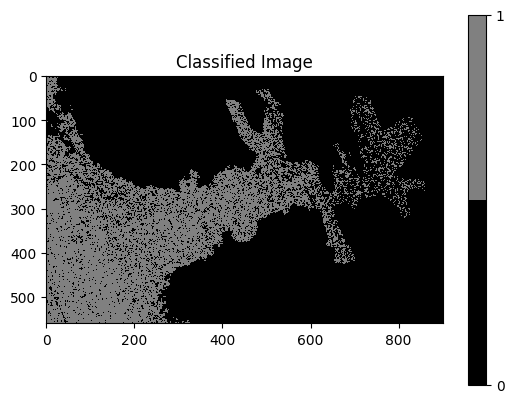

In [20]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain6x.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)


    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20120214_153109_ASC_158_einc_c41ecd92_523e_4d52_8da7_5e8bef644914.tif"
with rio.open(raster_path_) as src_:
    image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)



X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Initialize KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=2)

# Train the model
knn.fit(X_train, Y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

KNN_pred = knn.predict(bands_) #Predict using the model
cimage = KNN_pred.reshape(b1_.shape)


# Step 7: Save and visualize the classified image
cmap = ListedColormap(['black', 'gray'])
plt.imshow(cimage, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")


# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/SVM12.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

## In tensor environment

### ANN (13 bands)

----------------------------------------------------------------------------------------

In [2]:
import tensorflow
from tensorflow.keras import Sequential
from tensorflow.keras import callbacks
from tensorflow.keras.layers import Dense

from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error as mae

In [3]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bands2.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/13),13)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/HS_ice_water.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Feature Scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [4]:
model = Sequential()

#Adding the input layer and the first hidden layer
model.add(Dense(units = 100,
                kernel_initializer = 'uniform',
                activation = 'relu',
                input_dim = 13))

#adding the second hidden layer
model.add(Dense(units = 150,
                kernel_initializer = 'uniform',
                activation = 'relu'
                ))

#addinf the third hidden layer
model.add(Dense(units=200,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#adding the output layer
model.add(Dense(units=1,
                kernel_initializer = 'uniform',
                activation = 'sigmoid'))

In [5]:
model.compile(optimizer = 'adam',loss='binary_crossentropy',metrics = ['accuracy'])

In [6]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               1400      
                                                                 
 dense_1 (Dense)             (None, 150)               15150     
                                                                 
 dense_2 (Dense)             (None, 200)               30200     
                                                                 
 dense_3 (Dense)             (None, 1)                 201       
                                                                 
Total params: 46,951
Trainable params: 46,951
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Fitting the ANN to the training Set
EPOCHS = 100
Batch_size = 64

# train model
H= model.fit(X_train,
             Y_train,
             batch_size = Batch_size,
             epochs = EPOCHS,
             validation_split = 0.4,
             verbose=1)

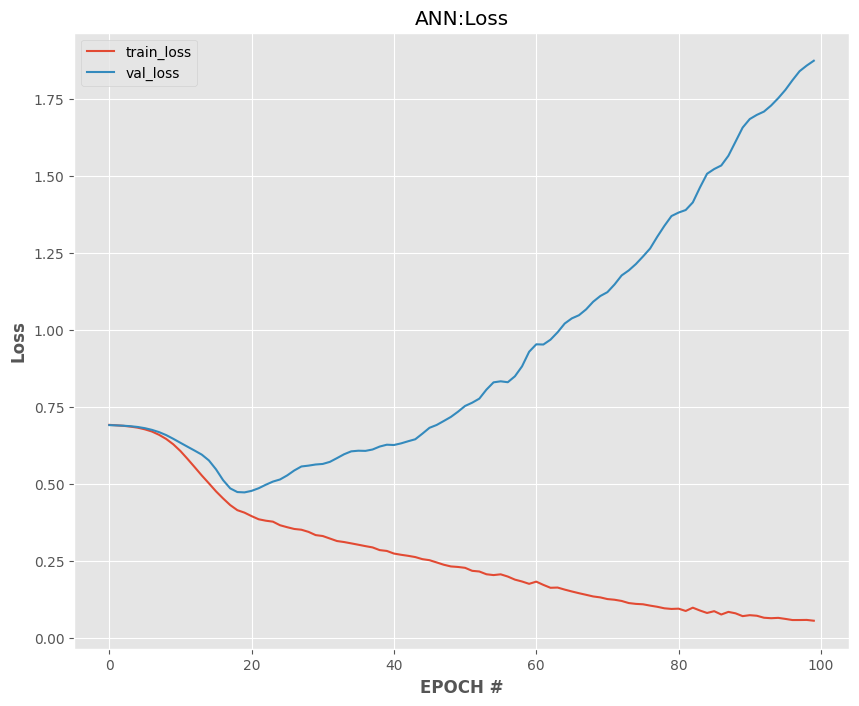

In [8]:
#plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize=[10,8])
plt.plot(N, H.history['loss'],label ='train_loss')
plt.plot(N, H.history['val_loss'],label= 'val_loss')
plt.title("ANN:Loss")
plt.xlabel("EPOCH #",weight='bold')
plt.ylabel("Loss", weight = 'bold')
plt.legend()
plt.show()

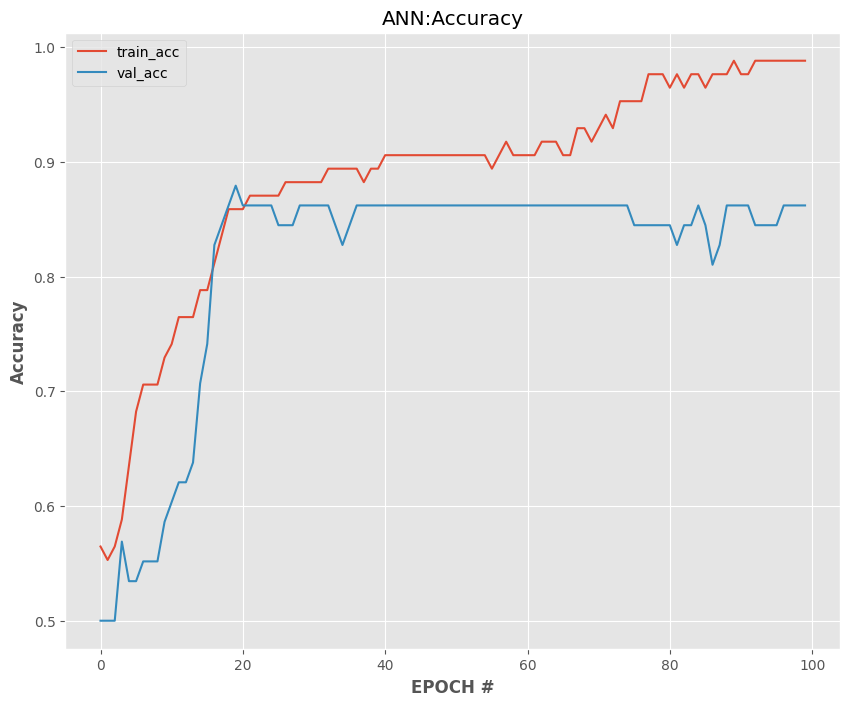

In [9]:
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize=[10,8])
plt.plot(N, H.history['accuracy'],label ='train_acc')
plt.plot(N, H.history['val_accuracy'],label= 'val_acc')
plt.title("ANN:Accuracy")
plt.xlabel("EPOCH #",weight='bold')
plt.ylabel("Accuracy", weight = 'bold')
plt.legend()
plt.show()

In [10]:
y_pred= model.predict(X_test)
y_pred =(y_pred >0.5)

print('*'*20)
score,acc =model.evaluate(X_test, Y_test,batch_size=10)

print("Test Score :",score)
print("Test accuracy :",acc)

2/2 [==============================] - 0s 0s/step
********************
7/7 [==============================] - 0s 3ms/step - loss: 2.0975 - accuracy: 0.7742
Test Score : 2.097461223602295
Test accuracy : 0.774193525314331


In [11]:
cfm=confusion_matrix(Y_test,y_pred)
print(cfm)

print("Classification report: ")

print(classification_report(Y_test,y_pred))

acc=accuracy_score(Y_test, y_pred)
print("Accuracy of the model: ",acc)

[[19 10]
 [ 4 29]]
Classification report: 
              precision    recall  f1-score   support

           0       0.83      0.66      0.73        29
           1       0.74      0.88      0.81        33

    accuracy                           0.77        62
   macro avg       0.78      0.77      0.77        62
weighted avg       0.78      0.77      0.77        62

Accuracy of the model:  0.7741935483870968


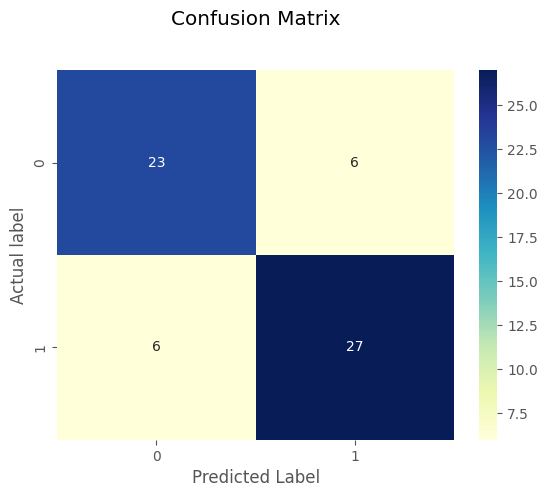

In [55]:
p = sns.heatmap (pd.DataFrame(cfm), annot= True, cmap ="YlGnBu", fmt='g')
plt.title("Confusion Matrix", y=1.1)
plt.ylabel("Actual label")
plt.xlabel("Predicted Label")
plt.show(p)

In [12]:
ANN_pred = model.predict(bands) #Predict using the model
clsimage = ANN_pred.reshape(b1.shape)

15796/15796 [==============================] - 12s 734us/step


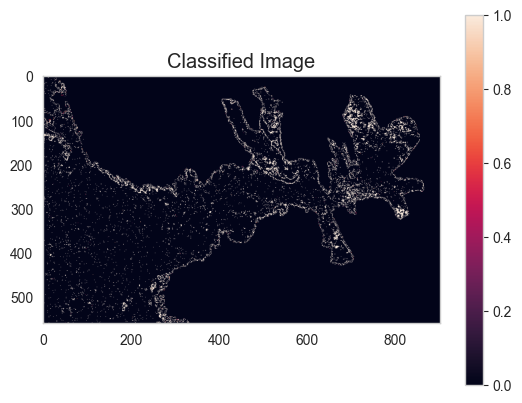

In [13]:
sns.set_style("whitegrid", {'axes.grid' : False})
cmap = ListedColormap(['black', 'gray'])
plt.imshow(clsimage, cmap=cmap)
plt.colorbar(ticks=[0, 1])
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/clsimage.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

### ANN (14 bands)

In [64]:
# ANNbands = np.dstack((b2_,b3_,prod,rat,b2ent8,b3ent8,contHH8,contHV8,enHH8,enHV8,HHOM8,VHOM8,HHD8,VHD8)) #<- without theta? b1_
# ANNbands = ANNbands.reshape(561, 901, 14)

In [65]:
# meta.update({
#     "dtype":rio.float32,
#     "count":14})

In [66]:
# Do it to shove all bands into image
# bands2 = np.moveaxis(ANNbands.squeeze(),-1,0)
# print(bands2.shape) # check new shape, should be (num. bands, X,Y)
# print(meta)
# with rio.open("C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsANN.tif", "w", **meta) as dst:
#         dst.write(bands2)
#         dst.descriptions = tuple(['BNo1', 'BNo2', 'BNo3', 'BNo4','BNo5', 'BNo6', 'BNo7','BNo8','BNo9','BNo10', 'BNo11','BNo12','BNo13','BNo14'])

(14, 561, 901)
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 0.0, 'width': 901, 'height': 561, 'count': 14, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(50.0, 0.0, 498975.0,
       0.0, -50.0, 8559025.0), 'blockxsize': 901, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


In [53]:
# raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsANN.tif"
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20120203_155203_ASC_001.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)
    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, Y_train, Y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)

# Feature Scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [54]:
model = Sequential()

#Adding the input layer and the first hidden layer
model.add(Dense(units = 100,
                kernel_initializer = 'uniform',
                activation = 'relu',
                input_dim = 14))

#the second hidden layer
model.add(Dense(units = 150,
                kernel_initializer = 'uniform',
                activation = 'relu'
                ))

#the third hidden layer
model.add(Dense(units=250,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the fourth hidden layer
model.add(Dense(units=300,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the fifth hidden layer
model.add(Dense(units=350,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the sixth hidden layer
model.add(Dense(units=400,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the seventh hidden layer
model.add(Dense(units=450,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the eighth hidden layer
model.add(Dense(units=500,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the ninth hidden layer
model.add(Dense(units=550,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#the tenth hidden layer
model.add(Dense(units=600,
                kernel_initializer = 'uniform',
                activation= 'relu'))

#adding the output layer
model.add(Dense(units=1,
                kernel_initializer = 'uniform',
                activation = 'sigmoid'))

In [55]:
model.compile(optimizer = 'adam',loss='binary_crossentropy',metrics = ['accuracy'])

In [56]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_88 (Dense)            (None, 100)               1500      
                                                                 
 dense_89 (Dense)            (None, 150)               15150     
                                                                 
 dense_90 (Dense)            (None, 250)               37750     
                                                                 
 dense_91 (Dense)            (None, 300)               75300     
                                                                 
 dense_92 (Dense)            (None, 350)               105350    
                                                                 
 dense_93 (Dense)            (None, 400)               140400    
                                                                 
 dense_94 (Dense)            (None, 450)              

In [ ]:
# Save the model
model.save('ANNmodel.h5')

# Load the model
# loaded_model = tf.keras.models.load_model('ANNmodel.h5')

In [57]:
#Fitting the ANN to the training Set
EPOCHS = 100
Batch_size = 64

# train model
H= model.fit(X_train,
             Y_train,
             batch_size = Batch_size,
             epochs = EPOCHS,
             validation_split = 0.4,
             verbose=1)

Epoch 1/100
221/221 [==============================] - 2s 8ms/step - loss: 0.6665 - accuracy: 0.5815 - val_loss: 0.6335 - val_accuracy: 0.6257
Epoch 2/100
221/221 [==============================] - 2s 9ms/step - loss: 0.6330 - accuracy: 0.6394 - val_loss: 0.6216 - val_accuracy: 0.6531
Epoch 3/100
221/221 [==============================] - 2s 8ms/step - loss: 0.6198 - accuracy: 0.6594 - val_loss: 0.6248 - val_accuracy: 0.6516
Epoch 4/100
221/221 [==============================] - 2s 8ms/step - loss: 0.6170 - accuracy: 0.6597 - val_loss: 0.6153 - val_accuracy: 0.6562
Epoch 5/100
221/221 [==============================] - 2s 8ms/step - loss: 0.6141 - accuracy: 0.6644 - val_loss: 0.6211 - val_accuracy: 0.6554
Epoch 6/100
221/221 [==============================] - 2s 8ms/step - loss: 0.6150 - accuracy: 0.6619 - val_loss: 0.6187 - val_accuracy: 0.6535
Epoch 7/100
221/221 [==============================] - 2s 9ms/step - loss: 0.6106 - accuracy: 0.6614 - val_loss: 0.6156 - val_accuracy: 0.6515

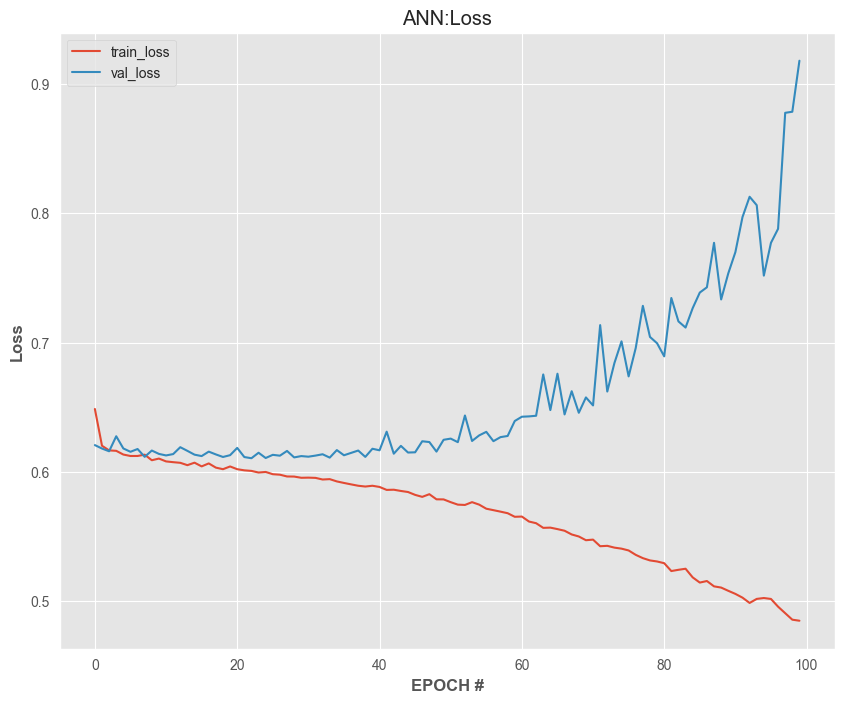

In [28]:
#plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize=[10,8])
plt.plot(N, H.history['loss'],label ='train_loss')
plt.plot(N, H.history['val_loss'],label= 'val_loss')
plt.title("ANN:Loss")
plt.xlabel("EPOCH #",weight='bold')
plt.ylabel("Loss", weight = 'bold')
plt.legend()
plt.show()

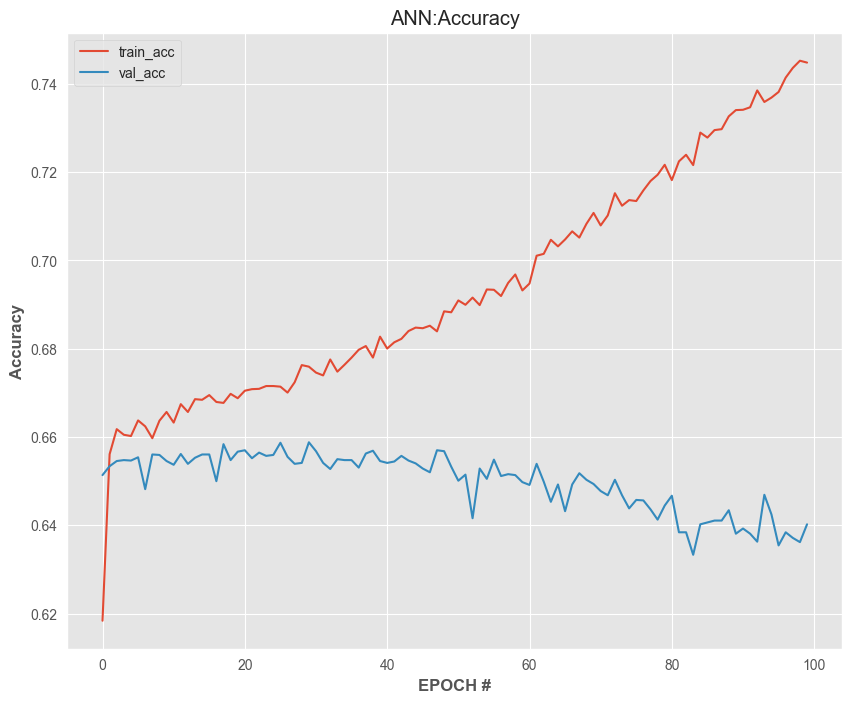

In [29]:
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize=[10,8])
plt.plot(N, H.history['accuracy'],label ='train_acc')
plt.plot(N, H.history['val_accuracy'],label= 'val_acc')
plt.title("ANN:Accuracy")
plt.xlabel("EPOCH #",weight='bold')
plt.ylabel("Accuracy", weight = 'bold')
plt.legend()
plt.show()

In [30]:
y_pred= model.predict(X_test)
y_pred =(y_pred >0.5)

print('*'*20)
score,acc =model.evaluate(X_test, Y_test,batch_size=10)

print("Test Score :",score)
print("Test accuracy :",acc)

316/316 [==============================] - 1s 2ms/step
********************
1010/1010 [==============================] - 2s 2ms/step - loss: 0.9145 - accuracy: 0.6361
Test Score : 0.9145288467407227
Test accuracy : 0.6361204385757446


In [31]:
cfm=confusion_matrix(Y_test,y_pred)
print(cfm)

print("Classification report: ")

print(classification_report(Y_test,y_pred))

acc=accuracy_score(Y_test, y_pred)
print("Accuracy of the model: ",acc)

[[2629 2359]
 [1314 3792]]
Classification report: 
              precision    recall  f1-score   support

           0       0.67      0.53      0.59      4988
           1       0.62      0.74      0.67      5106

    accuracy                           0.64     10094
   macro avg       0.64      0.63      0.63     10094
weighted avg       0.64      0.64      0.63     10094

Accuracy of the model:  0.6361204676045176


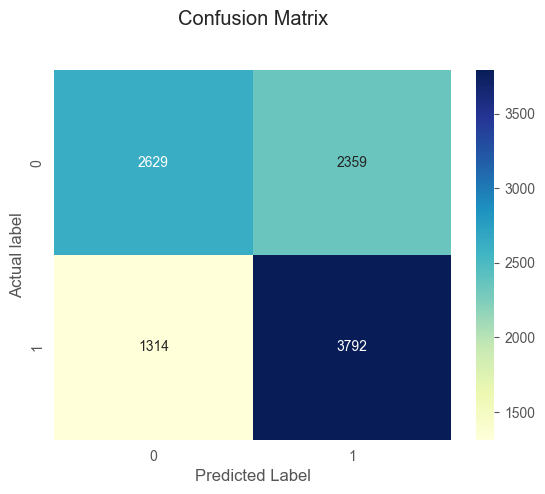

In [32]:
p = sns.heatmap (pd.DataFrame(cfm), annot= True, cmap ="YlGnBu", fmt='g')
plt.title("Confusion Matrix", y=1.1)
plt.ylabel("Actual label")
plt.xlabel("Predicted Label")
plt.show(p)

In [20]:
raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130221_155157_ASC_001_einc_60788acf_8588_4a70_a34e_a09ab2c4d79c.tif"

with rio.open(raster_path_) as src_:
    image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)
    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)


In [58]:
ANN_pred = model.predict(bands_) #Predict using the model
clsimage = ANN_pred.reshape(b1_.shape)

15796/15796 [==============================] - 28s 2ms/step


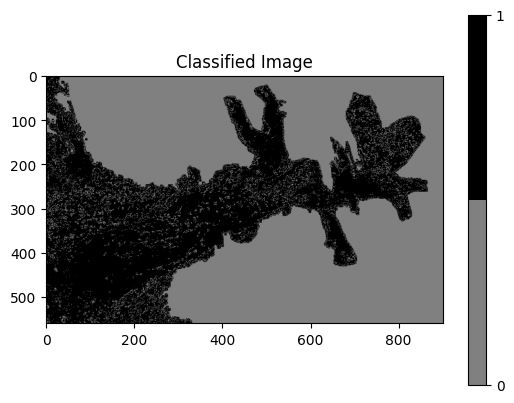

In [59]:
# sns.set_style("whitegrid", {'axes.grid' : False})
cmap = ListedColormap(['gray', 'black'])
plt.imshow(clsimage, cmap=cmap)
plt.colorbar(ticks=[0,1])
plt.title("Classified Image")

# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/GLCM_ANN_7_6.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

plt.show()

# Object Detection

In [12]:
raster = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif"
out = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.shp"

# Input raster file
raster_file = raster

# Output shapefile
shapefile_output = out

# Open the raster file
with rio.open(raster_file) as src:
    # Read the raster data
    image = src.read(1)  # Assuming single-band raster
    transform = src.transform

    # Extract shapes (polygons) and values
    results = (
        {"properties": {"value": value}, "geometry": shape(geom)}
        for geom, value in shapes(image, transform=transform)
        if value != -50  # Exclude no-data or background values
    )

    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame.from_features(results, crs=src.crs)

# Save to shapefile
gdf.to_file(shapefile_output)

print(f"Shapefile saved to {shapefile_output}")

Shapefile saved to C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.shp


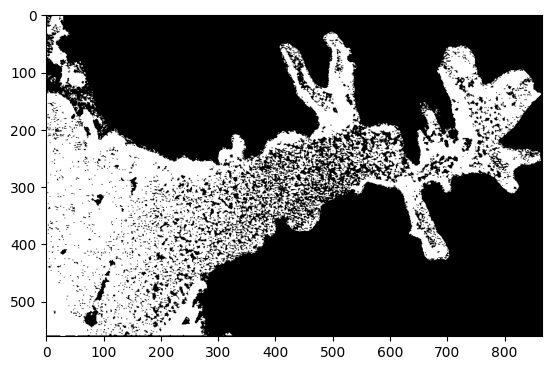

In [2]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130628_154748_ASC_101_einc_9f05602b_4f4d_408d_bd24_4a090af4f0d0.tif"
raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif"
with rio.open(raster_path_) as src_:
    image_ = src_.read() 
    # image_ = src_.read()  # Read all bands
    # image_, transformed = rio.mask.mask(src_, shapes, crop=True, filled=True)
    profile_ = src_.profile  # Save metadata
    transform_ = src_.transform
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)
 
    b1_ = np.where(np.isinf(b1_), np.nan, b1_)
    b2_ = np.where(np.isinf(b2_), np.nan, b2_)          
    b3_ = np.where(np.isinf(b3_), np.nan, b3_)
    b4_ = np.where(np.isinf(b4_), np.nan, b4_)
    b5_ = np.where(np.isinf(b5_), np.nan, b5_)
    b6_ = np.where(np.isinf(b6_), np.nan, b6_)
    b7_ = np.where(np.isinf(b7_), np.nan, b7_)
    b8_ = np.where(np.isinf(b8_), np.nan, b8_)
    b9_ = np.where(np.isinf(b9_), np.nan, b9_)
    b10_ = np.where(np.isinf(b10_), np.nan, b10_)
    b11_ = np.where(np.isinf(b11_), np.nan, b11_)
    b12_ = np.where(np.isinf(b12_), np.nan, b12_)
    b13_ = np.where(np.isinf(b13_), np.nan, b13_)
    b14_ = np.where(np.isinf(b14_), np.nan, b14_)
                
    nan1 = 9
    nan2 = 81
    
    b1_ = np.nan_to_num(b1_, nan=nan1)
    b2_ = np.nan_to_num(b2_, nan=nan1)
    b3_ = np.nan_to_num(b3_, nan=nan1)
    b4_ = np.nan_to_num(b4_, nan=nan1)
    b5_ = np.nan_to_num(b5_, nan=nan2)
    b6_ = np.nan_to_num(b6_, nan=nan2)
    b7_ = np.nan_to_num(b7_, nan=nan1)
    b8_ = np.nan_to_num(b8_, nan=nan1)
    b9_ = np.nan_to_num(b9_, nan=nan1)
    b10_ = np.nan_to_num(b10_, nan=nan1)
    b11_ = np.nan_to_num(b11_, nan=nan1)
    b12_ = np.nan_to_num(b12_, nan=nan1)
    b13_ = np.nan_to_num(b13_, nan=nan2)
    b14_ = np.nan_to_num(b14_, nan=nan2)


    mask1 = (b1_ ==9) & (b1_== 81)
    mask2 = (b2_ ==9) & (b2_== 81)
    mask3 = (b3_ ==9) & (b3_== 81)
    mask4 = (b4_ ==9) & (b4_== 81)
    mask5 = (b5_ ==9) & (b5_== 81)
    mask6 = (b6_ ==9) & (b6_== 81)
    mask7 = (b7_ ==9) & (b7_== 81)
    mask8 = (b8_ ==9) & (b8_== 81)
    mask9 = (b9_ ==9) & (b9_== 81)
    mask10 = (b10_ ==9) & (b10_== 81)
    mask11 = (b11_ ==9) & (b11_== 81)
    mask12 = (b12_ ==9) & (b12_== 81)
    mask13 = (b13_ ==9) & (b13_== 81)
    mask14 = (b14_ ==9) & (b14_== 81)
    
    b1_ = np.ma.masked_array(b1_, mask1)
    b2_ = np.ma.masked_array(b2_, mask2)
    b3_ = np.ma.masked_array(b3_, mask3)
    b4_ = np.ma.masked_array(b4_, mask4)
    b5_ = np.ma.masked_array(b5_, mask5)
    b6_ = np.ma.masked_array(b6_, mask6)
    b7_ = np.ma.masked_array(b7_, mask7)
    b8_ = np.ma.masked_array(b8_, mask8)
    b9_ = np.ma.masked_array(b9_, mask9)
    b10_ = np.ma.masked_array(b10_, mask10)
    b11_ = np.ma.masked_array(b11_, mask11)
    b12_ = np.ma.masked_array(b12_, mask12)
    b13_ = np.ma.masked_array(b13_, mask13)
    b14_ = np.ma.masked_array(b14_, mask14)

    image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)


# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)


# Step 5: Classify the image
predicted = clf.predict(bands_) #Predict using the model
class_image = predicted.reshape(b1_.shape)

# fig, axes = plt.subplots(1, 1, figsize=(10, 10))
chanvese = chan_vese(class_image, max_num_iter=100, extended_output=True)

# ax = axes.flatten()

# # Plotting the original image
# ax[0].imshow(class_image, cmap="gray")
# ax[0].set_title("Original Image")

# Plotting the segmented - 100 iterations image
plt.imshow(chanvese[0], cmap="gray")



# # Plotting the final level set
# ax[2].imshow(chanvese[1], cmap="gray")
# ax[2].set_title("Final Level Set")
# plt.show()

In [150]:
# Apply Sobel filters
sobel_x = sobel(b1_, axis=0)  # Vertical edges
sobel_y = sobel(b1_, axis=1)  # Horizontal edges

# Combine the two directions to get the edge magnitude
sobel_magnitude_ = np.hypot(sobel_x, sobel_y)

# Normalize the result for visualization
sobel_magnitude_ = (sobel_magnitude_ / sobel_magnitude_.max()) * 255
sobel_vert = (sobel_x) * 255
sobel_horz = (sobel_y) * 255

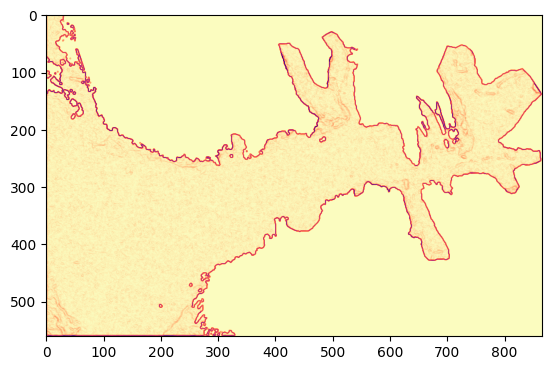

In [151]:
plt.imshow(sobel_magnitude_, cmap="magma_r")

In [152]:
padding = ((0, 0), (0, 35))
sobel_magnitude = np.pad(sobel_magnitude_, padding, mode='constant', constant_values=0)

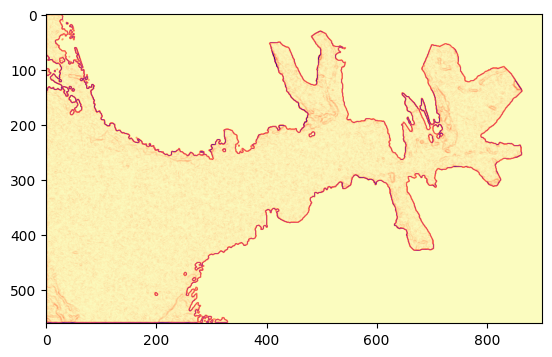

In [153]:
plt.imshow(sobel_magnitude, cmap="magma_r")

In [154]:
np.shape(b1), np.shape(sobel_magnitude)

((561, 901), (561, 901))

In [5]:
arrays = [class_image,sobel_magnitude]

combined_array = np.stack(arrays)

res = np.nanmax(combined_array, axis = 0)

In [103]:
# Normalize the bands for better visualization
band1_norm = (class_image - class_image.min()) / (class_image.max() - class_image.min())
band2_norm = (sobel_magnitude_ - sobel_magnitude_.min()) / (sobel_magnitude_.max() - sobel_magnitude_.min())

# Combine the two bands into an RGB-like array (e.g., Band1 as Red, Band2 as Green, and Blue as 0)
rgb_image = np.dstack((band1_norm, band2_norm, np.zeros_like(band1_norm)))

In [104]:
mask_image = np.dstack((band2_norm, band2_norm, np.zeros_like(band2_norm)))

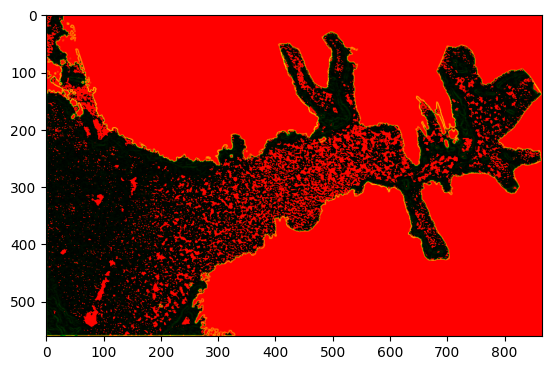

In [105]:
plt.imshow(rgb_image)

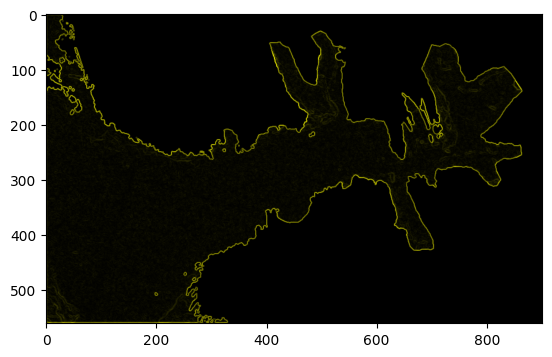

In [101]:
plt.imshow(mask_image)

In [118]:
with fiona.open('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_sobel.shp', "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

In [ ]:
clip, transform = mask(class_image, shapes, crop=False)

In [ ]:
import qgis.core

In [ ]:
from qgis.core import QgsApplication, QgsProcessingFeedback

In [ ]:
from qgis.analysis import QgsRasterCalculator, QgsRasterCalculatorEntry

In [30]:
formula = sobel_magnitude + class_image
# merged_array = (class_image+sobel_magnitude) / 2

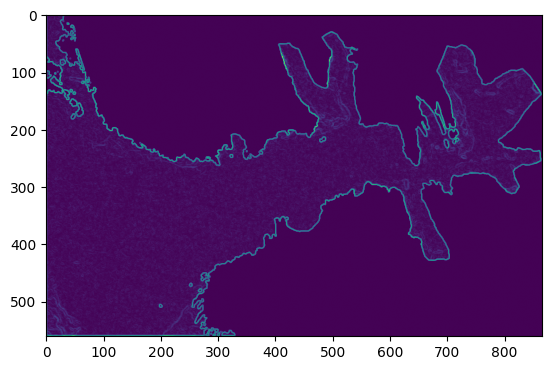

In [31]:
plt.imshow(formula)

In [51]:
from scipy import stats

In [227]:
np.min(sobel_magnitude), np.max(sobel_magnitude), np.median(sobel_magnitude)

(0.0, 255.0, 0.0)

In [248]:
mode_result = stats.mode(sobel_magnitude)

In [249]:
print("Mode:", mode_result.mode[0])
print("Frequency:", mode_result.count[0])

Mode: 0.0
Frequency: 48.0


In [107]:
# Create a binary mask (e.g., mask where values > 0)
# binary_mask = (100 > sobel_magnitude) & (sobel_magnitude > 10)

binary_mask = sobel_magnitude_ > 0

# Apply the mask to the target raster
clipped_data = np.where(binary_mask, band1_norm, np.nan)  # Replace masked areas with NaN

In [ ]:
print(clipped_data)

In [ ]:
# clipped_data[clipped_data == 0] = 1

In [9]:
from scipy.ndimage import zoom

In [108]:
cd_= zoom(clipped_data, 5, order=1)

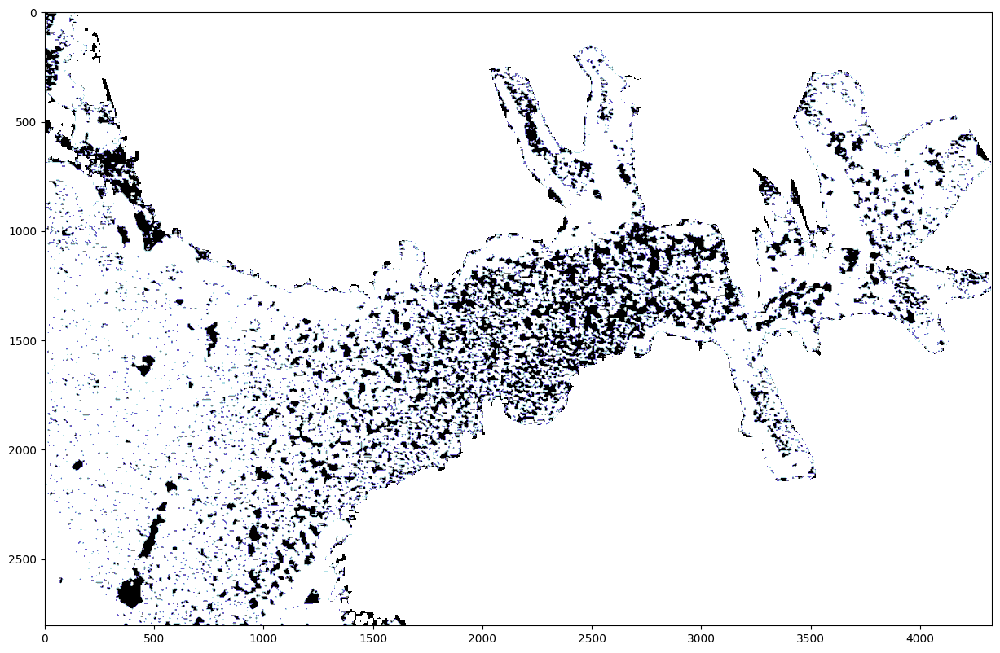

In [109]:
plt.subplots(figsize=(15,10))
custom_cmap = ListedColormap(['#ffffff','#b0e0e6','#6a5acd','#808080','#000000']) #'#b0e0e6','#6a5acd',
plt.imshow(cd_,cmap=custom_cmap)

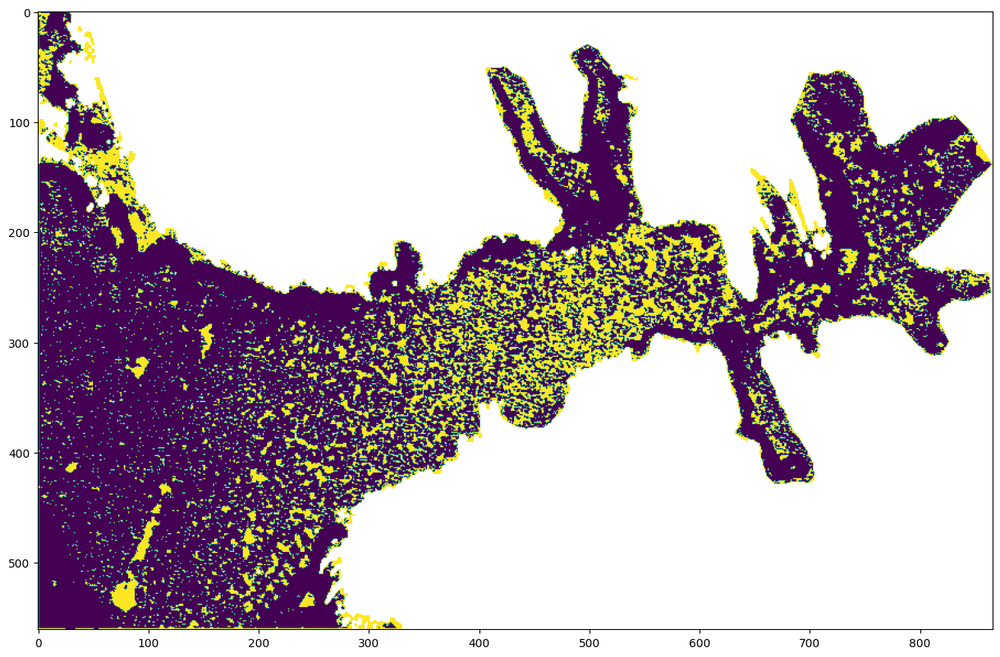

In [13]:
plt.subplots(figsize=(15,10))
plt.imshow(clipped_data)

In [244]:
np.min(clipped_data), np.max(clipped_data)

(nan, nan)

In [250]:
mode_result = stats.mode(clipped_data)

In [251]:
print("Mode:", mode_result.mode[0])
print("Frequency:", mode_result.count[0])

Mode: 1.0
Frequency: 513.0


In [247]:
print(clipped_data)

[[ 1.  1.  1. ... nan nan nan]
 [ 1.  1.  1. ... nan nan nan]
 [ 1.  1.  1. ... nan nan nan]
 ...
 [ 1.  0.  0. ... nan nan nan]
 [ 1.  0.  0. ... nan nan nan]
 [ 1.  1.  1. ... nan nan nan]]


C:\Users\jullian.williams\AppData\Local\Temp\ipykernel_12632\3534796618.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels(['class 1','class 2','class 3','class 4','class 5']) #,'class 5'


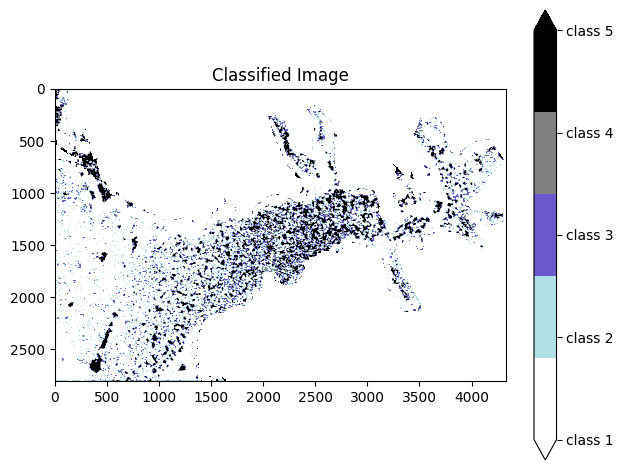

In [339]:
custom_cmap = ListedColormap(['#ffffff','#b0e0e6','#6a5acd','#808080','#000000']) #'#b0e0e6','#6a5acd',
plt.imshow(cd_, cmap=custom_cmap)
cbar = plt.colorbar(cmap=custom_cmap,extend='both')
cbar.ax.locator_params(nbins=4)
cbar.set_ticklabels(['class 1','class 2','class 3','class 4','class 5']) #,'class 5'
plt.title("Classified Image")
plt.tight_layout()
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/save_fig_/sobel_r.png', dpi=1500, bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')

# ,dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png'
plt.show()

In [ ]:
calc = QgsRasterCalculator(formula, "C:/Users/jullian.williams/Desktop/HIRLOMAP/attempt.tif", "GTiff", sobel_magnitude.extent(), sobel_magnitude.width(), sobel_magnitude.height(), [sobel_magnitude, class_image])
calc.processCalculation()
print("Rasters merged successfully!")

In [15]:
out = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_sobel1.shp"
# Output shapefile
shapefile_output = out

 # Extract shapes (polygons) and values
results = (
    {"properties": {"value": value}, "geometry": shape(geom)}
    for geom, value in shapes(clipped_data, transform=transform_))
#     if value != -50  # Exclude no-data or background values
# )

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)

# Save to shapefile
gdf.to_file(shapefile_output)

print(f"Shapefile saved to {shapefile_output}")

Shapefile saved to C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_sobel1.shp


In [ ]:
# gdf = gpd.read_file("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_sobel.shp")
# out_resamp = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_classresamp.shp"
# # Output shapefile
# shapefile_output_resamp = out_resamp

# # Step 2: Resample geometries (e.g., aggregate into a grid)
# # Define a bounding box and grid size
# xmin, ymin, xmax, ymax = gdf.total_bounds
# grid_size = 5.0  # Adjust grid size as needed

# # Create a grid of polygons
# grid = []
# x = xmin
# while x < xmax:
#     y = ymin
#     while y < ymax:
#         grid.append(box(x, y, x + grid_size, y + grid_size))
#         y += grid_size
#     x += grid_size

# grid_gdf = gpd.GeoDataFrame(geometry=grid, crs=gdf.crs)

# # Step 3: Spatial join to aggregate data into the grid
# resampled_gdf = gpd.sjoin(grid_gdf, gdf, how="left", predicate="intersects")

# # Step 4: Save the resampled GeoDataFrame to a new shapefile
# resampled_gdf.to_file(shapefile_output_resamp)

# print(f"Shapefile saved to {shapefile_output_resamp}")

In [104]:
# # Load the shapefile
# gdf = gpd.read_file("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_sobel.shp")

# # Simplify the geometry (tolerance controls the level of simplification)
# gdf['geometry'] = gdf['geometry'].simplify(tolerance=0.01, preserve_topology=True)

# # Save the resampled shapefile
# gdf.to_file("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_classresamp.shp")

In [ ]:
# tsl_fp = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/ras_to_vect/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16_sobel.shp"
# tsl_shp = gpd.read_file(tsl_fp)

# # Plot the shape
# tsl_shp.plot(edgecolor ='black', facecolor = 'None');

In [2]:
from sklearn.decomposition import PCA
import spectral.io.envi as envi #run PCA
from sklearn.cluster import KMeans

(561, 864, 5)
(484704, 5)
(484704,)
(561, 864)


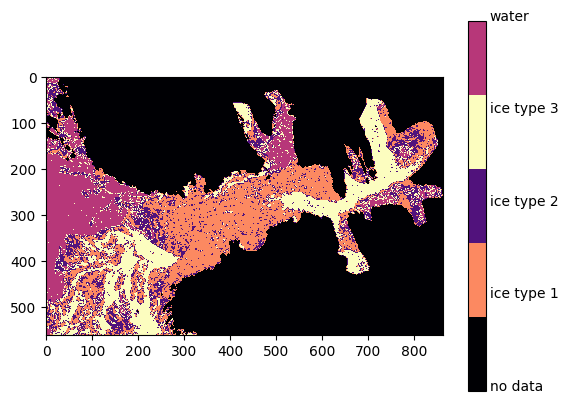

In [3]:
image_data = np.load('C:/Users/jullian.williams/Desktop/HIRLOMAP/labels/img_2_train/5band_clipped.npy')
print(image_data.shape)

image_data_2d = image_data.reshape(-1, image_data.shape[-1] )
print(image_data_2d.shape)

pca = PCA(n_components=3)

# Fit the model to the image data
pca.fit(image_data_2d)

# Transform the data into the PCA space
pca_results = pca.transform(image_data_2d)
pca_results.shape

# # Define the number of clusters
n_clusters = 5

# Initialize the k-means model
kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init='auto')

# Fit the model to the data
kmeans.fit(pca_results)

# Predict the cluster assignments for each pixel
labels = kmeans.predict(pca_results)
print(labels.shape)

# Define new label mapping
label_mapping = {0:0,1:1,2:4,3:3,4:2}

# Relabel clusters
labels_ = np.array([label_mapping[label] for label in labels])

# Reshape the labels back into the original image shape
labels_ = labels_.reshape(image_data.shape[0], image_data.shape[1])
print(labels_.shape)



#hex_colors = ['#000004', '#b73779', '#fcfdbf','#fc8961','#51127c' ]
#black, magenta, light yellow, orange, purple.
hex_colors = ['#000004','#fc8961','#51127c','#fcfdbf','#b73779']
custom_cmap = ListedColormap(hex_colors)
# Plot the image and display the results
plt.imshow(labels_, cmap=custom_cmap)

cbar = plt.colorbar()
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(['no data','ice type 1','ice type 2','ice type 3','water']):
    cbar.ax.text(1.2, (8 * j + 1) / 8.0, lab, ha='left', va='top')

#plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/labels/img_2_train/5band_kmeansbar.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

## Example start point: SVM class out

C:\Users\jullian.williams\AppData\Local\Temp\ipykernel_10484\378217178.py:162: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 600x600 with 2 Axes> which fig.colorbar is called on.
  cbar = fig2.colorbar(image1, ax=axes2, extend='both')


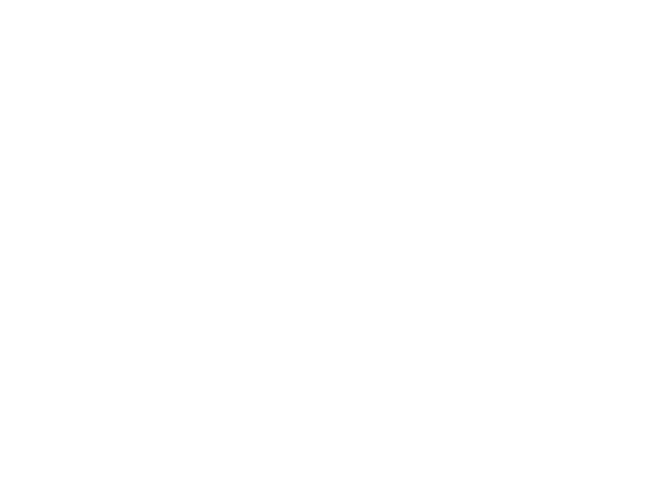

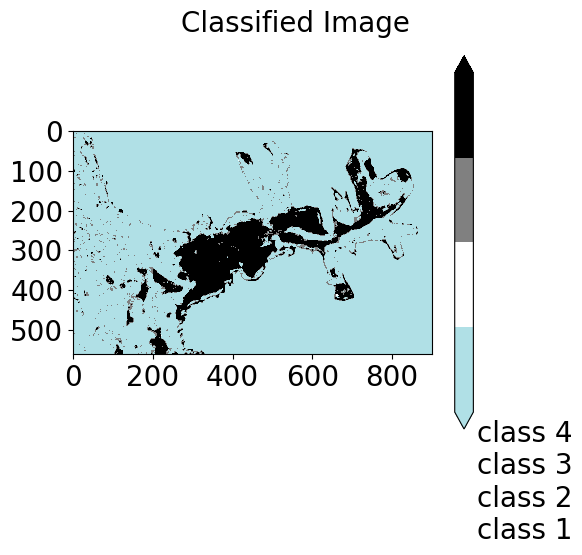

In [2]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130628_154748_ASC_101_einc_9f05602b_4f4d_408d_bd24_4a090af4f0d0.tif"
raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCWA_20120604_063534_DES_024_einc_6d27c7e4_387c_4ef5_8bf0_67292936a568.tif"
with rio.open(raster_path_) as src_:
    # image_, transformed = rio.mask.mask(src_, shapes, crop=True, filled=True)
    # image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    transform_ = src_.transform  # Save metadata
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    b1_ = np.where(np.isinf(b1_), np.nan, b1_)
    b2_ = np.where(np.isinf(b2_), np.nan, b2_)          
    b3_ = np.where(np.isinf(b3_), np.nan, b3_)
    b4_ = np.where(np.isinf(b4_), np.nan, b4_)
    b5_ = np.where(np.isinf(b5_), np.nan, b5_)
    b6_ = np.where(np.isinf(b6_), np.nan, b6_)
    b7_ = np.where(np.isinf(b7_), np.nan, b7_)
    b8_ = np.where(np.isinf(b8_), np.nan, b8_)
    b9_ = np.where(np.isinf(b9_), np.nan, b9_)
    b10_ = np.where(np.isinf(b10_), np.nan, b10_)
    b11_ = np.where(np.isinf(b11_), np.nan, b11_)
    b12_ = np.where(np.isinf(b12_), np.nan, b12_)
    b13_ = np.where(np.isinf(b13_), np.nan, b13_)
    b14_ = np.where(np.isinf(b14_), np.nan, b14_)
                
    nan1 = 9
    nan2 = 81
    
    b1_ = np.nan_to_num(b1_, nan=nan1)
    b2_ = np.nan_to_num(b2_, nan=nan1)
    b3_ = np.nan_to_num(b3_, nan=nan1)
    b4_ = np.nan_to_num(b4_, nan=nan1)
    b5_ = np.nan_to_num(b5_, nan=nan2)
    b6_ = np.nan_to_num(b6_, nan=nan2)
    b7_ = np.nan_to_num(b7_, nan=nan1)
    b8_ = np.nan_to_num(b8_, nan=nan1)
    b9_ = np.nan_to_num(b9_, nan=nan1)
    b10_ = np.nan_to_num(b10_, nan=nan1)
    b11_ = np.nan_to_num(b11_, nan=nan1)
    b12_ = np.nan_to_num(b12_, nan=nan1)
    b13_ = np.nan_to_num(b13_, nan=nan2)
    b14_ = np.nan_to_num(b14_, nan=nan2)


    mask1 = (b1_ ==9) & (b1_== 81)
    mask2 = (b2_ ==9) & (b2_== 81)
    mask3 = (b3_ ==9) & (b3_== 81)
    mask4 = (b4_ ==9) & (b4_== 81)
    mask5 = (b5_ ==9) & (b5_== 81)
    mask6 = (b6_ ==9) & (b6_== 81)
    mask7 = (b7_ ==9) & (b7_== 81)
    mask8 = (b8_ ==9) & (b8_== 81)
    mask9 = (b9_ ==9) & (b9_== 81)
    mask10 = (b10_ ==9) & (b10_== 81)
    mask11 = (b11_ ==9) & (b11_== 81)
    mask12 = (b12_ ==9) & (b12_== 81)
    mask13 = (b13_ ==9) & (b13_== 81)
    mask14 = (b14_ ==9) & (b14_== 81)
    
    b1_ = np.ma.masked_array(b1_, mask1)
    b2_ = np.ma.masked_array(b2_, mask2)
    b3_ = np.ma.masked_array(b3_, mask3)
    b4_ = np.ma.masked_array(b4_, mask4)
    b5_ = np.ma.masked_array(b5_, mask5)
    b6_ = np.ma.masked_array(b6_, mask6)
    b7_ = np.ma.masked_array(b7_, mask7)
    b8_ = np.ma.masked_array(b8_, mask8)
    b9_ = np.ma.masked_array(b9_, mask9)
    b10_ = np.ma.masked_array(b10_, mask10)
    b11_ = np.ma.masked_array(b11_, mask11)
    b12_ = np.ma.masked_array(b12_, mask12)
    b13_ = np.ma.masked_array(b13_, mask13)
    b14_ = np.ma.masked_array(b14_, mask14)

    # image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)


# Step 2: Load the shapefile
shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
shapefile = gpd.read_file(shapefile_path)

# Step 3: Extract training data
# Assuming the shapefile has a 'class' column for labels
training_data = []
labels = []

for _, row in shapefile.iterrows():
    geom = row.geometry
    label = row['Class_']
    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
    pixels = image[mask]
    training_data.append(pixels)
    labels.extend([label] * len(pixels))

training_data = np.vstack(training_data)
labels = np.array(labels)

# Step 4: Train the SVM model
X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
clf.fit(X_train, y_train)

# Step 5: Classify the image
predicted = clf.predict(bands_) #Predict using the model
class_image = predicted.reshape(b1_.shape)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")

# Generate classification report
report = classification_report(y_test, y_pred)
# print(report)

cmap_ = ListedColormap(['white','powderblue','gray','black'])
cmap_1 = ListedColormap(['powderblue','white','gray','black'])
fig1, axes1 = plt.subplots()
fig2, axes2 = plt.subplots(figsize=(6,6))
image1 = axes1.imshow(class_image, cmap=cmap_1)
fig1.gca().set_visible(False)
image2 = axes2.imshow(class_image,cmap=cmap_)
cbar = fig2.colorbar(image1, ax=axes2, extend='both')
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(['class 1','class 2','class 3','class 4']):
    cbar.ax.text(1.2, (4 * j + 1) / 14.0, lab, ha='left', va='top',fontsize=20)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
fig2.suptitle("Classified Image",fontsize=20)
fig2.subplots_adjust(top=1.0)
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/amend_classification_SVM/img.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.tight_layout()
plt.show()

## Tensorflow item: Not active/necessary in queue. Keep for something else.

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics.pairwise import cosine_similarity

In [10]:
model = VGG16(weights='imagenet', include_top=False)

58889256/58889256 [==============================] - 2s 0us/step


In [13]:
# Function to preprocess and extract features
def extract_features(image_path):
    image = load_img(image_path, target_size=(224, 224))  # Resize image
    image_array = img_to_array(image)  # Convert to array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = preprocess_input(image_array)  # Preprocess for VGG16
    features = model.predict(image_array)  # Extract features
    return features.flatten()  # Flatten the feature map

# Paths to the two images
image1_path = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/labels/img_2_train/5band_kmeans.png' # Correctly classified image
image2_path = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/Winter_train_stack/multi_class_img2/RS2_SCWA_20120604_063534_DES_024_einc_6d27c7e4_387c_4ef5_8bf0_67292936a568.png'  # Image to be corrected

# Extract features for both images
features1 = extract_features(image1_path)
features2 = extract_features(image2_path)

# Compute cosine similarity
similarity = cosine_similarity([features1], [features2])[0][0]

# Threshold for classification correction
# threshold = 0.8  # Adjust based on your use case
# if similarity > threshold:
#     print(f"The images are similar (similarity: {similarity:.2f}). Classification might be corrected.")
# else:
#     print(f"The images are not similar enough (similarity: {similarity:.2f}).")

1/1 [==============================] - 0s 91ms/step


In [15]:
threshold = 0.15  # Adjust based on your use case
if similarity > threshold:
    print(f"The images are similar (similarity: {similarity:.2f}). Classification might be corrected.")
else:
    print(f"The images are not similar enough (similarity: {similarity:.2f}).")

The images are similar (similarity: 0.26). Classification might be corrected.


In [24]:
model1 = kmeans  # First image classification model
model2 = clf  # Second reclassification model

# Step 1: Get predictions from the first model
predictions1 = model1.predict(pca_results)
print("First model predictions:", predictions1)

# Step 2: Use the output of the first model as input to the second model
# (Ensure the second model is designed to accept this input format)
predictions2 = model2.predict(bands_)
print("Second model predictions:", predictions2)

# Step 3: Interpret the final classification
final_class = np.argmax(predictions2, axis=-1)
print("Final reclassified label:", final_class)

First model predictions: [2 2 2 ... 0 0 0]
Second model predictions: [1 0 0 ... 0 0 0]
Final reclassified label: 0


In [7]:
# Paths to the two images
image1_path = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/labels/img_2_train/5band_kmeans.png' # Correctly classified image
image2_path = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/Winter_train_stack/multi_class_img2/RS2_SCWA_20120604_063534_DES_024_einc_6d27c7e4_387c_4ef5_8bf0_67292936a568.png'  # Image to be corrected


In [5]:
temp = np.less(labels_,2)
np.putmask(labels_, temp, 0)
temp = np.greater_equal(labels_, 2)
np.putmask(labels_, temp, 1)

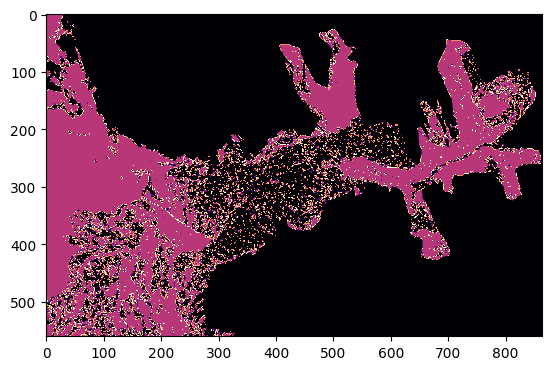

In [6]:
hex_colors = ['#000004','#fc8961','#51127c','#fcfdbf','#b73779']
custom_cmap = ListedColormap(hex_colors)
# Plot the image and display the results
plt.imshow(temp, cmap=custom_cmap)
# cbar = plt.colorbar()
# cbar.ax.get_yaxis().set_ticks([])
# for j, lab in enumerate(['no data','ice type 1','ice type 2','ice type 3','water']):
#     cbar.ax.text(1.2, (8 * j + 1) / 8.0, lab, ha='left', va='top')

## Start object detection process

In [5]:
# print(class_image)

In [4]:
np.set_printoptions(precision=10)
np.max(class_image),np.min(class_image), np.median(class_image)

(4, 1, 2.0)

In [8]:
# temp = np.less(predicted,2)
# np.putmask(predicted, temp, 0)
# temp = np.greater_equal(predicted, 2)
# np.putmask(predicted, temp, 1)
# px = temp.reshape(b1_.shape)

In [3]:
im = ndimage.gaussian_filter(class_image, sigma=0)

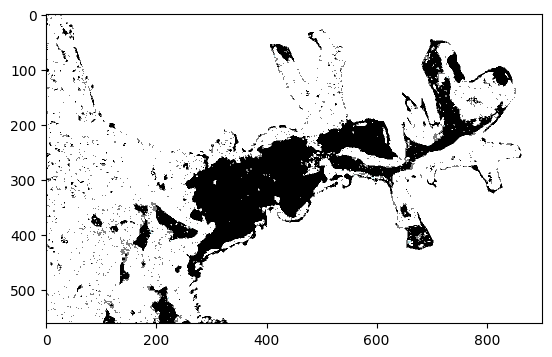

In [201]:
plt.imshow(im, cmap=cmap_1)

In [5]:
mask = im > im.mean()

In [6]:
label_im, nb_labels = ndimage.label(mask)
# plt.imshow(label_im)   

In [7]:
sizes = ndimage.sum(mask, label_im, range(nb_labels + 1))
mean_vals = ndimage.sum(im, label_im, range(1, nb_labels + 1))

In [8]:
mask_size = sizes < 1000
remove_pixel = mask_size[label_im]
remove_pixel.shape
label_im[remove_pixel] = 0
# plt.imshow(label_im)    

In [9]:
labels = np.unique(label_im)
label_im = np.searchsorted(labels, label_im)

In [10]:
slice_x, slice_y = ndimage.find_objects(label_im==0)[0]
roi = im[slice_x, slice_y]
# plt.imshow(roi, cmap=cmap_) 

In [11]:
def disk_structure(n):
    struct = np.zeros((2 * n + 1, 2 * n + 1))
    x, y = np.indices((2 * n + 1, 2 * n + 1))
    mask = (x - n)**2 + (y - n)**2 <= n**2
    struct[mask] = 1
    return struct.astype(np.bool_)

def granulometry(data, sizes=None):
    s = max(data.shape)
    if sizes is None:
        sizes = range(1, s/2, 2)
    granulo = [ndimage.binary_opening(data, \
        structure=disk_structure(n)).sum() for n in sizes]
    return granulo


np.random.seed(1)
n = 10
l = 256
im = ndimage.gaussian_filter(im, sigma=0.1)
mask = im > im.mean()
granulo = granulometry(mask, sizes=np.arange(2, 19, 4))

## Canny edge detection

In [141]:
from skimage import io, feature, transform

In [142]:
# Apply edge detection
edges = feature.canny(b1_, sigma=3)

# Perform Hough Transform
hough_space, angles, distances = transform.hough_line(edges)

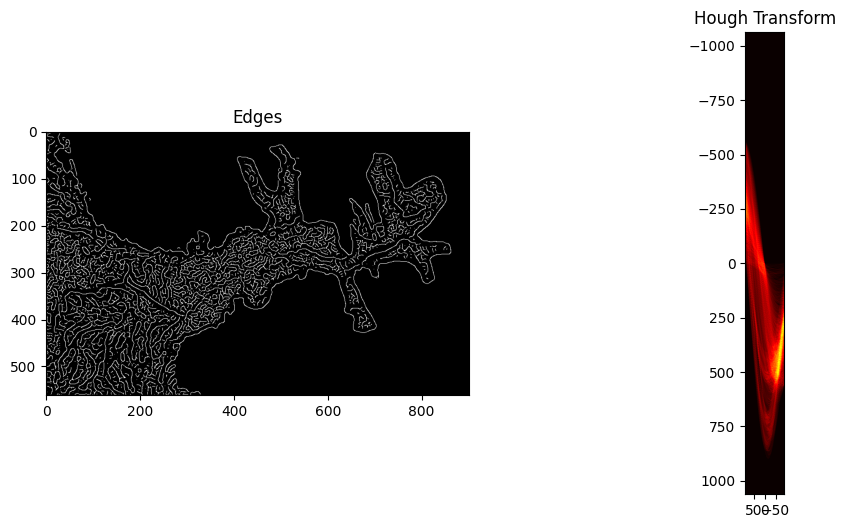

In [329]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(edges, cmap='gray')
ax[0].set_title('Edges')
ax[1].imshow(hough_space, cmap='hot', extent=[np.rad2deg(angles[-1]), np.rad2deg(angles[0]), distances[-1], distances[0]])
ax[1].set_title('Hough Transform')
plt.show()

## Disk structure 

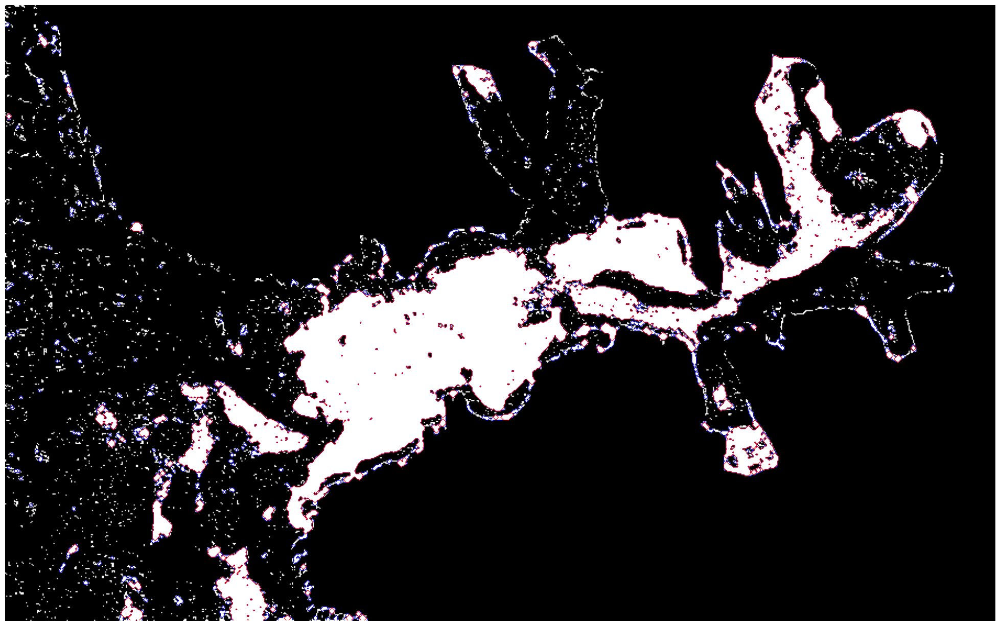

In [202]:
plt.figure(figsize=(25,25))
plt.imshow(mask, cmap=plt.cm.gray)
opened = ndimage.binary_opening(mask, structure=disk_structure(1))
opened_more = ndimage.binary_opening(mask, structure=disk_structure(2))
# opened_evnmore = ndimage.binary_opening(mask, structure=disk_structure(20))
plt.contour(opened, [0.5], colors='b', linewidths=0.75)
plt.contour(opened_more, [0.5], colors='r', linewidths=0.75)
# plt.contour(opened_evnmore, [0.5], colors='m', linewidths=0.75)
plt.axis('off')
# plt.subplot(122)
# plt.plot(np.arange(2, 19, 4), granulo, 'ok', ms=8)
# plt.subplots_adjust(wspace=0.02, hspace=0.15, top=0.95, bottom=0.15, left=0, right=0.95)
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/enclosed.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

In [12]:
bigger_points = ndimage.grey_dilation(im, size=(7,7), structure=np.ones((7,7)))

In [144]:
print(bigger_points.dtype)

int32


In [36]:
print(mask.dtype)

bool


In [ ]:
plt.figure(figsize=(25,25))
plt.subplot(121)
plt.imshow(im, interpolation='nearest', cmap=plt.cm.nipy_spectral)
plt.axis('off')
plt.subplot(122)
plt.imshow(bigger_points, interpolation='nearest', cmap=plt.cm.nipy_spectral)
plt.axis('off')
plt.subplots_adjust(wspace=0, hspace=0.02, top=0.99, bottom=0.01, left=0.01, right=0.99)
plt.show()

In [13]:
mk_ = bigger_points > bigger_points.mean()

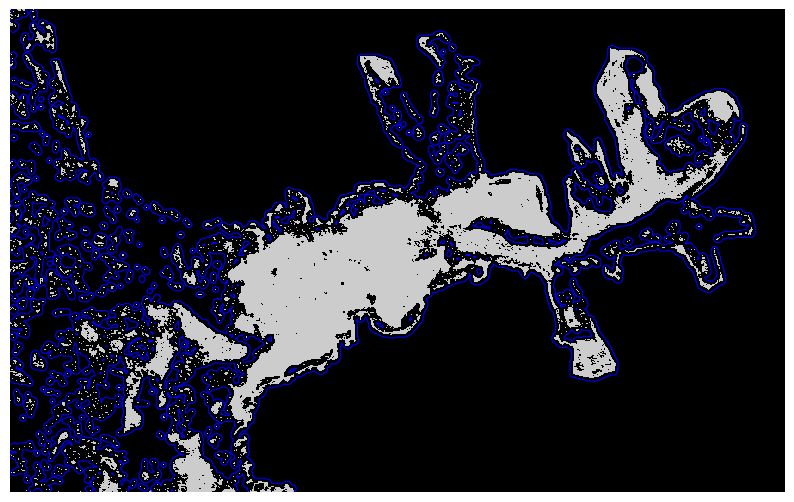

In [204]:
plt.figure(figsize=(10,9))
plt.imshow(mask, interpolation='nearest', cmap=plt.cm.nipy_spectral)
op = ndimage.binary_opening(mk_, structure=disk_structure(3))
plt.contour(op, [0.5], colors='b', linewidths=0.75)
plt.axis('off')
plt.show()

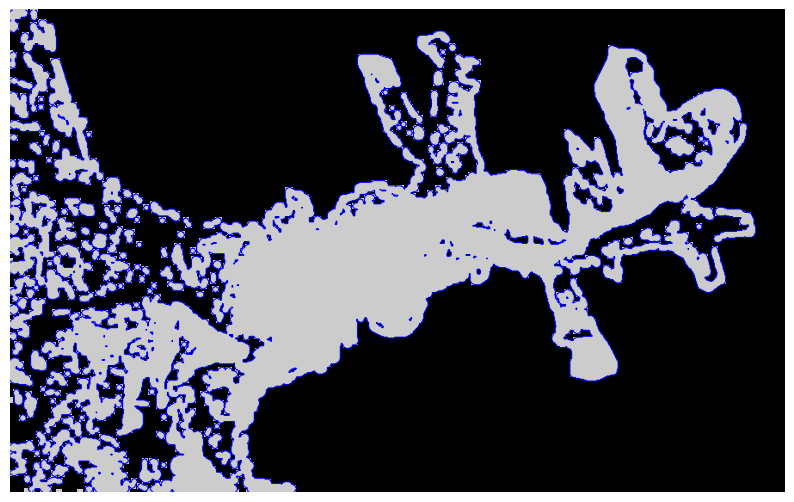

In [205]:
plt.figure(figsize=(10,9))
plt.imshow(mk_, interpolation='nearest', cmap=plt.cm.nipy_spectral)
op = ndimage.binary_opening(mk_, structure=disk_structure(3))
plt.contour(op, [0.5], colors='b', linewidths=0.75)
plt.axis('off')
plt.show()

In [14]:
# arr =  1*mk_ #Convert from bool to int
arr = 1*mask

## Geodataframe for vector and matrices operands

In [15]:
 # Extract shapes (polygons) and values
results = (
    {"properties": {"value": value}, "geometry": shape(geom)}
    for geom, value in shapes(arr, transform=transform_))
#     if value != -50  # Exclude no-data or background values
# )

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)

In [16]:
gdf['area'] = gdf.geometry.area
gdf['perimeter'] = gdf.geometry.length
gdf['centroid'] = gdf.geometry.centroid
# Extract latitude and longitude from centroids
gdf['longitude'] = gdf.centroid.x
gdf['latitude'] = gdf.centroid.y

In [45]:
print(gdf)

                                               geometry  value          area  \
0     POLYGON ((498975 8559025, 498975 8558975, 4990...    1.0  2.500000e+03   
1     POLYGON ((500325 8559025, 500325 8558975, 5003...    1.0  2.500000e+03   
2     POLYGON ((499375 8559025, 499375 8558975, 4994...    1.0  2.250000e+04   
3     POLYGON ((499675 8559025, 499675 8558975, 4997...    1.0  1.750000e+04   
4     POLYGON ((499125 8558925, 499125 8558875, 4992...    1.0  5.000000e+03   
...                                                 ...    ...           ...   
3156  POLYGON ((499025 8559025, 499025 8558975, 4989...    0.0  1.077078e+09   
3157  POLYGON ((511775 8531275, 511775 8531175, 5116...    1.0  1.325000e+05   
3158  POLYGON ((512825 8531025, 512825 8530975, 5128...    1.0  2.500000e+03   
3159  POLYGON ((514975 8531425, 514975 8531325, 5149...    1.0  2.900000e+05   
3160  POLYGON ((514825 8531075, 514825 8531025, 5147...    0.0  2.250000e+04   

      perimeter                        

In [17]:
# Function to calculate orientation
def calculate_orientation(geometry):
    coords = np.array(geometry.exterior.coords)
    x = coords[:, 0]
    y = coords[:, 1]
    
    # Covariance matrix
    cov_matrix = np.cov(x, y)
    
    # Eigenvalues and eigenvectors
    eigvals, eigvecs = np.linalg.eig(cov_matrix)
    
    # Orientation angle (radians to degrees)
    largest_eigenvec = eigvecs[:, np.argmax(eigvals)]
    angle = np.arctan2(largest_eigenvec[1], largest_eigenvec[0])
    return np.degrees(angle)

# Function to calculate roundness
roundness = (4 * np.pi * gdf['area']) / (gdf['perimeter'] ** 2)

# Apply orientation calculation
gdf["orientation"] = gdf.geometry.apply(calculate_orientation)
gdf["roundness"] = roundness
gdf.set_crs(epsg=32633, inplace=True)

# Display results
# print(gdf[["geometry", "centroid", "orientation","roundness"]])

,geometry,value,area,perimeter,centroid,longitude,latitude,orientation,roundness
0,"POLYGON ((498975 8559025, 498975 8558975, 4990...",1.0,2.500000e+03,200.0,POINT (499000 8559000),499000.000000,8.559000e+06,-45.000000,0.785398
1,"POLYGON ((500325 8559025, 500325 8558975, 5003...",1.0,2.500000e+03,200.0,POINT (500350 8559000),500350.000000,8.559000e+06,-45.000000,0.785398
2,"POLYGON ((499375 8559025, 499375 8558975, 4994...",1.0,2.250000e+04,700.0,POINT (499511.111 8558977.778),499511.111111,8.558978e+06,-5.773345,0.577027
3,"POLYGON ((499675 8559025, 499675 8558975, 4997...",1.0,1.750000e+04,700.0,POINT (499785.714 8558964.286),499785.714286,8.558964e+06,-26.243694,0.448799
4,"POLYGON ((499125 8558925, 499125 8558875, 4992...",1.0,5.000000e+03,300.0,POINT (499175 8558900),499175.000000,8.558900e+06,-6.264404,0.698132
...,...,...,...,...,...,...,...,...,...
3156,"POLYGON ((499025 8559025, 499025 8558975, 4989...",0.0,1.077078e+09,1526700.0,POINT (521548.897 8545120.375),521548.896551,8.545120e+06,-62.739133,0.005807
3157,"POLYGON ((511775 8531275, 511775 8531175, 5116...",1.0,1.325000e+05,2300.0,POINT (511744.34 8531071.698),511744.339623,8.531072e+06,4.047972,0.314753
3158,"POLYGON ((512825 8531025, 512825 8530975, 5128...",1.0,2.500000e+03,200.0,POINT (512850 8531000),512850.000000,8.531000e+06,-45.000000,0.785398
3159,"POLYGON ((514975 8531425, 514975 8531325, 5149...",1.0,2.900000e+05,5100.0,POINT (514893.534 8531138.793),514893.534483,8.531139e+06,1.637162,0.140109


In [24]:
print(gdf)

                                               geometry  value          area  \
0     POLYGON ((498975 8559025, 498975 8558975, 4990...    1.0  2.500000e+03   
1     POLYGON ((500325 8559025, 500325 8558975, 5003...    1.0  2.500000e+03   
2     POLYGON ((499375 8559025, 499375 8558975, 4994...    1.0  2.250000e+04   
3     POLYGON ((499675 8559025, 499675 8558975, 4997...    1.0  1.750000e+04   
4     POLYGON ((499125 8558925, 499125 8558875, 4992...    1.0  5.000000e+03   
...                                                 ...    ...           ...   
3156  POLYGON ((499025 8559025, 499025 8558975, 4989...    0.0  1.077078e+09   
3157  POLYGON ((511775 8531275, 511775 8531175, 5116...    1.0  1.325000e+05   
3158  POLYGON ((512825 8531025, 512825 8530975, 5128...    1.0  2.500000e+03   
3159  POLYGON ((514975 8531425, 514975 8531325, 5149...    1.0  2.900000e+05   
3160  POLYGON ((514825 8531075, 514825 8531025, 5147...    0.0  2.250000e+04   

      perimeter                        

In [50]:
# Wild.. 

# def calculate_orientation(geometry):
#     # Get the minimum rotated rectangle
#     rect = geometry.minimum_rotated_rectangle
#     # Extract the coordinates of the rectangle
#     coords = list(rect.exterior.coords)
#     # Calculate the angle of the longest side
#     dx = coords[1][0] - coords[0][0]
#     dy = coords[1][1] - coords[0][1]
#     angle = np.arctan2(dy, dx) * 180 / np.pi  # Convert radians to degrees
#     return angle

# # Apply the function to the geometry column
# gdf['orientation'] = gdf['geometry'].apply(calculate_orientation)
# gdf['orientation'] = np.round(gdf['orientation'], 0)

In [ ]:
# Just in case... But also wild.

# from shapely.geometry.polygon import orient

# # Force clockwise orientation
# gdf['oriented_geometry'] = gdf['geometry'].apply(lambda geom: orient(geom, sign=-1))

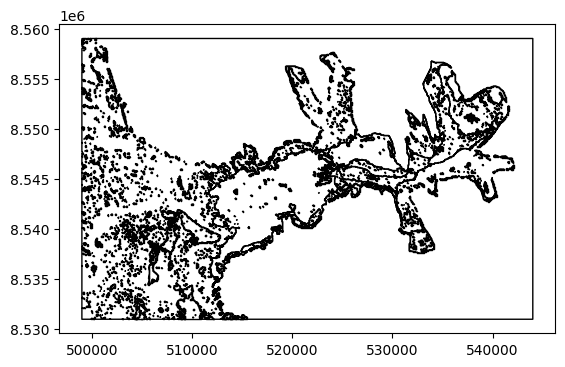

In [25]:
gdf.plot(edgecolor ='black', facecolor = 'None');

In [97]:
np.max(gdf['longitude']),np.min(gdf['longitude'])

(541628.6697247706, 499058.1081081081)

In [96]:
np.max(gdf['orientation']),np.min(gdf['orientation']),np.mean(gdf['orientation'])

(44.99999999999989, -134.08347874591098, -47.052455783136296)

In [39]:
print(gdf)

                                              geometry  value         area  \
0    POLYGON ((500125 8559025, 500125 8558725, 5001...    1.0     242500.0   
1    POLYGON ((498975 8559025, 498975 8557675, 4993...    1.0     802500.0   
2    POLYGON ((500625 8558025, 500625 8557875, 5007...    0.0      57500.0   
3    POLYGON ((523925 8557775, 523925 8557725, 5237...    1.0     672500.0   
4    POLYGON ((500675 8558425, 500675 8558375, 5006...    1.0    2512500.0   
..                                                 ...    ...          ...   
210  POLYGON ((508425 8534475, 508425 8534425, 5083...    1.0    5670000.0   
211  POLYGON ((501075 8531325, 501075 8530975, 5014...    1.0     122500.0   
212  POLYGON ((511625 8531425, 511625 8531275, 5112...    1.0     355000.0   
213  POLYGON ((500025 8559025, 500025 8558775, 4999...    0.0  950765000.0   
214  POLYGON ((513925 8531025, 513925 8530975, 5140...    0.0       7500.0   

     perimeter                        centroid      longitude  

In [19]:
np.max(gdf['value']),np.min(gdf['value'])

(1.0, 0.0)

In [22]:
print(label)

4


In [278]:
np.max(gdf['orientation']),np.min(gdf['orientation'])

(90.0, -131.11741699078735)

## Finding orientation and shape of objects 

In [435]:
# lent = gdf[(-20 <= gdf['orientation']) & (gdf['orientation'] <= 0) ] 

In [447]:
lent = gdf[(-90 <= gdf['orientation']) & (gdf['orientation'] <= -70) & (gdf['roundness'] <= 0.6)]

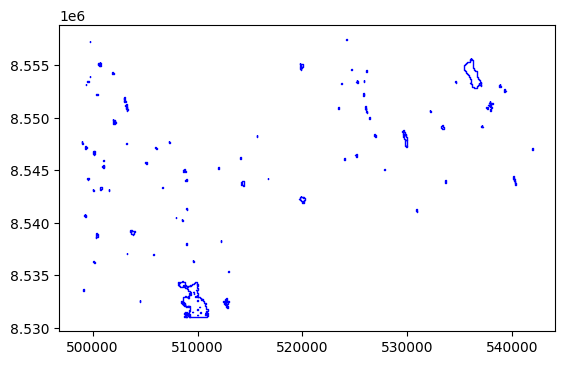

In [448]:
lent.plot(edgecolor ='blue', facecolor = 'None');

In [ ]:
NE = gdf[(45 >= gdf['orientation']) & (gdf['orientation'] >= 20)] 
print(NE)

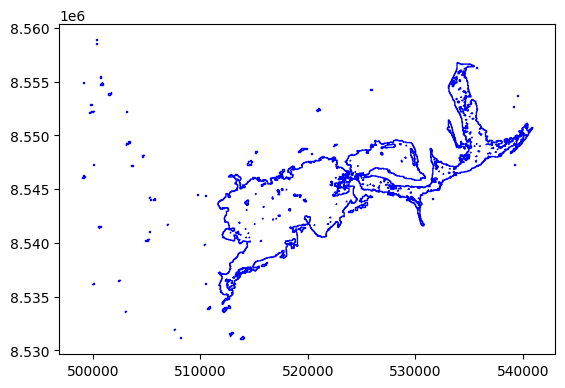

In [372]:
NE.plot(edgecolor ='blue', facecolor = 'None');

In [ ]:
N = gdf[(-40 <= gdf['orientation']) & (gdf['orientation'] <= 0)] 
print(N)

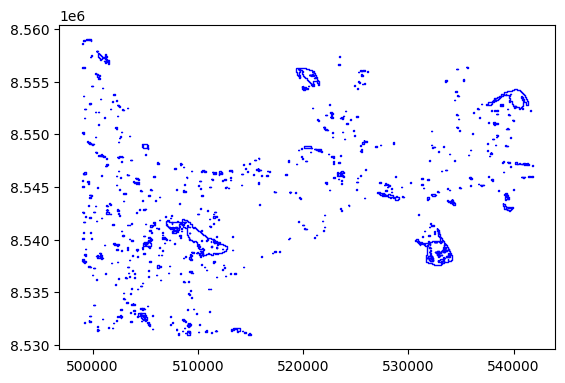

In [376]:
N.plot(edgecolor ='blue', facecolor = 'None');

In [ ]:
S = gdf[(-180 <= gdf['orientation']) & (gdf['orientation'] <= -100)] 
print(S)

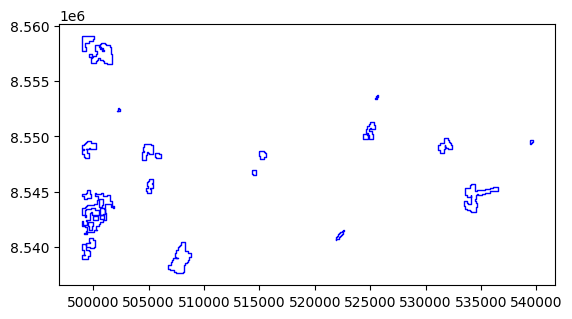

In [45]:
S.plot(edgecolor ='blue', facecolor = 'None');

In [48]:
S = gdf[(100 <= gdf['orientation']) & (gdf['orientation'] <= 180)] 
print(S)

Empty GeoDataFrame
Columns: [geometry, value, area, perimeter, centroid, longitude, latitude, orientation, roundness]
Index: []


In [40]:
W = gdf[(-98 >= gdf['orientation']) & (gdf['orientation'] >= -90)] 
print(W)

Empty GeoDataFrame
Columns: [geometry, value, area, perimeter, centroid, longitude, latitude, orientation, roundness]
Index: []


In [41]:
E = gdf[(98 >= gdf['orientation']) & (gdf['orientation'] >= 90)] 
print(E)

Empty GeoDataFrame
Columns: [geometry, value, area, perimeter, centroid, longitude, latitude, orientation, roundness]
Index: []


In [319]:
np.max(gdf['roundness'])

0.7853981633974484

In [320]:
thicc = gdf[(-140 <= gdf['orientation']) & (gdf['orientation'] <= -10) & (gdf['roundness'] >= 0.6)] #0.6

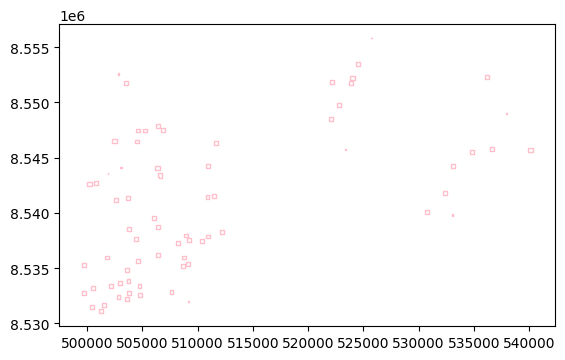

In [321]:
thicc.plot(edgecolor ='pink', facecolor = 'None');

In [72]:
right =  gdf[(-120 <= gdf['orientation']) & (gdf['orientation'] <= -50)]

In [176]:
lrg = gdf[gdf['area'] < 50000000]

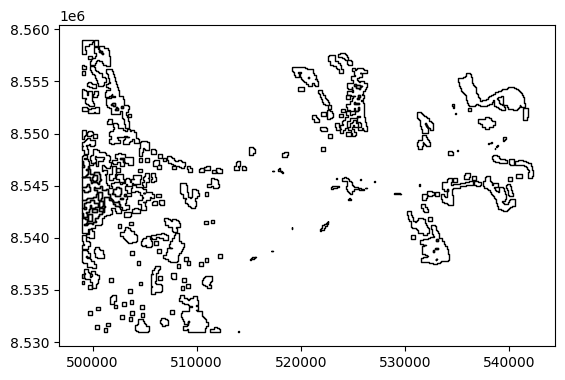

In [101]:
lrg.plot(edgecolor ='black', facecolor = 'None');

## Quadrants for Breen locations

In [ ]:
minx, miny, maxx, maxy = lrg.total_bounds

print(f"Min X: {minx}, Min Y: {miny}, Max X: {maxx}, Max Y: {maxy}")

In [137]:
min_x = 498000.0
min_y = 8530000.0
max_x = 543000.0 
max_y = 8560000.0 

In [20]:
brepollen = gdf[(530000 <= gdf['longitude']) & (gdf['longitude'] <= 541628.7) & (gdf['latitude'] >= 8.542e+06) & (gdf['latitude'] <= 8.558e+06)] #533500

In [21]:
samarinvagen = gdf[(529000 <= gdf['longitude']) & (gdf['longitude'] <= 533000) & (gdf['latitude'] <= 8.545e+06) & (gdf['latitude'] <= 8.558e+06)] # wtf? gdf[(530000 <= gdf['longitude']) & (gdf['longitude'] <= 534200) & (gdf['latitude'] <= 8.535e+06) & (gdf['latitude'] <= 8.544e+06)]

In [22]:
# samarinvagen = gdf[(530000 <= gdf['longitude']) & (gdf['longitude'] <= 534200) & (gdf['latitude'] <= 8.535e+06) & (gdf['latitude'] <= 8.544e+06)] #This is supposed to be the correct one. 

In [23]:
burgerbukta = gdf[(519000 <= gdf['longitude']) & (gdf['longitude'] <= 528000) & (gdf['latitude'] >= 8.549e+06) & (gdf['latitude'] <= 8.558e+06)]

In [24]:
isbjornhamna = gdf[(513300 <= gdf['longitude']) & (gdf['longitude'] <= 517000) & (gdf['latitude'] >= 8.5470e+06) & (gdf['latitude'] <= 8.550e+06)]

In [25]:
greenlandsea = gdf[(498900 <= gdf['longitude']) & (gdf['longitude'] <= 513300)]

In [26]:
hornsund_quadrant1 = gdf[(513300 <= gdf['longitude']) & (gdf['longitude'] <= 520000) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5470e+06)]

In [27]:
# hornsund_quadrant2 = gdf[(520000 <= gdf['longitude']) & (gdf['longitude'] <= 528000) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.549e+06)] #another wtf moment

In [28]:
hornsund_quadrant2 = gdf[(525000 <= gdf['longitude']) & (gdf['longitude'] <= 528000) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5490e+06)]

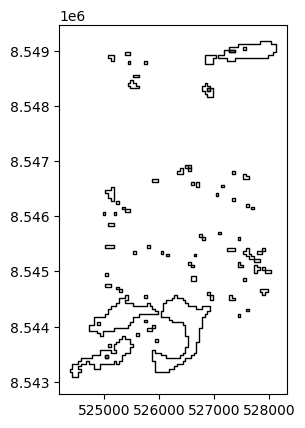

In [29]:
hornsund_quadrant2.plot(edgecolor ='black', facecolor = 'None');

In [151]:
hornsund_quadrant3 = gdf[(520000 <= gdf['longitude']) & (gdf['longitude'] <= 523400) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5440e+06)]

In [152]:
hornsund_quadrant4 = gdf[(528000 <= gdf['longitude']) & (gdf['longitude'] <= 530000) & (gdf['latitude'] >= 8.535e+06) & (gdf['latitude'] <= 8.550e+06)]

In [153]:
mainbasin = pd.concat([greenlandsea, hornsund_quadrant1, hornsund_quadrant2, hornsund_quadrant3, hornsund_quadrant4])

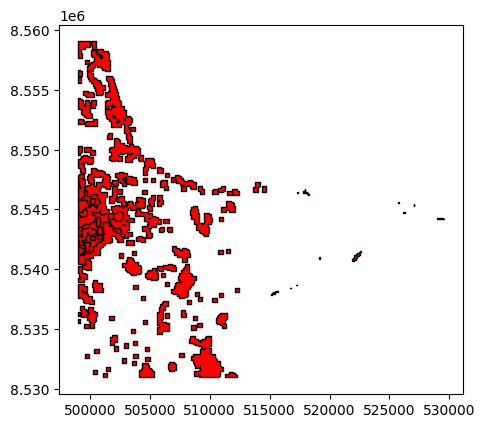

In [67]:
mainbasin.plot(edgecolor ='black', facecolor = 'red');

In [ ]:
# # Create a figure and axis
# fig, ax = plt.subplots()

# # Add polygons with different colors
# polygons = [greenlandsea, hornsund_quadrant1, hornsund_quadrant2, hornsund_quadrant3, hornsund_quadrant4]
# colors = ['red', 'blue', 'green','magenta','black']

# for poly, color in zip(polygons, colors):
#     # polygons.plot(poly, facecolor=color, edgecolor='black')
#     patch = Polygon(poly, facecolor=color, edgecolor='black')
#     ax.add_patch(patch)

C:\Users\jullian.williams\AppData\Local\Temp\ipykernel_6192\1230939648.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['Polygon 1', 'Polygon 2','Polygon 3', 'Polygon 4','Polygon 5'])


<Figure size 4000x4000 with 0 Axes>

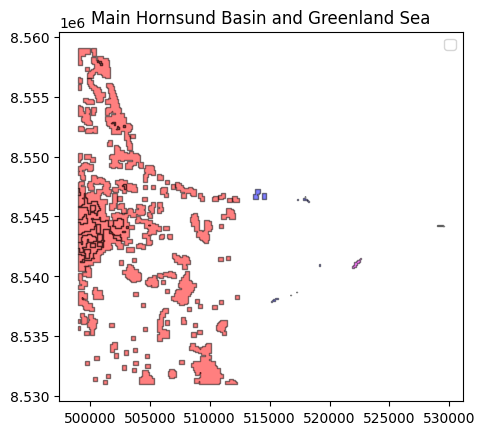

In [176]:
plt.figure(figsize=(40,40))
ax = greenlandsea.plot(color='red', edgecolor='black', alpha=0.5, label='Polygon 1')
hornsund_quadrant1.plot(ax=ax, color='blue', edgecolor='black', alpha=0.5, label='Polygon 2')
hornsund_quadrant2.plot(ax=ax, color='green', edgecolor='black', alpha=0.5, label='Polygon 3')
hornsund_quadrant3.plot(ax=ax, color='magenta', edgecolor='black', alpha=0.5, label='Polygon 4')
hornsund_quadrant4.plot(ax=ax, color='black', edgecolor='black', alpha=0.5, label='Polygon 5')

# Add legend and title
# plt.legend(['Polygon 1', 'Polygon 2','Polygon 3', 'Polygon 4','Polygon 5'])
plt.title('Main Hornsund Basin and Greenland Sea')
plt.show()

In [126]:
# Might need this again...
# # Step 1: Load the shapefile
# shapefile = gpd.read_file("path_to_shapefile.shp")

# # Step 2: Reproject shapefile to match raster CRS (if needed)
# target_crs = "EPSG:4326"  # Replace with your raster's CRS
# shapefile = shapefile.to_crs(target_crs)

# # Step 3: Define raster metadata (e.g., shape, transform)
# raster_shape = (100, 100)  # Replace with your ndarray shape
# raster_transform = rasterio.transform.from_bounds(-180, -90, 180, 90, *raster_shape)

# # Step 4: Rasterize the shapefile
# shapes = ((geom, 1) for geom in shapefile.geometry)
# aligned_array = rasterize(shapes, out_shape=raster_shape, transform=raster_transform, fill=0)

# # Step 5: Use the aligned array
# print(aligned_array)

In [ ]:
np.info(mainbasin)

In [164]:
print(mainbasin.crs)

EPSG:32633


In [ ]:
mk_ = mk_.rio.write_crs("EPSG:32633")

In [223]:
np.max(gdf['longitude']),np.min(gdf['longitude']),np.max(gdf['latitude']),np.min(gdf['latitude'])

(541628.6697247706, 499058.1081081081, 8558710.824742269, 8531000.0)

## Realign overlays for image stack and reclassing 

### Image array and polygon will be maligned. Look at this example - Need to warp image to polygon for it to rectify.

In [121]:
arr =  1*mk_
# Extract shapes (polygons) and values
results = (
    {"properties": {"value": value}, "geometry": shape(geom)}
    for geom, value in shapes(arr, transform=transform_))
#     if value != -50  # Exclude no-data or background values
# )

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)

In [122]:
gdf['area'] = gdf.geometry.area
gdf['perimeter'] = gdf.geometry.length
gdf['centroid'] = gdf.geometry.centroid
# Extract latitude and longitude from centroids
gdf['longitude'] = gdf.centroid.x
gdf['latitude'] = gdf.centroid.y

In [111]:
# Function to calculate orientation
def calculate_orientation(geometry):
    coords = np.array(geometry.exterior.coords)
    x = coords[:, 0]
    y = coords[:, 1]
    
    # Covariance matrix
    cov_matrix = np.cov(x, y)
    
    # Eigenvalues and eigenvectors
    eigvals, eigvecs = np.linalg.eig(cov_matrix)
    
    # Orientation angle (radians to degrees)
    largest_eigenvec = eigvecs[:, np.argmax(eigvals)]
    angle = np.arctan2(largest_eigenvec[1], largest_eigenvec[0])
    return np.degrees(angle)

# Function to calculate roundness
roundness = (4 * np.pi * gdf['area']) / (gdf['perimeter'] ** 2)

# Apply orientation calculation
gdf["orientation"] = gdf.geometry.apply(calculate_orientation)
gdf["roundness"] = roundness
gdf.set_crs(epsg=32633, inplace=True)

# Display results
# print(gdf[["geometry", "centroid", "orientation","roundness"]])

,geometry,value,area,perimeter,centroid,longitude,latitude,orientation,roundness
0,"POLYGON ((500125 8559025, 500125 8558725, 5001...",1.0,242500.0,2100.0,POINT (500337.629 8558710.825),500337.628866,8.558711e+06,-78.574026,0.691008
1,"POLYGON ((498975 8559025, 498975 8557675, 4993...",1.0,802500.0,4900.0,POINT (499359.969 8558534.112),499359.968847,8.558534e+06,-122.299313,0.420013
2,"POLYGON ((500625 8558025, 500625 8557875, 5007...",0.0,57500.0,1400.0,POINT (500817.391 8557865.217),500817.391304,8.557865e+06,-45.000000,0.368656
3,"POLYGON ((523925 8557775, 523925 8557725, 5237...",1.0,672500.0,5100.0,POINT (524272.677 8557253.717),524272.676580,8.557254e+06,-47.463334,0.324909
4,"POLYGON ((500675 8558425, 500675 8558375, 5006...",1.0,2512500.0,12100.0,POINT (500806.915 8557422.289),500806.915423,8.557422e+06,-130.308567,0.215648
...,...,...,...,...,...,...,...,...,...
210,"POLYGON ((508425 8534475, 508425 8534425, 5083...",1.0,5670000.0,18200.0,POINT (509668.298 8532477.403),509668.298060,8.532477e+06,-63.754881,0.215105
211,"POLYGON ((501075 8531325, 501075 8530975, 5014...",1.0,122500.0,1400.0,POINT (501250 8531150),501250.000000,8.531150e+06,-45.000000,0.785398
212,"POLYGON ((511625 8531425, 511625 8531275, 5112...",1.0,355000.0,2900.0,POINT (511776.408 8531161.268),511776.408451,8.531161e+06,-2.039139,0.530447
213,"POLYGON ((500025 8559025, 500025 8558775, 4999...",0.0,950765000.0,1022600.0,POINT (522354.775 8544968.968),522354.774971,8.544969e+06,14.456330,0.011425


In [112]:
#Figure this out. Will have to reset the gdf when you change the shift amount
# Define the shift values
x_shift = -1700  # Shift in X direction
y_shift = -200  # Shift in Y direction

# Apply the shift to all geometries
gdf["geometry"] = gdf["geometry"].apply(lambda geom: translate(geom, xoff=x_shift, yoff=y_shift))

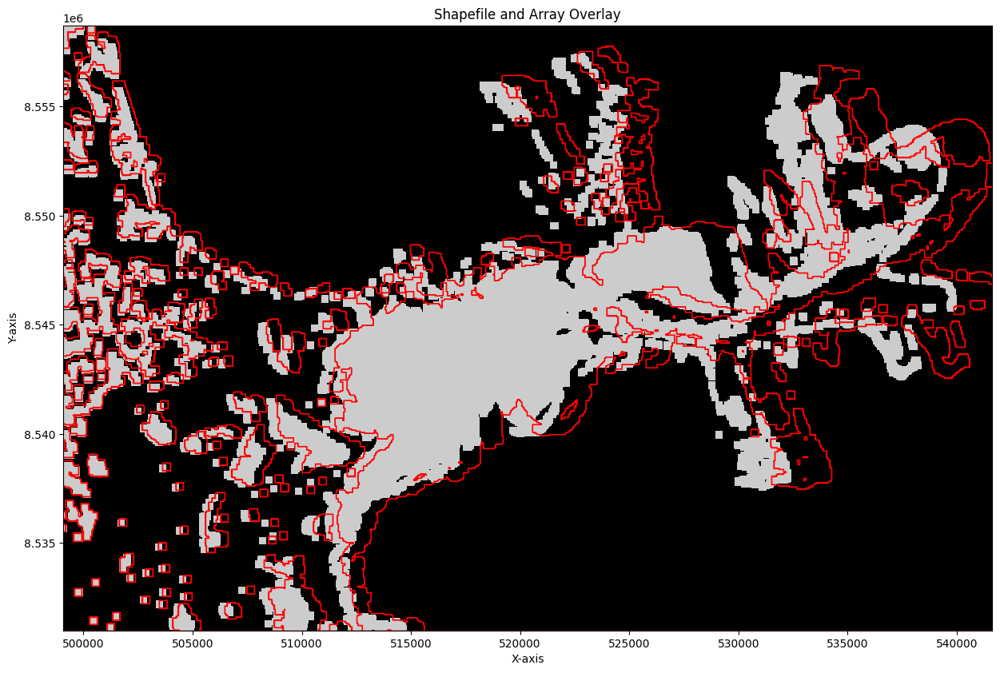

In [123]:
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(arr,  interpolation='nearest', cmap=plt.cm.nipy_spectral, origin='upper',extent=[min(gdf['longitude']), max(gdf['longitude']), min(gdf['latitude']), max(gdf['latitude'])])  # Plot array
gdf.plot(ax=ax, edgecolor="red", facecolor="none")  # Overlay shapefile

ax.set_xlim([499058.1081081081, 541628.6697247706]) 
ax.set_ylim([8531000.0, 8558710.824742269]) 
plt.title("Shapefile and Array Overlay")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.show()

## Convert the SVM image to vector to overlay

In [70]:
np.max(class_image), np.min(class_image)

(4, 1)

In [3]:
class_gdf = class_image
# Extract shapes (polygons) and values
results = (
    {"properties": {"value": value}, "geometry": shape(geom)}
    for geom, value in shapes(class_gdf, transform=transform_))
#     if value != -50  # Exclude no-data or background values
# )

# Convert to GeoDataFrame
class_gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)

In [4]:
class_gdf['area'] = class_gdf.geometry.area
class_gdf['perimeter'] = class_gdf.geometry.length
class_gdf['centroid'] = class_gdf.geometry.centroid
# Extract latitude and longitude from centroids
class_gdf['longitude'] = class_gdf.centroid.x
class_gdf['latitude'] = class_gdf.centroid.y
class_gdf.set_crs(epsg=32633, inplace=True)

,geometry,value,area,perimeter,centroid,longitude,latitude
0,"POLYGON ((498975 8559025, 498975 8558975, 4990...",4.0,2500.0,200.0,POINT (499000 8559000),499000.000000,8.559000e+06
1,"POLYGON ((500325 8559025, 500325 8558975, 5003...",4.0,2500.0,200.0,POINT (500350 8559000),500350.000000,8.559000e+06
2,"POLYGON ((499375 8559025, 499375 8558975, 4994...",4.0,22500.0,700.0,POINT (499511.111 8558977.778),499511.111111,8.558978e+06
3,"POLYGON ((499675 8559025, 499675 8558975, 4997...",4.0,17500.0,700.0,POINT (499785.714 8558964.286),499785.714286,8.558964e+06
4,"POLYGON ((499125 8558925, 499125 8558875, 4992...",4.0,5000.0,300.0,POINT (499175 8558900),499175.000000,8.558900e+06
...,...,...,...,...,...,...,...
4983,"POLYGON ((514625 8531025, 514625 8530975, 5146...",3.0,2500.0,200.0,POINT (514650 8531000),514650.000000,8.531000e+06
4984,"POLYGON ((514825 8531075, 514825 8531025, 5147...",2.0,22500.0,800.0,POINT (514916.667 8531016.667),514916.666667,8.531017e+06
4985,"POLYGON ((515275 8531025, 515275 8530975, 5153...",3.0,2500.0,200.0,POINT (515300 8531000),515300.000000,8.531000e+06
4986,"POLYGON ((515325 8531025, 515325 8530975, 5154...",4.0,5000.0,300.0,POINT (515375 8531000),515375.000000,8.531000e+06


In [5]:
# Function to calculate orientation
def calculate_orientation(geometry):
    coords = np.array(geometry.exterior.coords)
    x = coords[:, 0]
    y = coords[:, 1]
    
    # Covariance matrix
    cov_matrix = np.cov(x, y)
    
    # Eigenvalues and eigenvectors
    eigvals, eigvecs = np.linalg.eig(cov_matrix)
    
    # Orientation angle (radians to degrees)
    largest_eigenvec = eigvecs[:, np.argmax(eigvals)]
    angle = np.arctan2(largest_eigenvec[1], largest_eigenvec[0])
    return np.degrees(angle)

# Function to calculate roundness
roundness = (4 * np.pi * class_gdf['area']) / (class_gdf['perimeter'] ** 2)

# Apply orientation calculation
class_gdf["orientation"] = class_gdf.geometry.apply(calculate_orientation)
class_gdf["roundness"] = roundness
class_gdf.set_crs(epsg=32633, inplace=True)

# Display results
# print(gdf[["geometry", "centroid", "orientation","roundness"]])

,geometry,value,area,perimeter,centroid,longitude,latitude,orientation,roundness
0,"POLYGON ((498975 8559025, 498975 8558975, 4990...",4.0,2500.0,200.0,POINT (499000 8559000),499000.000000,8.559000e+06,-45.000000,0.785398
1,"POLYGON ((500325 8559025, 500325 8558975, 5003...",4.0,2500.0,200.0,POINT (500350 8559000),500350.000000,8.559000e+06,-45.000000,0.785398
2,"POLYGON ((499375 8559025, 499375 8558975, 4994...",4.0,22500.0,700.0,POINT (499511.111 8558977.778),499511.111111,8.558978e+06,-5.773345,0.577027
3,"POLYGON ((499675 8559025, 499675 8558975, 4997...",4.0,17500.0,700.0,POINT (499785.714 8558964.286),499785.714286,8.558964e+06,-26.243694,0.448799
4,"POLYGON ((499125 8558925, 499125 8558875, 4992...",4.0,5000.0,300.0,POINT (499175 8558900),499175.000000,8.558900e+06,-6.264404,0.698132
...,...,...,...,...,...,...,...,...,...
4983,"POLYGON ((514625 8531025, 514625 8530975, 5146...",3.0,2500.0,200.0,POINT (514650 8531000),514650.000000,8.531000e+06,-45.000000,0.785398
4984,"POLYGON ((514825 8531075, 514825 8531025, 5147...",2.0,22500.0,800.0,POINT (514916.667 8531016.667),514916.666667,8.531017e+06,-3.363442,0.441786
4985,"POLYGON ((515275 8531025, 515275 8530975, 5153...",3.0,2500.0,200.0,POINT (515300 8531000),515300.000000,8.531000e+06,-45.000000,0.785398
4986,"POLYGON ((515325 8531025, 515325 8530975, 5154...",4.0,5000.0,300.0,POINT (515375 8531000),515375.000000,8.531000e+06,-6.264404,0.698132


In [178]:
np.max(class_gdf.value), np.min(class_gdf.value)

(4.0, 1.0)

<Axes: >

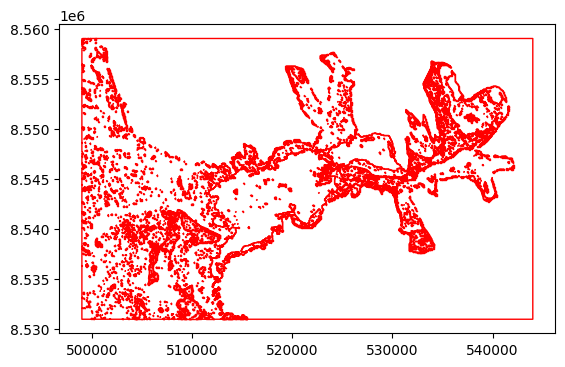

In [179]:
class_gdf.plot(edgecolor="red", facecolor="none") 

<Figure size 4000x4000 with 0 Axes>

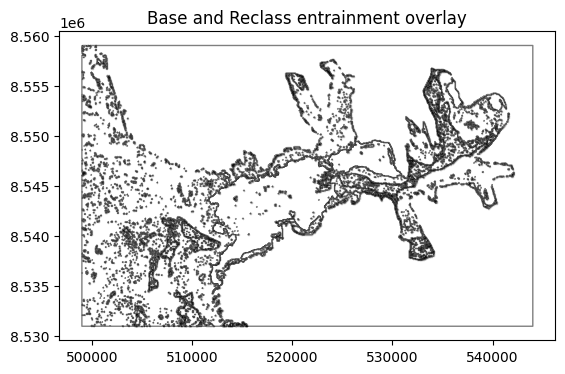

In [180]:
plt.figure(figsize=(40,40))
class_gdf.plot(color='white', edgecolor='black', alpha=0.5, label='Polygon 1')
gdf.plot(ax=ax, color='blue', edgecolor='black', label='Polygon 2')

# Add legend and title
# plt.legend(['Base', 'Overlay'])
plt.title('Base and Reclass entrainment overlay')
plt.show()

In [83]:
from rasterio.crs import CRS

In [ ]:
transform = transform_  # (top-left x, top-left y, pixel width, pixel height)

# Define the CRS (e.g., WGS84)
crs = CRS.from_epsg(32633)

In [ ]:
with rio.open(
    "output.tif",
    "w",
    driver="GTiff",
    height=data.shape[0],
    width=data.shape[1],
    count=1,
    dtype=data.dtype,
    crs=crs,
    transform=transform,
) as dst:
    dst.write(data, 1)


In [125]:
np.info(arr)

class:  ndarray
shape:  (561, 901)
strides:  (3604, 4)
itemsize:  4
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x1e4aca0f040
byteorder:  little
byteswap:  False
type: int32


In [94]:
geometry_array = np.array([geom.coords[0] for geom in mainbasin['centroid']])
# print(geometry_array)

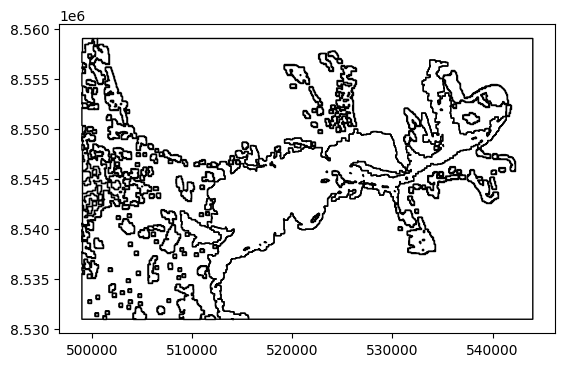

In [87]:
gdf.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
greenlandsea.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
hornsund_quadrant1.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
hornsund_quadrant2.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
hornsund_quadrant3.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
hornsund_quadrant4.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
brepollen.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
samarinvagen.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
burgerbukta.plot(edgecolor ='black', facecolor = 'None');

In [ ]:
isbjornhamna.plot(edgecolor ='black', facecolor = 'None');

In [178]:
N_gdf = gdf[(525000 <= gdf['longitude']) & (gdf['longitude'] <= 541628.7)] #522990

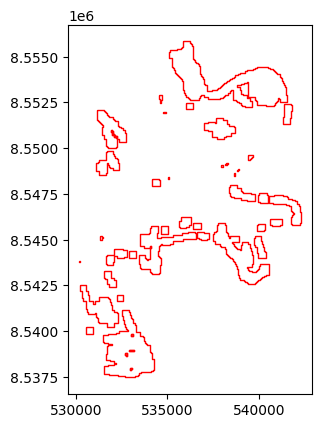

In [206]:
N_gdf.plot(edgecolor ='red', facecolor = 'None');

In [233]:
S_gdf = gdf[(490000 <= gdf['longitude']) & (gdf['longitude'] <= 510000)]

(8530975.0, 8559025.0)

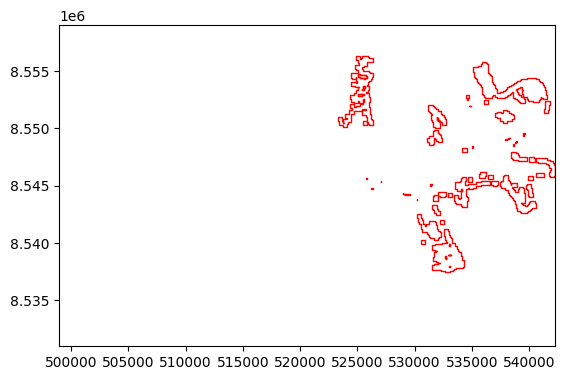

In [29]:
# Plot the GeoDataFrame
ax = N_gdf.plot(edgecolor ='red', facecolor = 'None')

# Set axis limits (adjust values as needed)
ax.set_xlim([minx, maxx])  # Replace with your desired x-axis range
ax.set_ylim([miny, maxy]) 

In [213]:
# LN_gdf = N_gdf[(-140 <= N_gdf['orientation']) & (N_gdf['orientation'] <= -10)]

In [316]:
RD_gdf = thicc[(520000 <= thicc['longitude']) & (thicc['longitude'] <= 541628.7)] #522990

(8530975.0, 8559025.0)

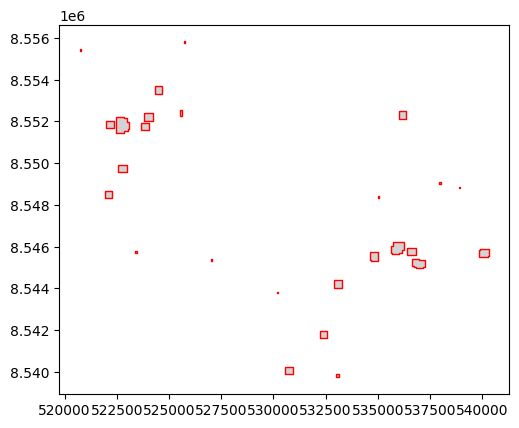

In [237]:
RD_gdf.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')
ax.set_xlim([minx, maxx])  # Replace with your desired x-axis range
ax.set_ylim([miny, maxy])

In [309]:
SK_gdf = lent[(520000 <= lent['longitude']) & (lent['longitude'] <= 541628.7)] #522990

(8530975.0, 8559025.0)

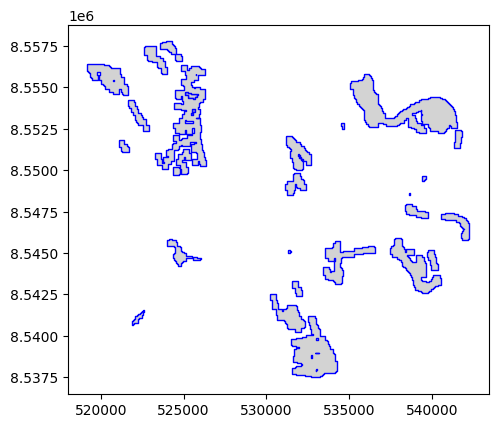

In [310]:
SK_gdf.plot(edgecolor ='blue', linestyle='-', facecolor = 'lightgray')
ax.set_xlim([minx, maxx])  # Replace with your desired x-axis range
ax.set_ylim([miny, maxy])

C:\Users\jullian.williams\AppData\Local\Temp\ipykernel_11992\20663998.py:6: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['Polygon 1', 'Polygon 2'])


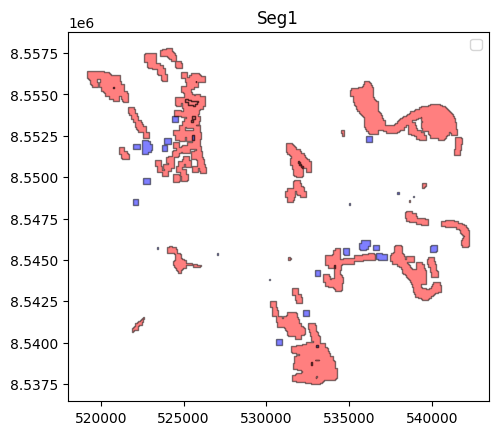

In [260]:
# Plot both polygons
ax = RD_gdf.plot(color='blue', edgecolor='black', alpha=0.5, label='Polygon 1')
SK_gdf.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Polygon 2')

# Add legend and title
plt.legend(['Polygon 1', 'Polygon 2'])
plt.title('Seg1')
plt.show()

### Quadrant slice to shapes

In [ ]:
RD_gdf = N_gdf[(520000 <= N_gdf['longitude']) & (N_gdf['longitude'] <= 541628.7) & (gdf['area'] >= 50000)] #522990
SK_gdf = lent[(520000 <= lent['longitude']) & (lent['longitude'] <= 541628.7) & (gdf['area'] >= 50000)] #522990

In [ ]:
# Plot both polygons
ax = RD_gdf.plot(color='blue', edgecolor='black', alpha=0.5, label='Polygon 1')
SK_gdf.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Polygon 2')

# Add legend and title
plt.legend(['Polygon 1', 'Polygon 2'])
plt.title('Seg1')
plt.tight_layout()
plt.show()

In [33]:
brepollen = gdf[(530000 <= gdf['longitude']) & (gdf['longitude'] <= 541628.7) & (gdf['latitude'] >= 8.542e+06) & (gdf['latitude'] <= 8.558e+06)] #533500

In [34]:
samarinvagen = gdf[(529000 <= gdf['longitude']) & (gdf['longitude'] <= 533000) & (gdf['latitude'] <= 8.545e+06) & (gdf['latitude'] <= 8.558e+06)]

In [35]:
burgerbukta = gdf[(519000 <= gdf['longitude']) & (gdf['longitude'] <= 528000) & (gdf['latitude'] >= 8.549e+06) & (gdf['latitude'] <= 8.558e+06)]

In [36]:
isbjornhamna = gdf[(513300 <= gdf['longitude']) & (gdf['longitude'] <= 517000) & (gdf['latitude'] >= 8.5470e+06) & (gdf['latitude'] <= 8.550e+06)]

In [37]:
greenlandsea = gdf[(498900 <= gdf['longitude']) & (gdf['longitude'] <= 513300)]
hornsund_quadrant1 = gdf[(513300 <= gdf['longitude']) & (gdf['longitude'] <= 520000) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5470e+06)]
hornsund_quadrant2 = gdf[(525000 <= gdf['longitude']) & (gdf['longitude'] <= 528000) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5490e+06)]
hornsund_quadrant3 = gdf[(520000 <= gdf['longitude']) & (gdf['longitude'] <= 523400) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5440e+06)]
hornsund_quadrant4 = gdf[(528000 <= gdf['longitude']) & (gdf['longitude'] <= 530000) & (gdf['latitude'] >= 8.535e+06) & (gdf['latitude'] <= 8.550e+06)]
mainbasin = pd.concat([greenlandsea, hornsund_quadrant1, hornsund_quadrant2, hornsund_quadrant3, hornsund_quadrant4])

In [38]:
bpln_Nlent = brepollen[(-90 <= brepollen['orientation']) & (brepollen['orientation'] <= 0) & (brepollen['area'] >= 50000) & (brepollen['roundness'] <= 0.6)]
bpln_N_lent = brepollen[(0 <= brepollen['orientation']) & (brepollen['orientation'] <= 90) & (brepollen['area'] >= 50000) & (brepollen['roundness'] <= 0.6)]
bplnlent = pd.concat([bpln_Nlent, bpln_N_lent])

In [39]:
bpln_Nrd = brepollen[(-90 <= brepollen['orientation']) & (brepollen['orientation'] <= 0) & (brepollen['area'] >= 50000) & (brepollen['roundness'] >= 0.6)]
bpln_N_rd = brepollen[(0 <= brepollen['orientation']) & (brepollen['orientation'] <= 90) & (brepollen['area'] >= 50000) & (brepollen['roundness'] >= 0.6)]
bplnrd = pd.concat([bpln_Nrd, bpln_N_rd])

<Axes: >

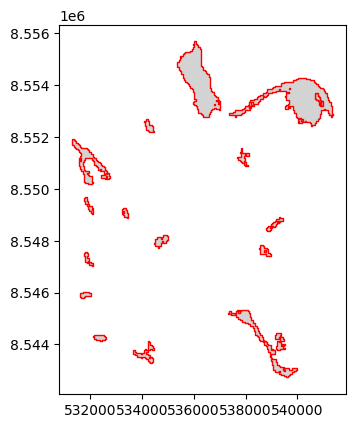

In [240]:
bplnlent.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [241]:
# bplnrd.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

<Axes: >

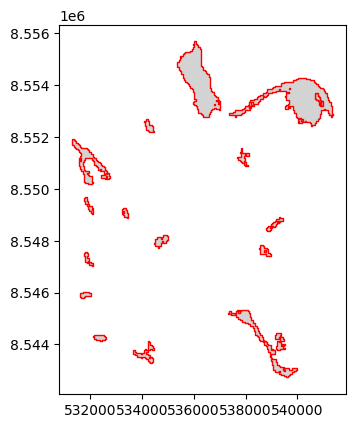

In [242]:
bpln_fjord = pd.concat([bplnlent, bplnrd])
bpln_fjord.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [243]:
# samar_Nlent = samarinvagen[(-40 <= samarinvagen['orientation']) & (samarinvagen['orientation'] <= 0) & (samarinvagen['area'] >= 50000) & (samarinvagen['roundness'] <= 0.6)]
# samar_N_lent = samarinvagen[(-90 <= samarinvagen['orientation']) & (samarinvagen['orientation'] <= -70) & (samarinvagen['area'] >= 50000) & (samarinvagen['roundness'] <= 0.6)]
# samar = pd.concat([samar_Nlent, samar_N_lent])

In [40]:
samar_Nlent = samarinvagen[(-90 <= samarinvagen['orientation']) & (samarinvagen['orientation'] <= 0) & (samarinvagen['area'] >= 50000) & (samarinvagen['roundness'] <= 0.6)]
samar_N_lent = samarinvagen[(0 <= samarinvagen['orientation']) & (samarinvagen['orientation'] <= 90) & (samarinvagen['area'] >= 50000) & (samarinvagen['roundness'] <= 0.6)]
samarlent = pd.concat([samar_Nlent, samar_N_lent])

In [41]:
samar_Nrd = samarinvagen[(-90 <= samarinvagen['orientation']) & (samarinvagen['orientation'] <= 0) & (samarinvagen['area'] >= 50000) & (samarinvagen['roundness'] >= 0.4)]
samar_N_rd = samarinvagen[(0 <= samarinvagen['orientation']) & (samarinvagen['orientation'] <= 90) & (samarinvagen['area'] >= 50000) & (samarinvagen['roundness'] >= 0.4)]
samarrd = pd.concat([samar_Nrd, samar_N_rd])

In [42]:
samar_fjord = pd.concat([samarlent, samarrd])

<Axes: >

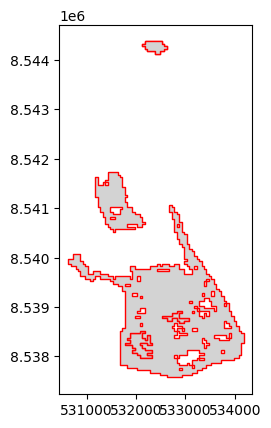

In [247]:
samar_fjord.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [43]:
burg_Nlent = burgerbukta[(-90 <= burgerbukta['orientation']) & (burgerbukta['orientation'] <= 0) & (burgerbukta['area'] >= 50000) & (burgerbukta['roundness'] <= 0.6)]
burg_N_lent = burgerbukta[(0 <= burgerbukta['orientation']) & (burgerbukta['orientation'] <= 90) & (burgerbukta['area'] >= 50000) & (burgerbukta['roundness'] <= 0.6)]
burglent = pd.concat([burg_Nlent, burg_N_lent])

In [44]:
burg_Nrd = burgerbukta[(-90 <= burgerbukta['orientation']) & (burgerbukta['orientation'] <= 0) & (burgerbukta['area'] >= 50000) & (burgerbukta['roundness'] >= 0.2)]
burg_N_rd = burgerbukta[(0 <= burgerbukta['orientation']) & (burgerbukta['orientation'] <= 90) & (burgerbukta['area'] >= 50000) & (burgerbukta['roundness'] >= 0.2)]
burgrd = pd.concat([burg_Nrd, burg_N_rd])

<Axes: >

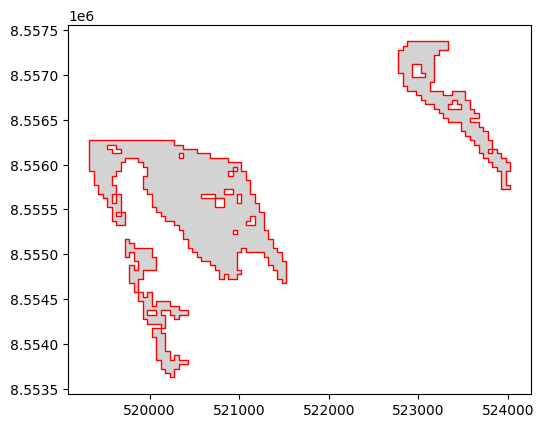

In [249]:
burglent.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

<Axes: >

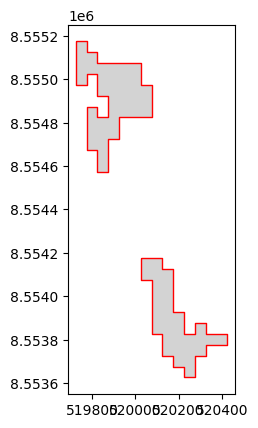

In [251]:
burgrd.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [45]:
burg_fjord = pd.concat([burglent, burgrd])

<Axes: >

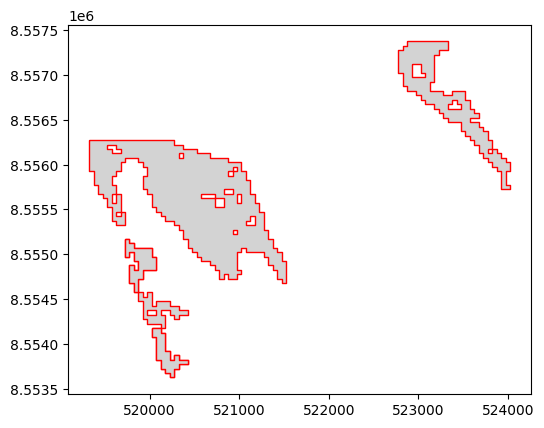

In [253]:
burg_fjord.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [46]:
isbj_Nlent = isbjornhamna[(-90 <= isbjornhamna['orientation']) & (isbjornhamna['orientation'] <= 0) & (isbjornhamna['area'] >= 50000) & (isbjornhamna['roundness'] <= 0.6)]
isbj_N_lent = isbjornhamna[(0 <= isbjornhamna['orientation']) & (isbjornhamna['orientation'] <= 90) & (isbjornhamna['area'] >= 50000) & (isbjornhamna['roundness'] <= 0.6)]
isbjlent = pd.concat([isbj_Nlent, isbj_N_lent])

In [47]:
isbj_Nrd = isbjornhamna[(-90 <= isbjornhamna['orientation']) & (isbjornhamna['orientation'] <= 0) & (isbjornhamna['area'] >= 50000) & (isbjornhamna['roundness'] >= 0.6)]
isbj_N_rd = isbjornhamna[(0 <= isbjornhamna['orientation']) & (isbjornhamna['orientation'] <= 90) & (isbjornhamna['area'] >= 50000) & (isbjornhamna['roundness'] >= 0.6)]
isbjrd = pd.concat([isbj_Nrd, isbj_N_rd])

In [126]:
isbj_fjord = pd.concat([isbjlent,isbjrd])

In [ ]:
isbjlent.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [ ]:
# Plot polygons
ax = bplnlent.plot(color='blue', edgecolor='black', alpha=0.5, label='Polygon 1')
bplnrd.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Polygon 2')
samarlent.plot(ax=ax, color='blue', edgecolor='black', alpha=0.5, label='Polygon 3')
samarrd.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Polygon 4')
burglent.plot(ax=ax, color='blue', edgecolor='black', alpha=0.5, label='Polygon 5')
burgrd.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Polygon 6')
isbjlent.plot(ax=ax, color='blue', edgecolor='black', alpha=0.5, label='Polygon 7')
isbjrd.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Polygon 8')
mainbasin.plot(ax=ax, color='magenta', edgecolor='black', alpha=0.5, label='Polygon 9')
class_gdf.plot(ax=ax, color='orange', edgecolor='black', alpha=0.5, label='Polygon 10')

# Add legend and title
plt.legend(['Polygon 1', 'Polygon 2', 'Polygon 3', 'Polygon 4', 'Polygon 5', 'Polygon 6', 'Polygon 7', 'Polygon 8', 'Polygon 9'])
plt.title('Seg1')
plt.tight_layout()
plt.show()

In [ ]:
bplnlent

In [49]:
from functools import reduce

In [57]:
gdfs = [bplnlent,bplnrd,samarlent,samarrd,burglent,burgrd,isbjlent,isbjrd,mainbasin]

# Merge all GeoDataFrames on a common column
merged_gdf = reduce(lambda left, right: left.merge(right, how='outer'), gdfs) # on='id',

<Axes: >

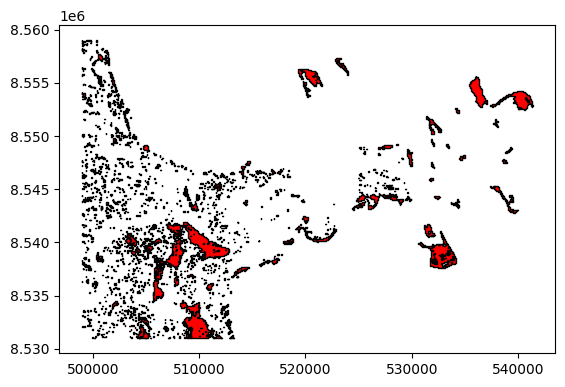

In [58]:
merged_gdf.plot(color='red', edgecolor='black')

In [65]:
clusterk= pd.concat([bplnlent,bplnrd,samarlent,samarrd,burglent,burgrd,isbjlent,isbjrd,mainbasin], keys=['bplnlent','bplnrd','samarlent','samarrd','burglent','burgrd','isbjlent','isbjrd','mainbasin']).reset_index(level=0).rename(columns={'level_0': 'Source'})

In [ ]:
print(np.info(merged_gdf))

In [59]:
# merged_gdf = merged_gdf.GeoDataFrame({"geometry": geometry, "value": value})
# Save to a vector file (e.g., GeoJSON or Shapefile)
merged_gdf.to_parquet("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/wvr.shp")

In [116]:
clusterk.to_parquet("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/wvr.shp")

In [ ]:
# # Perform the subtraction (difference)
# gdf_ = gdf['geometry'] = gdf.geometry.apply(
#     lambda geom: geom.difference(clusterk.unary_union) 
# )

# difference_data = gdf.copy()
# difference_data['geometry'] = gdf.geometry.difference(clusterk.geometry.union_all())

In [110]:
# np.max(difference_data['value'])

In [61]:
overlay = gdf[(gdf['area']<= 1000000000)]

In [59]:
overlay = gdf[(gdf['area']>= 100000000)] 

<Axes: >

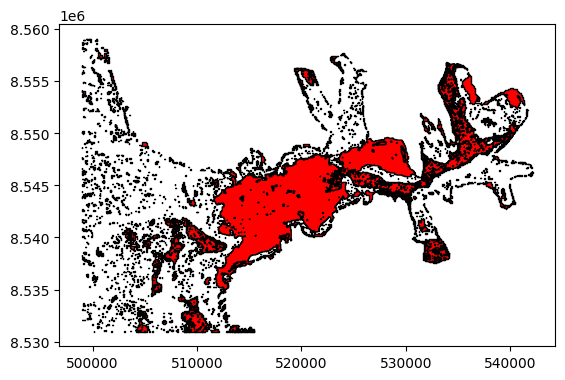

In [62]:
overlay.plot(color='red', edgecolor='black')

In [56]:
clusterk = pd.concat([overlay,bplnlent,bplnrd,samarlent,samarrd,burglent,burgrd,isbjlent,isbjrd,mainbasin], keys=['overlay','bplnlent','bplnrd','samarlent','samarrd','burglent','burgrd','isbjlent','isbjrd','mainbasin']).reset_index(level=0).rename(columns={'level_0': 'Source'})

In [57]:
mass = clusterk[(clusterk['area'] >= 10000)]

<Axes: >

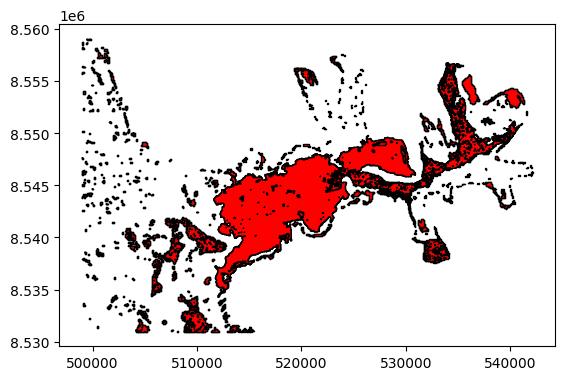

In [58]:
mass.plot(color='red', edgecolor='black')

In [151]:
mass.to_parquet("C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/wvr2.shp")

In [ ]:
clusterk= pd.concat([overlay,bpln_fjord,samar_fjord,burg_fjord,isbj_fjord,mainbasin], keys=['overlay','bpln_fjord','samar_fjord','burg_fjord','isbj_fjord','mainbasin']).reset_index(level=0).rename(columns={'level_0': 'Source'})

In [195]:
tsl_fp = 'C:/Users/jullian.williams/Desktop/HIRLOMAP/hornsund_zmail/vector/2012.shp'
tsl_shp = gpd.read_file(tsl_fp)

In [196]:
# Load the polygon layer (GeoDataFrame)
polygons = clusterk

# Load the clipping boundary (GeoDataFrame)
clip_boundary = tsl_shp

# Perform the clipping
clipped = gpd.clip(polygons, clip_boundary)

<Axes: >

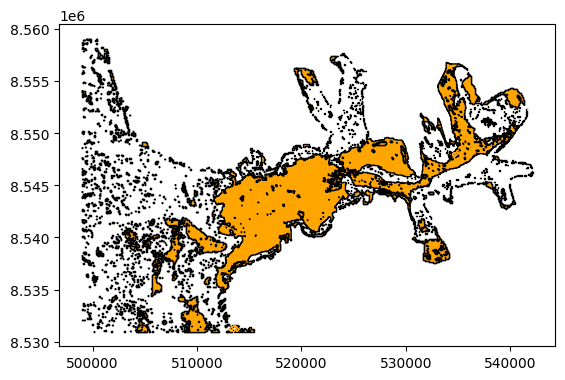

In [197]:
clipped.plot(color='orange', edgecolor='black')

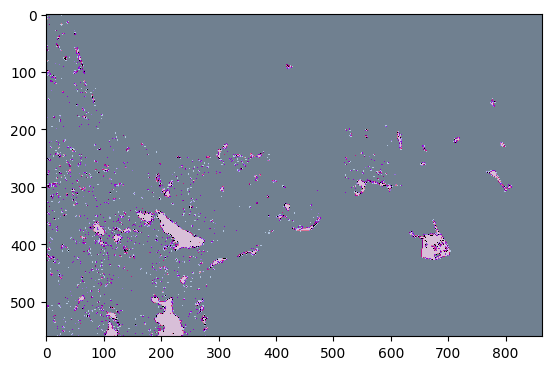

In [115]:
bounds = clusterk.total_bounds
resolution = 50  # Define resolution (e.g., 50x50 units per pixel)
width = int((bounds[2] - bounds[0]) / resolution)
height = int((bounds[3] - bounds[1]) / resolution)
transform = rio.transform.from_bounds(*bounds, width, height)

# Define class colors (e.g., mapping vector attributes to raster values)
class_colors = {
    # 'overlay': 1,
    # 'bplnrd': 2,
    # 'samarlent': 3,
    # 'samarrd': 4,
    # 'burglent': 5,
    # 'burgrd': 6,
    # 'isbjlent': 7,
    # 'isbjrd': 8,
    # 'mainbasin': 9,
    # 'bplnlent': 10,

    'overlay': 'black',
    'bplnlent': 'slategrey',
    'bplnrd': 'lightsteelblue',
    'samarlent': 'blueviolet',
    'samarrd': 'thistle',
    'burglent': 'darkviolet',
    'burgrd': 'mediumpurple',
    'isbjlent': 'darkmagenta',
    'isbjrd': 'mediumvioletred',
    'mainbasin': 'palevioletred',
}
# Prepare shapes and values for rasterization
shapes = [(geom, class_colors[attr]) for geom, attr in zip(clusterk.geometry, clusterk['Source'])]

# Rasterize vector data
rasterized = rasterize(
    shapes=shapes,
    out_shape=(height, width),
    transform=transform,
    fill=0,  # Background value
    dtype="uint8"
)
# plt.imshow(rasterized)

# with rio.open(
#     "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/whatever2.tiff",
#     "w",
#     driver="GTiff",
#     height=height,
#     width=width,
#     count=1,
#     dtype=rasterized.dtype,
#     crs= src_.crs,
#     transform=transform,
# ) as dst:
#     dst.write(rasterized, 1)

# Plot the raster
plt.imshow(rasterized, cmap=plt.matplotlib.colors.ListedColormap([class_colors[val] for val in sorted(class_colors)]))
# plt.colorbar()
plt.show()
#Why am I getting a different outcome everytime if I just keep re-running it????????

In [200]:
print(np.info(rasterized))

class:  ndarray
shape:  (561, 864)
strides:  (864, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x138a6cf0020
byteorder:  little
byteswap:  False
type: uint8
None


In [65]:
print(transform_), print(height), print(width), print(src_.crs)

| 50.00, 0.00, 498975.00|
| 0.00,-50.00, 8559025.00|
| 0.00, 0.00, 1.00|
2805
4320
PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


(None, None, None, None)

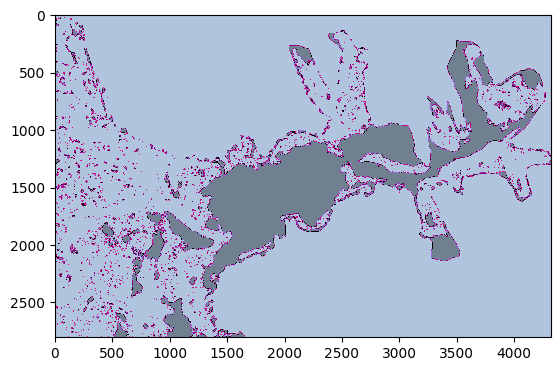

In [183]:
bounds = clipped.total_bounds
resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
width = int((bounds[2] - bounds[0]) / resolution)
height = int((bounds[3] - bounds[1]) / resolution)
transform = rio.transform.from_bounds(*bounds, width, height)

# Define class colors (e.g., mapping vector attributes to raster values)
# If 'bpln_fjord' clearly plots then why does it plot the background as 'bpln_fjord' in black?
# And making something else the first entry doesn't resolve it. SO why do these things happen?
class_colors = {
    'overlay': 'black',
    'bpln_fjord': 'slategrey',
    'samar_fjord': 'lightsteelblue',
    'burg_fjord': 'mediumpurple',
    'isbj_fjord': 'darkmagenta',
    'mainbasin': 'mediumvioletred',
    'gdf': 'black',
}
# Prepare shapes and values for rasterization
shapes = [(geom, class_colors[attr]) for geom, attr in zip(clipped.geometry, clipped['Source'])]

# Rasterize vector data
rasterized = rasterize(
    shapes=shapes,
    out_shape=(height, width),
    transform=transform,
    fill=-999,  # Background value
    dtype="uint8"
)
# plt.imshow(rasterized)

# Plot the raster
plt.imshow(rasterized, cmap=plt.matplotlib.colors.ListedColormap([class_colors[val] for val in sorted(class_colors)]))
# plt.colorbar()
plt.show()

In [115]:
    # 'bplnlent': 'red',
    # 'bplnrd': 'blue',
    # 'samarlent': 'red',
    # 'samarrd': 'blue',
    # 'burglent': 'red',
    # 'burgrd': 'blue',
    # 'isbjlent': 'red',
    # 'isbjrd': 'blue',
    # 'mainbasin': 'black',
    # 'overlay': 'black',

    # 'bplnlent': 1,
    # 'bplnrd': 2,
    # 'samarlent': 3,
    # 'samarrd': 4,
    # 'burglent': 5,
    # 'burgrd': 6,
    # 'isbjlent': 7,
    # 'isbjrd': 8,
    # 'mainbasin': 9,
    # 'overlay': 10,

In [ ]:
    # 'bpln_fjord': 'slategrey',
    # 'samar_fjord': 'lightsteelblue',
    # 'burg_fjord': 'mediumpurple',
    # 'isbj_fjord': 'darkmagenta',
    # 'mainbasin': 'mediumvioletred',
    # 'overlay': 'black',

    # 'bplnlent': 'slategrey',
    # 'bplnrd': 'lightsteelblue',
    # 'samarlent': 'blueviolet',
    # 'samarrd': 'thistle',
    # 'burglent': 'darkviolet',
    # 'burgrd': 'mediumpurple',
    # 'isbjlent': 'darkmagenta',
    # 'isbjrd': 'mediumvioletred',
    # 'mainbasin': 'palevioletred',
    # 'overlay': 'black',

In [259]:
samar_fjord['geometry'] = samar_fjord['geometry'].simplify(tolerance=100.0, preserve_topology=False)

<Axes: >

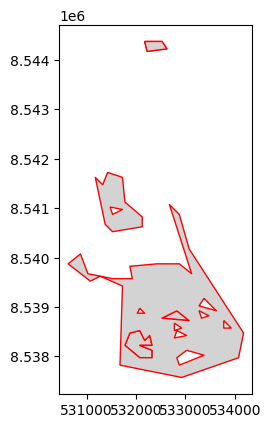

In [101]:
samar_fjord.plot(edgecolor ='red', linestyle='-', facecolor = 'lightgray')

In [311]:
T_gdf = pd.concat([SK_gdf, RD_gdf], keys=['SK_gdf', 'RD_gdf']).reset_index(level=0).rename(columns={'level_0': 'Source'})

In [ ]:
print(T_gdf)

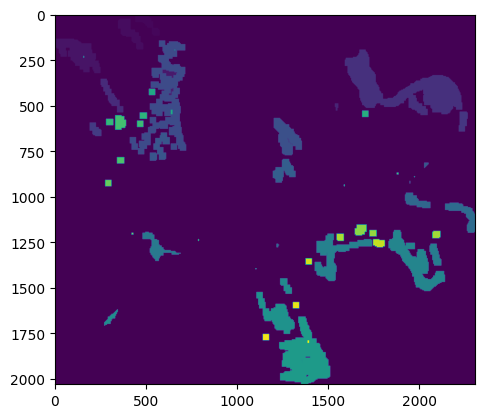

In [295]:
bounds = T_gdf.total_bounds  # [minx, miny, maxx, maxy]
resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
width = int((bounds[2] - bounds[0]) / resolution)
height = int((bounds[3] - bounds[1]) / resolution)
transform = rio.transform.from_bounds(*bounds, width, height)

# Assign unique IDs or colors to each feature
T_gdf["unique_color"] = range(1, len(T_gdf["Source"]) + 1)

# Prepare shapes and values for rasterization
shapes = [(geom, value) for geom, value in zip(T_gdf.geometry, T_gdf["unique_color"])]

# Rasterize the vector data
raster = rasterize(
    shapes=shapes,
    out_shape=(height, width),
    transform=transform,
    fill=0,  # Background value
    dtype="uint8"
)
plt.imshow(raster)

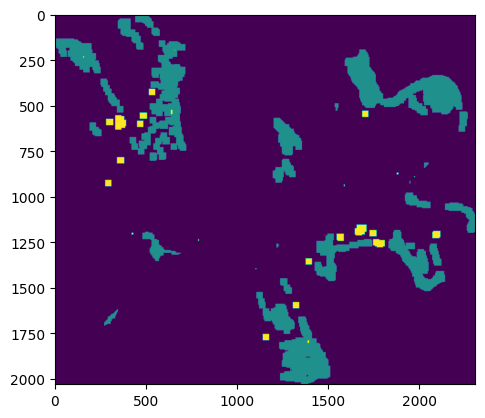

In [315]:
resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
width = int((bounds[2] - bounds[0]) / resolution)
height = int((bounds[3] - bounds[1]) / resolution)
transform = rio.transform.from_bounds(*bounds, width, height)

# Define class colors (e.g., mapping vector attributes to raster values)
class_colors = {
    'SK_gdf': 1,  # Class 1 -> Value 1
    'RD_gdf': 2,  # Class 2 -> Value 2
}

# Prepare shapes and values for rasterization
shapes = [(geom, class_colors[attr]) for geom, attr in zip(T_gdf.geometry, T_gdf['Source'])]

# Rasterize vector data
rasterized = rasterize(
    shapes=shapes,
    out_shape=(height, width),
    transform=transform,
    fill=0,  # Background value
    dtype="uint8"
)
plt.imshow(rasterized)

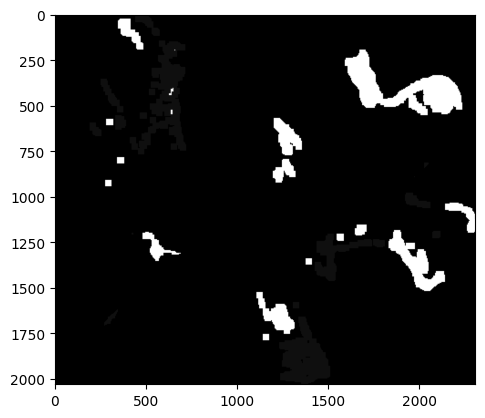

In [306]:
bounds = T_gdf.total_bounds  # [minx, miny, maxx, maxy]
resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
width = int((bounds[2] - bounds[0]) / resolution)
height = int((bounds[3] - bounds[1]) / resolution)
transform = rio.transform.from_bounds(*bounds, width, height)

# Rasterize the GeoDataFrame
shapes = ((geom, value) for geom, value in zip(T_gdf.geometry, T_gdf["Source"]))
raster_array = rasterize(shapes, out_shape=(height, width), transform=transform, fill=0, dtype="int32")

plt.imshow(raster_array, cmap=plt.cm.gray)

(8530975.0, 8559025.0)

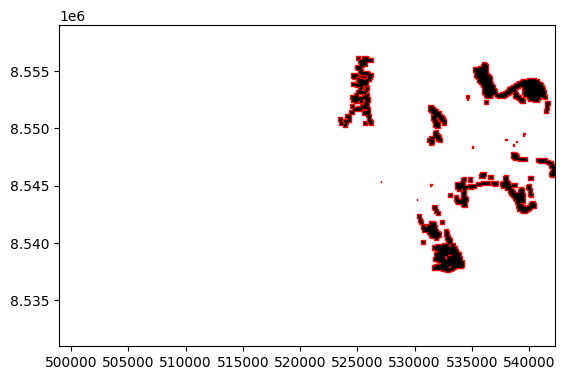

In [304]:
# Plot the GeoDataFrame
ax = LN_gdf.plot(edgecolor ='red', linestyle='-', facecolor = 'black')

# Set axis limits (adjust values as needed)
ax.set_xlim([minx, maxx])  # Replace with your desired x-axis range
ax.set_ylim([miny, maxy]) 

(8530000.0, 8560000.0)

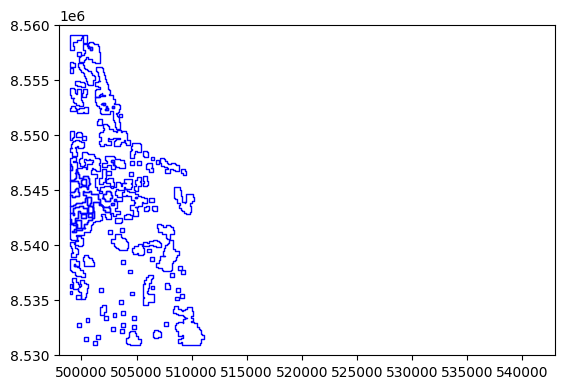

In [138]:
# Plot the GeoDataFrame
ax = S_gdf.plot(edgecolor ='blue', facecolor = 'None')

# Set axis limits (adjust values as needed)
ax.set_xlim([min_x, max_x])  # Replace with your desired x-axis range
ax.set_ylim([min_y, max_y]) 

In [30]:
T_gdf = pd.concat([N_gdf, S_gdf])

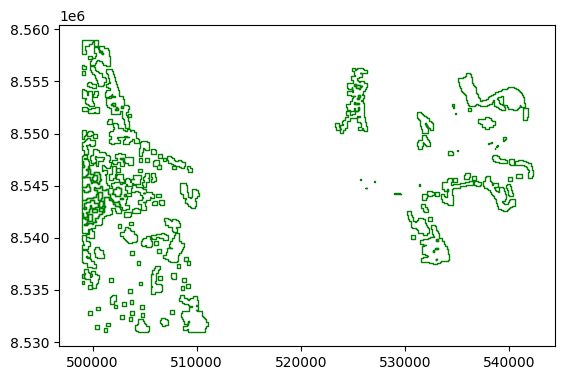

In [31]:
T_gdf.plot(edgecolor ='green', facecolor = 'None');

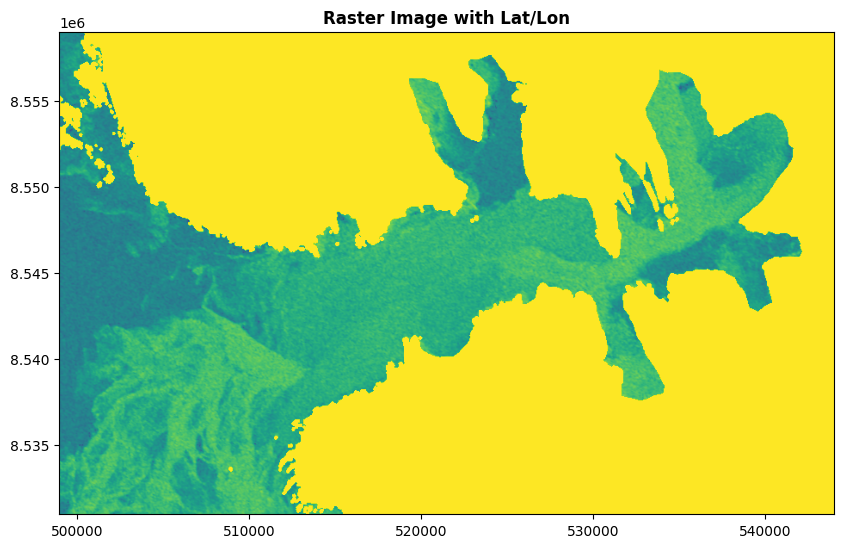

In [213]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCWA_20120604_063534_DES_024_einc_6d27c7e4_387c_4ef5_8bf0_67292936a568.tif"  # Replace with your file path
with rasterio.open(raster_path) as src:
    # Plot the raster
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, title="Raster Image with Lat/Lon")

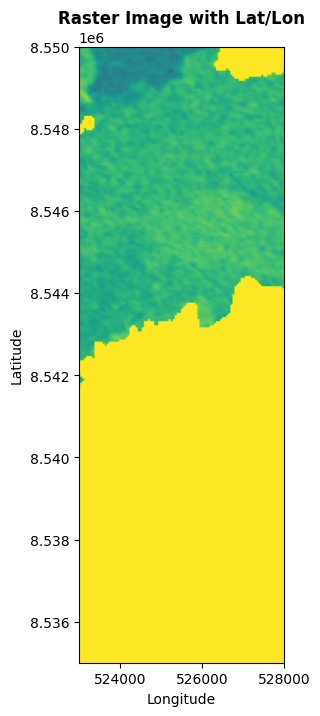

In [50]:
# Open the raster file
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCWA_20120604_063534_DES_024_einc_6d27c7e4_387c_4ef5_8bf0_67292936a568.tif"  # Replace with your file path
with rasterio.open(raster_path) as src:
    # Plot the raster
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, title="Raster Image with Lat/Lon")

    # Add latitude and longitude gridlines
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    # ax.set_xlim(498900, 513300)  # greenland sea edge
    # ax.set_xlim(513300, 520000)
    # ax.set_ylim(8.5350e+06, 8.5470e+06)  # hornsund quadrant-1
    ax.set_xlim(523000, 528000)
    ax.set_ylim(8.5350e+06, 8.5500e+06)  # hornsund quadrant-2
    # ax.set_xlim(528000, 530000)
    # ax.set_ylim(8.535e+06, 8.550e+06) # hornsund quadrant-3
 

plt.show()

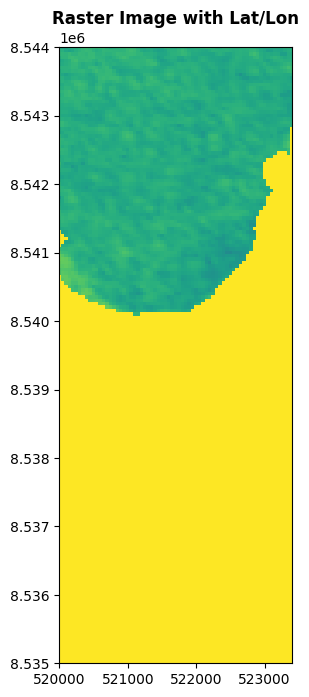

In [84]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCWA_20120604_063534_DES_024_einc_6d27c7e4_387c_4ef5_8bf0_67292936a568.tif"  # Replace with your file path
with rasterio.open(raster_path) as src:
    # Plot the raster
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, title="Raster Image with Lat/Lon")
    # gdf[(520000 <= gdf['longitude']) & (gdf['longitude'] <= 523400) & (gdf['latitude'] >= 8.5350e+06) & (gdf['latitude'] <= 8.5440e+06)]
    ax.set_xlim(520000, 523400)
    ax.set_ylim(8.535e+06, 8.5440e+06) 

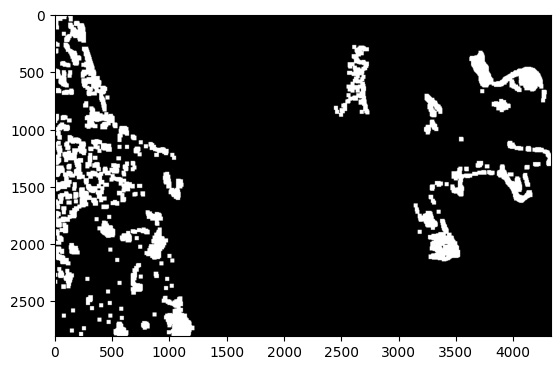

In [36]:
bounds = T_gdf.total_bounds  # [minx, miny, maxx, maxy]
resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
width = int((bounds[2] - bounds[0]) / resolution)
height = int((bounds[3] - bounds[1]) / resolution)
transform = rio.transform.from_bounds(*bounds, width, height)

# Rasterize the GeoDataFrame
shapes = ((geom, value) for geom, value in zip(T_gdf.geometry, T_gdf["value"]))
raster_array = rasterize(shapes, out_shape=(height, width), transform=transform, fill=0, dtype="int32")

plt.imshow(raster_array, cmap=plt.cm.gray)

# # Optional: Save to a GeoTIFF file
# with rio.open(
#     "output_raster.tif",
#     "w",
#     driver="GTiff",
#     height=height,
#     width=width,
#     count=1,
#     dtype=raster_array.dtype,
#     crs=gdf.crs,
#     transform=transform,
# ) as dst:
#     dst.write(raster_array, 1)

In [62]:
# geometry_array = np.array([geom.coords[0] for geom in gdf['centroid']])
# print(geometry_array)

# #Use if you want to aggregate ALL centroids for their collective area
# def calculate_polygon_area(points):
#     # Ensure the points are ordered (convex hull)
#     from scipy.spatial import ConvexHull
#     hull = ConvexHull(points)
#     ordered_points = points[hull.vertices]
    
#     # Shoelace formula
#     x = ordered_points[:, 0]
#     y = ordered_points[:, 1]
#     area = 0.5 * np.abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1)))
#     return area

# # Example: Array of points
# points = geometry_array
# area = calculate_polygon_area(points)
# print(f"Area of the polygon: {area}")

Area of the polygon: 930092999.1757812


In [ ]:
# Pending
# # Open the shapefile
# with fiona.open("your_shapefile.shp", "r") as shapefile:
#     shapes = [(shape(feature["geometry"]), 1) for feature in shapefile]

# # Define raster properties
# out_shape = (100, 100)  # Adjust to your desired resolution
# transform = rasterio.transform.from_bounds(*shapefile.bounds, out_shape[1], out_shape[0])

# # Rasterize
# raster = rasterize(shapes, out_shape=out_shape, transform=transform)

# print(raster) 

In [18]:
mask2 = im < im.mean()

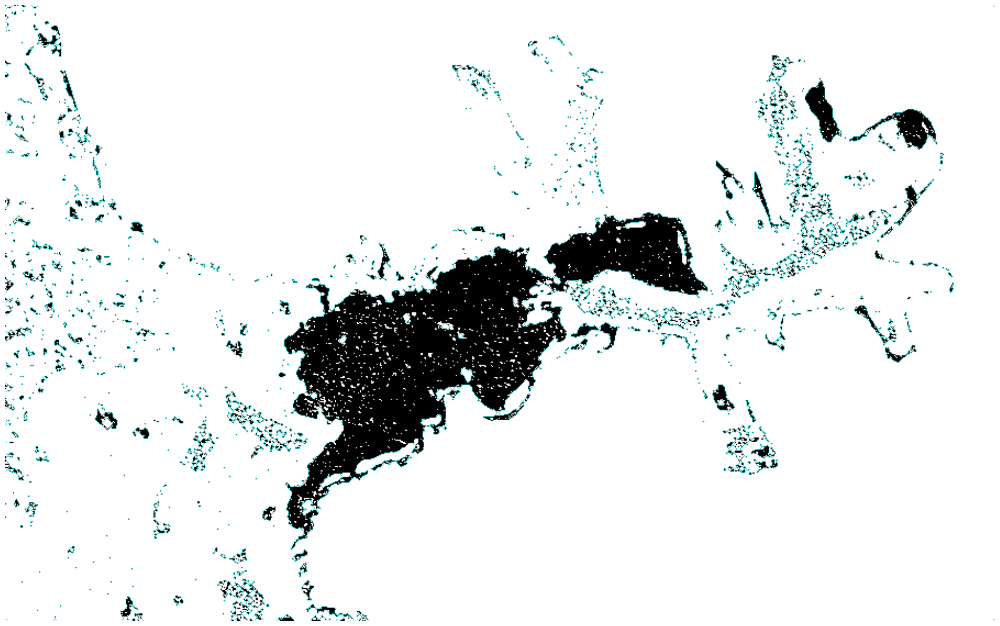

In [19]:
plt.figure(figsize=(25,25))
plt.imshow(mask2, cmap=plt.cm.gray)
omr = ndimage.binary_opening(mask2, structure=disk_structure(2))
plt.contour(omr, [0.5], colors='c', linewidths=0.75)
plt.axis('off')
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/enclosed2.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

In [19]:
mi = opened_more & opened & (~omr)  # This is the original that output to the ppt: Hornsund_11_04092025_2

In [35]:
minus = opened & (~omr)

In [36]:
add = (~opened) & (~opened_more)

In [17]:
# mi = opened & (~omr)
# mi = omr & (~opened_more)
# Wtf? # Now this outputs what the original would do???? DPMO. - Correction, it doesn't even do what the original would do. ????????????????????????????????????????????????????????????????????????
mi = (~opened_more) & (~omr)
# Now this does... still.. WTF?

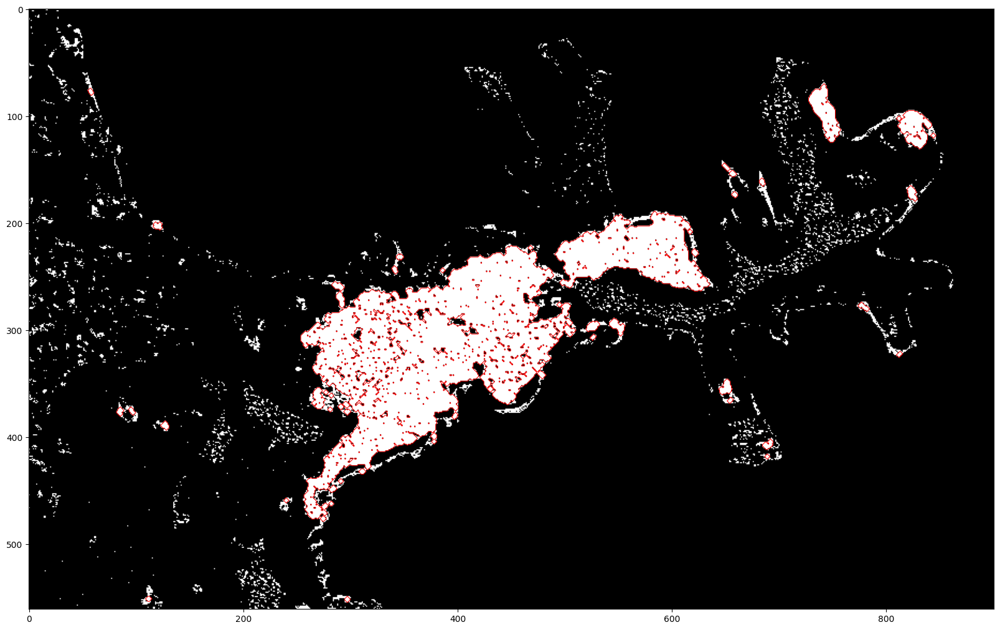

In [20]:
plt.figure(figsize=(20,20))
# plt.subplot(131)
plt.imshow(mask, cmap=plt.cm.gray)
plt.contour(mi, [0.5], colors='r', linewidths=0.75)

In [37]:
arr =  1*mi #Convert from bool to int

In [38]:
out = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/Winter_train_stack/vector_amend/test.shp"
# Output shapefile
shapefile_output = out

 # Extract shapes (polygons) and values
results = (
    {"properties": {"value": value}, "geometry": shape(geom)}
    for geom, value in shapes(arr, transform=transform_))
#     if value != -50  # Exclude no-data or background values
# )

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)

# Save to shapefile
gdf.to_file(shapefile_output)

print(f"Shapefile saved to {shapefile_output}")

Shapefile saved to C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/Winter_train_stack/vector_amend/test.shp


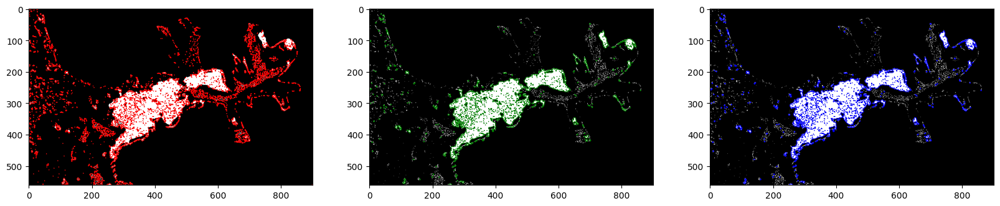

In [37]:
plt.figure(figsize=(20,20))
plt.subplot(131)
plt.imshow(mask, cmap=plt.cm.gray)
plt.contour(mi, [0.5], colors='r', linewidths=0.75)
plt.subplot(132)
plt.imshow(mask, cmap=plt.cm.gray)
plt.contour(minus, [0.5], colors='g', linewidths=0.75)
plt.subplot(133)
plt.imshow(mask, cmap=plt.cm.gray)
plt.contour(add, [0.5], colors='b', linewidths=0.75)
# plt.axis('off')
# plt.savefig('C:/Users/jullian.williams/Desktop/HIRLOMAP/segments.png',dpi=1500,     #resoluton  
#            bbox_inches='tight',  # Tight layout
#            pad_inches=0.1,       # Padding
#            facecolor='white',    # Background color
#            edgecolor='none',     # Edge color
#            format='png')
plt.show()

In [23]:
open_square = ndimage.binary_opening(im)
eroded_square = ndimage.binary_erosion(im)
reconstruction = ndimage.binary_propagation(im, mask=eroded_square)

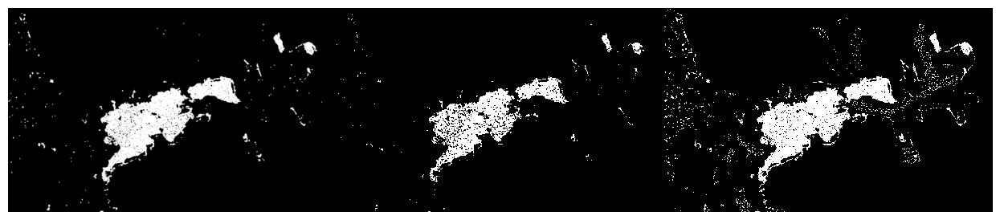

In [24]:
plt.figure(figsize=(12.5, 3))
plt.subplot(131)
plt.imshow(open_square, cmap=plt.cm.gray, interpolation='bilinear')
plt.axis('off')
plt.subplot(132)
plt.imshow(eroded_square, cmap=plt.cm.gray, interpolation='nearest')
plt.axis('off')
plt.subplot(133)
plt.imshow(reconstruction, cmap=plt.cm.gray, interpolation='nearest')
plt.axis('off')

plt.subplots_adjust(wspace=0, hspace=0.02, top=0.99, bottom=0.01, left=0.01, right=0.99)
plt.show()

In [110]:
im = ndimage.gaussian_filter(class_image, sigma=0)

mask = (im > im.mean()).astype(np.float32)
mask += 0.1 * im
img = mask + 0.2*np.random.randn(*mask.shape)

hist, bin_edges = np.histogram(img, bins=60)
bin_centers = 0.5*(bin_edges[:-1] + bin_edges[1:])

binary_img = img > 0.5

In [137]:
# Remove small white regions
open_img = ndimage.binary_opening(binary_img)
# Remove small black hole
close_img = ndimage.binary_closing(open_img)  

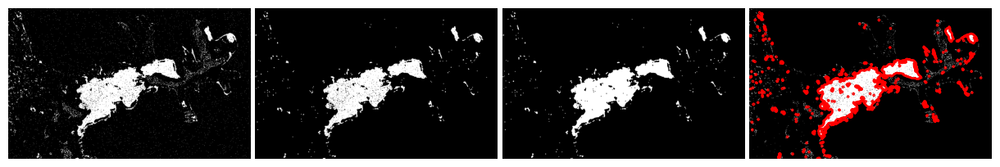

In [138]:
plt.figure(figsize=(12, 3))
plt.subplot(141)
plt.imshow(binary_img, cmap=plt.cm.gray)
plt.axis('off')
plt.subplot(142)
plt.imshow(open_img, cmap=plt.cm.gray)
plt.axis('off')
plt.subplot(143)
plt.imshow(close_img, cmap=plt.cm.gray)
plt.axis('off')
plt.subplot(144)
plt.imshow(mask, cmap=plt.cm.gray)
plt.contour(close_img, [0.5], linewidths=2, colors='r')
plt.axis('off')
plt.subplots_adjust(wspace=0.02, hspace=0.3, top=1, bottom=0.1, left=0, right=1)
plt.show()

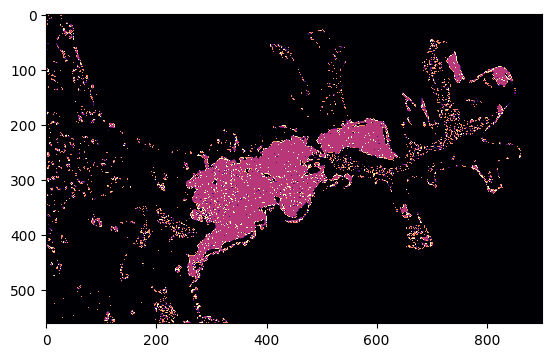

In [126]:
hex_colors = ['#000004','#fc8961','#51127c','#fcfdbf','#b73779']
custom_cmap = ListedColormap(hex_colors)
# Plot the image and display the results
plt.imshow(class_image, cmap=custom_cmap)

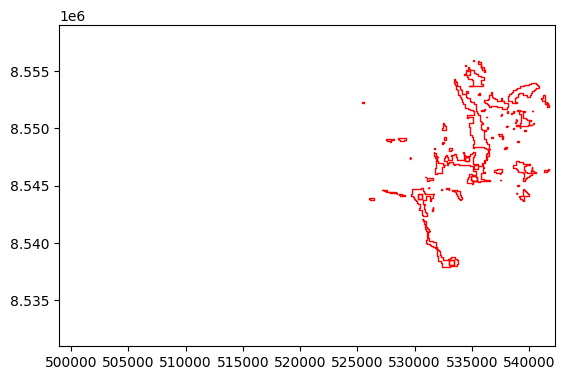

In [3]:
raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
with rio.open(raster_path) as src:
    image = src.read()  # Read all bands
    profile = src.profile  # Save metadata
    b1 = src.read(1)
    b2 = src.read(2)
    b3 = src.read(3)
    b4 = src.read(4)
    b5 = src.read(5)
    b6 = src.read(6)
    b7 = src.read(7)
    b8 = src.read(8)
    b9 = src.read(9)
    b10 = src.read(10)
    b11 = src.read(11)
    b12 = src.read(12)
    b13 = src.read(13)
    b14 = src.read(14)

    image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)

    bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
    bands = bands.reshape(int(np.prod(bands.shape)/14),14)

# raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130628_154748_ASC_101_einc_9f05602b_4f4d_408d_bd24_4a090af4f0d0.tif"
raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif"
with rio.open(raster_path_) as src_:
    # image_, transformed = rio.mask.mask(src_, shapes, crop=True, filled=True)
    # image_ = src_.read()  # Read all bands
    profile_ = src_.profile  # Save metadata
    transform_ = src_.transform
    b1_ = src_.read(1)
    b2_ = src_.read(2)
    b3_ = src_.read(3)
    b4_ = src_.read(4)
    b5_ = src_.read(5)
    b6_ = src_.read(6)
    b7_ = src_.read(7)
    b8_ = src_.read(8)
    b9_ = src_.read(9)
    b10_ = src_.read(10)
    b11_ = src_.read(11)
    b12_ = src_.read(12)
    b13_ = src_.read(13)
    b14_ = src_.read(14)

    b1_ = np.where(np.isinf(b1_), np.nan, b1_)
    b2_ = np.where(np.isinf(b2_), np.nan, b2_)          
    b3_ = np.where(np.isinf(b3_), np.nan, b3_)
    b4_ = np.where(np.isinf(b4_), np.nan, b4_)
    b5_ = np.where(np.isinf(b5_), np.nan, b5_)
    b6_ = np.where(np.isinf(b6_), np.nan, b6_)
    b7_ = np.where(np.isinf(b7_), np.nan, b7_)
    b8_ = np.where(np.isinf(b8_), np.nan, b8_)
    b9_ = np.where(np.isinf(b9_), np.nan, b9_)
    b10_ = np.where(np.isinf(b10_), np.nan, b10_)
    b11_ = np.where(np.isinf(b11_), np.nan, b11_)
    b12_ = np.where(np.isinf(b12_), np.nan, b12_)
    b13_ = np.where(np.isinf(b13_), np.nan, b13_)
    b14_ = np.where(np.isinf(b14_), np.nan, b14_)
                
    nan1 = 9
    nan2 = 81
    
    b1_ = np.nan_to_num(b1_, nan=nan1)
    b2_ = np.nan_to_num(b2_, nan=nan1)
    b3_ = np.nan_to_num(b3_, nan=nan1)
    b4_ = np.nan_to_num(b4_, nan=nan1)
    b5_ = np.nan_to_num(b5_, nan=nan2)
    b6_ = np.nan_to_num(b6_, nan=nan2)
    b7_ = np.nan_to_num(b7_, nan=nan1)
    b8_ = np.nan_to_num(b8_, nan=nan1)
    b9_ = np.nan_to_num(b9_, nan=nan1)
    b10_ = np.nan_to_num(b10_, nan=nan1)
    b11_ = np.nan_to_num(b11_, nan=nan1)
    b12_ = np.nan_to_num(b12_, nan=nan1)
    b13_ = np.nan_to_num(b13_, nan=nan2)
    b14_ = np.nan_to_num(b14_, nan=nan2)


    mask1 = (b1_ ==9) & (b1_== 81)
    mask2 = (b2_ ==9) & (b2_== 81)
    mask3 = (b3_ ==9) & (b3_== 81)
    mask4 = (b4_ ==9) & (b4_== 81)
    mask5 = (b5_ ==9) & (b5_== 81)
    mask6 = (b6_ ==9) & (b6_== 81)
    mask7 = (b7_ ==9) & (b7_== 81)
    mask8 = (b8_ ==9) & (b8_== 81)
    mask9 = (b9_ ==9) & (b9_== 81)
    mask10 = (b10_ ==9) & (b10_== 81)
    mask11 = (b11_ ==9) & (b11_== 81)
    mask12 = (b12_ ==9) & (b12_== 81)
    mask13 = (b13_ ==9) & (b13_== 81)
    mask14 = (b14_ ==9) & (b14_== 81)
    
    b1_ = np.ma.masked_array(b1_, mask1)
    b2_ = np.ma.masked_array(b2_, mask2)
    b3_ = np.ma.masked_array(b3_, mask3)
    b4_ = np.ma.masked_array(b4_, mask4)
    b5_ = np.ma.masked_array(b5_, mask5)
    b6_ = np.ma.masked_array(b6_, mask6)
    b7_ = np.ma.masked_array(b7_, mask7)
    b8_ = np.ma.masked_array(b8_, mask8)
    b9_ = np.ma.masked_array(b9_, mask9)
    b10_ = np.ma.masked_array(b10_, mask10)
    b11_ = np.ma.masked_array(b11_, mask11)
    b12_ = np.ma.masked_array(b12_, mask12)
    b13_ = np.ma.masked_array(b13_, mask13)
    b14_ = np.ma.masked_array(b14_, mask14)

    # image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)

    bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
    bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)


    # Step 2: Load the shapefile
    shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
    shapefile = gpd.read_file(shapefile_path)
    
    # Step 3: Extract training data
    # Assuming the shapefile has a 'class' column for labels
    training_data = []
    labels = []
    
    for _, row in shapefile.iterrows():
        geom = row.geometry
        label = row['Class_']
        mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
        pixels = image[mask]
        training_data.append(pixels)
        labels.extend([label] * len(pixels))
    
    training_data = np.vstack(training_data)
    labels = np.array(labels)
    
    # Step 4: Train the SVM model
    X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
    clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
    clf.fit(X_train, y_train)
    
    # Step 5: Classify the image
    predicted = clf.predict(bands_) #Predict using the model
    class_image = predicted.reshape(b1_.shape)
    
    y_pred = clf.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    # print(f"Accuracy: {accuracy:.2f}")
    
    # Generate classification report
    report = classification_report(y_test, y_pred)
    # print(report)
    
    
    im = ndimage.gaussian_filter(class_image, sigma=0)
    mask = im > im.mean()
    
    label_im, nb_labels = ndimage.label(mask)
    sizes = ndimage.sum(mask, label_im, range(nb_labels + 1))
    mean_vals = ndimage.sum(im, label_im, range(1, nb_labels + 1))
    
    mask_size = sizes < 1000
    remove_pixel = mask_size[label_im]
    remove_pixel.shape
    label_im[remove_pixel] = 0
    
    labels = np.unique(label_im)
    label_im = np.searchsorted(labels, label_im)
    
    slice_x, slice_y = ndimage.find_objects(label_im==0)[0]
    roi = im[slice_x, slice_y]
    
    def disk_structure(n):
        struct = np.zeros((2 * n + 1, 2 * n + 1))
        x, y = np.indices((2 * n + 1, 2 * n + 1))
        mask = (x - n)**2 + (y - n)**2 <= n**2
        struct[mask] = 1
        return struct.astype(np.bool_)
    
    def granulometry(data, sizes=None):
        s = max(data.shape)
        if sizes is None:
            sizes = range(1, s/2, 2)
        granulo = [ndimage.binary_opening(data, \
            structure=disk_structure(n)).sum() for n in sizes]
        return granulo
    
    
    np.random.seed(1)
    n = 10
    l = 256
    im = ndimage.gaussian_filter(im, sigma=0.1)
    mask = im > im.mean()
    granulo = granulometry(mask, sizes=np.arange(2, 19, 4))
    
    bigger_points = ndimage.grey_dilation(im, size=(7,7), structure=np.ones((7,7)))
    
    mk_ = bigger_points > bigger_points.mean()
    op = ndimage.binary_opening(mk_, structure=disk_structure(3))
    arr =  1*mk_
 
     # Extract shapes (polygons) and values
    results = (
        {"properties": {"value": value}, "geometry": shape(geom)}
        for geom, value in shapes(arr, transform=transform_)
    )
 
    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)
    
    
    gdf['area'] = gdf.geometry.area
    gdf['centroid'] = gdf.geometry.centroid
    # Extract latitude and longitude from centroids
    gdf['longitude'] = gdf.centroid.x
    gdf['latitude'] = gdf.centroid.y
    
    N_gdf = gdf[(525000 <= gdf['longitude']) & (gdf['longitude'] <= 541628.7)] #522990
    
    # Plot the GeoDataFrame
    ax = N_gdf.plot(edgecolor ='red', facecolor = 'None')

    minx=498975.0
    miny=8530975.0
    maxx=542275.0
    maxy=8559025.0
    
    # Set axis limits (adjust values as needed)
    ax.set_xlim([minx, maxx])  # Replace with your desired x-axis range
    ax.set_ylim([miny, maxy])
    
    
    bounds = N_gdf.total_bounds  # [minx, miny, maxx, maxy]
    resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
    width = int((bounds[2] - bounds[0]) / resolution)
    height = int((bounds[3] - bounds[1]) / resolution)
    transform = rio.transform.from_bounds(*bounds, width, height)
    
    # Rasterize the GeoDataFrame
    shapes = ((geom, value) for geom, value in zip(N_gdf.geometry, N_gdf["value"]))
    raster_array = rasterize(shapes, out_shape=(height, width), transform=transform, fill=0, dtype="int32")
    
    plt.imshow(raster_array, cmap=plt.cm.gray)
    
    
    plt.show()

In [ ]:
input_dir = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/test_reclass/"
output_dir = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/test_reclass/out/"

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Loop through all .tif files in the input directory
for subdir, _, files in os.walk(input_dir):
    for filename in files: 
        # Check if the file is an image (e.g., .jpg, .png)
        if filename.endswith(('.png')):
            input_path = os.path.join(subdir, filename)
            output_path = os.path.join(output_dir, filename.replace(".png", ".png"))

    
            raster_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/output_bandsSVMtrain_Pair.tif"
            with rio.open(raster_path) as src:
                image = src.read()  # Read all bands
                profile = src.profile  # Save metadata
                b1 = src.read(1)
                b2 = src.read(2)
                b3 = src.read(3)
                b4 = src.read(4)
                b5 = src.read(5)
                b6 = src.read(6)
                b7 = src.read(7)
                b8 = src.read(8)
                b9 = src.read(9)
                b10 = src.read(10)
                b11 = src.read(11)
                b12 = src.read(12)
                b13 = src.read(13)
                b14 = src.read(14)
            
                image = np.moveaxis(image, 0, -1)  # Rearrange to (rows, cols, bands)
            
                bands = np.dstack((b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b14))  # <-- Why must b1 be alpha? Odd.
                bands = bands.reshape(int(np.prod(bands.shape)/14),14)
            
            # raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/GLCM_stack/RS2_SCNA_20130628_154748_ASC_101_einc_9f05602b_4f4d_408d_bd24_4a090af4f0d0.tif"
            raster_path_ = "C:/Users/jullian.williams/Desktop/HIRLOMAP/frnd/ALL_SAT/composite/RS2/3band_/amend/RS2_SCWA_20081201_055756_DES_238_einc_2373323b_f4c8_44cb_b052_174b311daf16.tif"
            with rio.open(raster_path_) as src_:
                # image_, transformed = rio.mask.mask(src_, shapes, crop=True, filled=True)
                # image_ = src_.read()  # Read all bands
                profile_ = src_.profile  # Save metadata
                transform_ = src_.transform
                b1_ = src_.read(1)
                b2_ = src_.read(2)
                b3_ = src_.read(3)
                b4_ = src_.read(4)
                b5_ = src_.read(5)
                b6_ = src_.read(6)
                b7_ = src_.read(7)
                b8_ = src_.read(8)
                b9_ = src_.read(9)
                b10_ = src_.read(10)
                b11_ = src_.read(11)
                b12_ = src_.read(12)
                b13_ = src_.read(13)
                b14_ = src_.read(14)
            
                b1_ = np.where(np.isinf(b1_), np.nan, b1_)
                b2_ = np.where(np.isinf(b2_), np.nan, b2_)          
                b3_ = np.where(np.isinf(b3_), np.nan, b3_)
                b4_ = np.where(np.isinf(b4_), np.nan, b4_)
                b5_ = np.where(np.isinf(b5_), np.nan, b5_)
                b6_ = np.where(np.isinf(b6_), np.nan, b6_)
                b7_ = np.where(np.isinf(b7_), np.nan, b7_)
                b8_ = np.where(np.isinf(b8_), np.nan, b8_)
                b9_ = np.where(np.isinf(b9_), np.nan, b9_)
                b10_ = np.where(np.isinf(b10_), np.nan, b10_)
                b11_ = np.where(np.isinf(b11_), np.nan, b11_)
                b12_ = np.where(np.isinf(b12_), np.nan, b12_)
                b13_ = np.where(np.isinf(b13_), np.nan, b13_)
                b14_ = np.where(np.isinf(b14_), np.nan, b14_)
                            
                nan1 = 9
                nan2 = 81
                
                b1_ = np.nan_to_num(b1_, nan=nan1)
                b2_ = np.nan_to_num(b2_, nan=nan1)
                b3_ = np.nan_to_num(b3_, nan=nan1)
                b4_ = np.nan_to_num(b4_, nan=nan1)
                b5_ = np.nan_to_num(b5_, nan=nan2)
                b6_ = np.nan_to_num(b6_, nan=nan2)
                b7_ = np.nan_to_num(b7_, nan=nan1)
                b8_ = np.nan_to_num(b8_, nan=nan1)
                b9_ = np.nan_to_num(b9_, nan=nan1)
                b10_ = np.nan_to_num(b10_, nan=nan1)
                b11_ = np.nan_to_num(b11_, nan=nan1)
                b12_ = np.nan_to_num(b12_, nan=nan1)
                b13_ = np.nan_to_num(b13_, nan=nan2)
                b14_ = np.nan_to_num(b14_, nan=nan2)
            
            
                mask1 = (b1_ ==9) & (b1_== 81)
                mask2 = (b2_ ==9) & (b2_== 81)
                mask3 = (b3_ ==9) & (b3_== 81)
                mask4 = (b4_ ==9) & (b4_== 81)
                mask5 = (b5_ ==9) & (b5_== 81)
                mask6 = (b6_ ==9) & (b6_== 81)
                mask7 = (b7_ ==9) & (b7_== 81)
                mask8 = (b8_ ==9) & (b8_== 81)
                mask9 = (b9_ ==9) & (b9_== 81)
                mask10 = (b10_ ==9) & (b10_== 81)
                mask11 = (b11_ ==9) & (b11_== 81)
                mask12 = (b12_ ==9) & (b12_== 81)
                mask13 = (b13_ ==9) & (b13_== 81)
                mask14 = (b14_ ==9) & (b14_== 81)
                
                b1_ = np.ma.masked_array(b1_, mask1)
                b2_ = np.ma.masked_array(b2_, mask2)
                b3_ = np.ma.masked_array(b3_, mask3)
                b4_ = np.ma.masked_array(b4_, mask4)
                b5_ = np.ma.masked_array(b5_, mask5)
                b6_ = np.ma.masked_array(b6_, mask6)
                b7_ = np.ma.masked_array(b7_, mask7)
                b8_ = np.ma.masked_array(b8_, mask8)
                b9_ = np.ma.masked_array(b9_, mask9)
                b10_ = np.ma.masked_array(b10_, mask10)
                b11_ = np.ma.masked_array(b11_, mask11)
                b12_ = np.ma.masked_array(b12_, mask12)
                b13_ = np.ma.masked_array(b13_, mask13)
                b14_ = np.ma.masked_array(b14_, mask14)
            
                # image_ = np.moveaxis(image_, 0, -1)  # Rearrange to (rows, cols, bands)
            
                bands_ = np.dstack((b1_,b2_,b3_,b4_,b5_,b6_,b7_,b8_,b9_,b10_,b11_,b12_,b13_,b14_))  # <-- Why must b1 be alpha? Odd.
                bands_ = bands_.reshape(int(np.prod(bands_.shape)/14),14)
            # Step 2: Load the shapefile
                shapefile_path = "C:/Users/jullian.williams/Desktop/HIRLOMAP/ROI/PTS_MERGED/HS_ice_water_MASTER_.shp"
                shapefile = gpd.read_file(shapefile_path)
                
                # Step 3: Extract training data
                # Assuming the shapefile has a 'class' column for labels
                training_data = []
                labels = []
                
                for _, row in shapefile.iterrows():
                    geom = row.geometry
                    label = row['Class_']
                    mask = rio.features.geometry_mask([geom], transform=profile['transform'], invert=True, out_shape=image.shape[:2])
                    pixels = image[mask]
                    training_data.append(pixels)
                    labels.extend([label] * len(pixels))
                
                training_data = np.vstack(training_data)
                labels = np.array(labels)
                
                # Step 4: Train the SVM model
                X_train, X_test, y_train, y_test = train_test_split(training_data, labels, test_size=0.3, random_state=42)
                clf = make_pipeline(StandardScaler(),LinearSVC(random_state=0, tol=1e-3))
                clf.fit(X_train, y_train)
                
                # Step 5: Classify the image
                predicted = clf.predict(bands_) #Predict using the model
                class_image = predicted.reshape(b1_.shape)
                
                y_pred = clf.predict(X_test)
                
                accuracy = accuracy_score(y_test, y_pred)
                # print(f"Accuracy: {accuracy:.2f}")
                
                # Generate classification report
                report = classification_report(y_test, y_pred)
                # print(report)
                
                
                im = ndimage.gaussian_filter(class_image, sigma=0)
                mask = im > im.mean()
                
                label_im, nb_labels = ndimage.label(mask)
                sizes = ndimage.sum(mask, label_im, range(nb_labels + 1))
                mean_vals = ndimage.sum(im, label_im, range(1, nb_labels + 1))
                
                mask_size = sizes < 1000
                remove_pixel = mask_size[label_im]
                remove_pixel.shape
                label_im[remove_pixel] = 0
                
                labels = np.unique(label_im)
                label_im = np.searchsorted(labels, label_im)
                
                slice_x, slice_y = ndimage.find_objects(label_im==0)[0]
                roi = im[slice_x, slice_y]
                
                def disk_structure(n):
                    struct = np.zeros((2 * n + 1, 2 * n + 1))
                    x, y = np.indices((2 * n + 1, 2 * n + 1))
                    mask = (x - n)**2 + (y - n)**2 <= n**2
                    struct[mask] = 1
                    return struct.astype(np.bool_)
                
                def granulometry(data, sizes=None):
                    s = max(data.shape)
                    if sizes is None:
                        sizes = range(1, s/2, 2)
                    granulo = [ndimage.binary_opening(data, \
                        structure=disk_structure(n)).sum() for n in sizes]
                    return granulo
                
                
                np.random.seed(1)
                n = 10
                l = 256
                im = ndimage.gaussian_filter(im, sigma=0.1)
                mask = im > im.mean()
                granulo = granulometry(mask, sizes=np.arange(2, 19, 4))
                
                bigger_points = ndimage.grey_dilation(im, size=(7,7), structure=np.ones((7,7)))
                
                mk_ = bigger_points > bigger_points.mean()
                op = ndimage.binary_opening(mk_, structure=disk_structure(3))
                arr =  1*mk_
                
                
                 # Extract shapes (polygons) and values
                results = (
                    {"properties": {"value": value}, "geometry": shape(geom)}
                    for geom, value in shapes(arr, transform=transform_))
                #     if value != -50  # Exclude no-data or background values
                # )
                
                # Convert to GeoDataFrame
                gdf = gpd.GeoDataFrame.from_features(results, crs=src_.crs)
                
                
                gdf['area'] = gdf.geometry.area
                gdf['centroid'] = gdf.geometry.centroid
                # Extract latitude and longitude from centroids
                gdf['longitude'] = gdf.centroid.x
                gdf['latitude'] = gdf.centroid.y
                
                N_gdf = gdf[(525000 <= gdf['longitude']) & (gdf['longitude'] <= 541628.7)] #522990
                
                # Plot the GeoDataFrame
                ax = N_gdf.plot(edgecolor ='red', facecolor = 'None')
                
                # Set axis limits (adjust values as needed)
                ax.set_xlim([minx, maxx])  # Replace with your desired x-axis range
                ax.set_ylim([miny, maxy])
                
                
                bounds = N_gdf.total_bounds  # [minx, miny, maxx, maxy]
                resolution = 10  # Define resolution (e.g., 10x10 units per pixel)
                width = int((bounds[2] - bounds[0]) / resolution)
                height = int((bounds[3] - bounds[1]) / resolution)
                transform = rio.transform.from_bounds(*bounds, width, height)
                
                # Rasterize the GeoDataFrame
                shapes = ((geom, value) for geom, value in zip(N_gdf.geometry, N_gdf["value"]))
                raster_array = rasterize(shapes, out_shape=(height, width), transform=transform, fill=0, dtype="int32")
                
                plt.imshow(raster_array, cmap=plt.cm.gray)
                
                
                plt.show()
                

------------------------------------------------------------------------------------------------------------------------------------

## References:

https://github.com/SnehaShukla937/SupportVectorMachine/tree/master

https://github.com/Kamrrann/Sentinel2_Classification_Using_Deep-Convolutional-Neural-Network/tree/main

https://github.com/kunsan1/Classification-Using-ANN/blob/main/Kunal_Sangale_ANN_Model.ipynb

https://www.statology.org/pandas-merge-multiple-dataframes/